In [5]:
import yfinance as yf
import numpy as np
import os
import pandas as pd
import statsmodels.api as sm
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
import seaborn as sns
import itertools

In [6]:
TICKERS = ["SPY", "SH", "SDS", "UPRO", "SSO", "SPXU"]
LEVERAGES = {"SPY": "1x", "SSO": "2x", "UPRO": "3x", "SH":"-1x", "SDS":"-2x", "SPXU": "-3x"}
TICKERS2INDEX = {'SPY': 0, 'SH': 1, 'SDS': 2, 'UPRO': 3, 'SSO': 4, 'SPXU': 5}

In [283]:
# sns.set(rc={'figure.figsize':(8,5)})

## 1. Data Exploration - Close Price version
6/1~6/15

In [7]:
def collect_historical(ticker):
    ticker_class = yf.Ticker(ticker)
    
    # Get historical adjusted price, from the first day traded
    # Adjusted for both dividends and splits
    hist = ticker_class.history(period="max")
    
    return hist

In [107]:
data = dict()

for ticker in TICKERS:
    data[ticker] = collect_historical(ticker)

In [142]:
def plot(y_ticker, x_ticker, period=None, price_type="Close"):
    """ 
    Usage: To do a linear regression of y=SPY on x=SH, call `plot("SPY", "SH")`
    This function plots two graph about the relationship between two tickers, and do OLS with them.
        plot 1: The scatter plot of two etf prices
        plot 2: The lineplot of two etf prices over time
    Arguments:
        y_ticker: ticker of the etf to be the dependent variable
        x_ticker: ticker of the etf to be the independent variable
        period (day): If given, use the last `period` number of closed price 
                    If not given, use all the data since both tickers are traded
    """
    
    y = data[y_ticker][price_type] if y_ticker in data else collect_historical(y_ticker)
    x = data[x_ticker][price_type] if x_ticker in data else collect_historical(x_ticker)
    
    period = min(len(y), len(x)) if period == None else period
    y = y[-period:]
    x = x[-period:]
    
    data_pair = pd.DataFrame()
    data_pair[x_ticker], data_pair[y_ticker], data_pair["Year"] = x, y, list(map(lambda x: str(x.year), x.index))
    
    plt.figure(figsize=(20,8))
    plt.subplot(1,2,1)
    plt.title("Relationship between {} and {}".format(y_ticker, x_ticker), fontsize=20)
    sns.scatterplot(data=data_pair, x=x_ticker, y=y_ticker, hue="Year")
    
    x = sm.add_constant(x)
    model = sm.OLS(y, x)
    result = model.fit()
    constant = result.params[0]
    slope = result.params[1]
    plt.text((max(x["Close"]) + min(x["Close"])) / 2, 0.95*max(y), r'${}={}*{} + {}$'.format(
        y_ticker, round(slope, 2), x_ticker, round(constant, 2)), fontsize=20, ha='center')
    
    plt.subplot(1,2,2)
    plt.title("Price Movement of {} and {}".format(y_ticker, x_ticker), fontsize=20)
    sns.lineplot(data=data_pair)
    plt.ylabel("Price")
    plt.show()
    plt.close()
    
    return data_pair, slope, constant

### (a) Use all the data since the ticker is first traded

1. Relationship between SPY(1x) and SH(-1x)


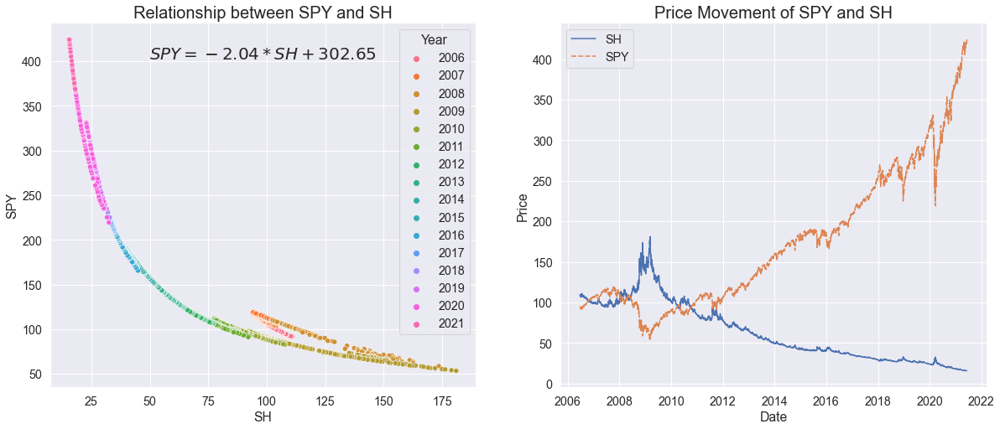

2. Relationship between SPY(1x) and SDS(-2x)


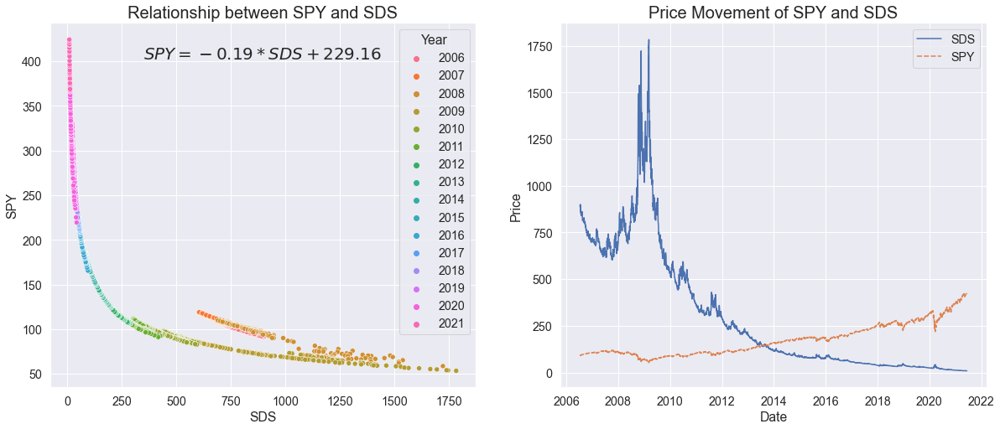

3. Relationship between SPY(1x) and UPRO(3x)


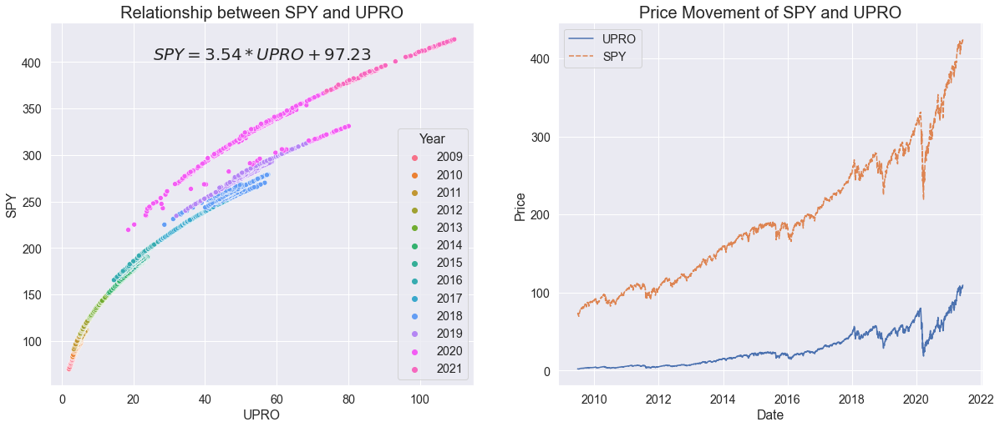

4. Relationship between SPY(1x) and SSO(2x)


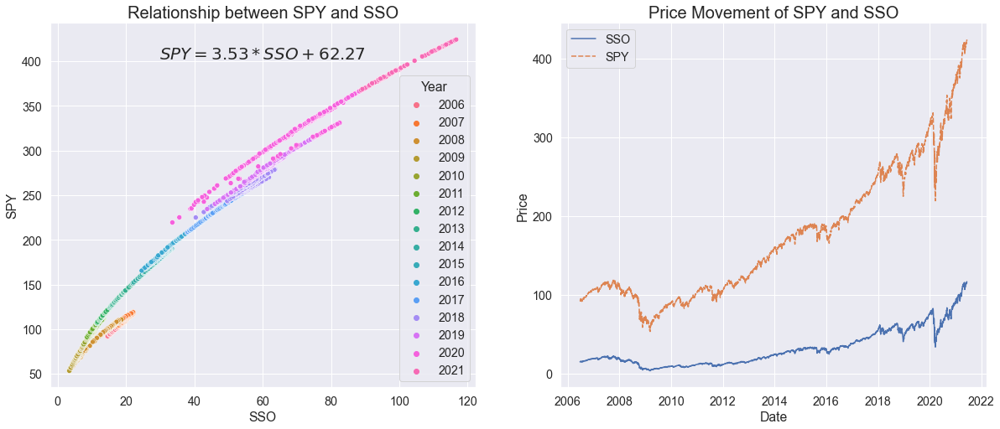

5. Relationship between SPY(1x) and SPXU(-3x)


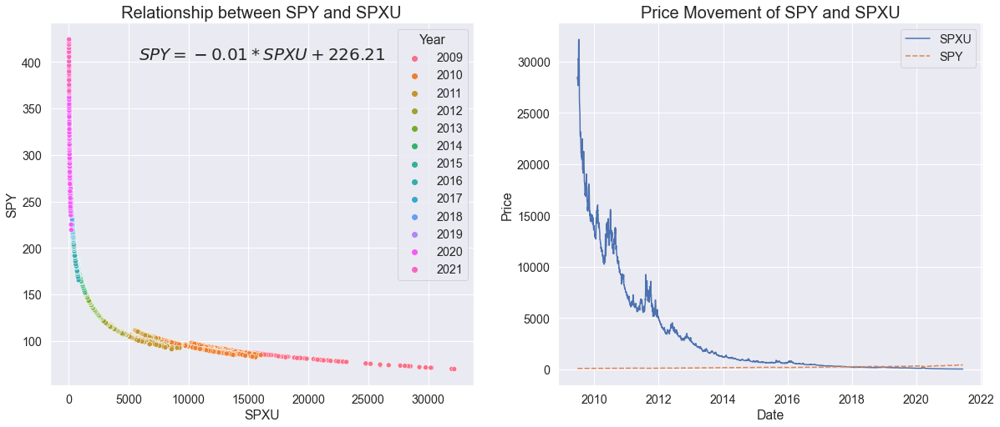

6. Relationship between SH(-1x) and SDS(-2x)


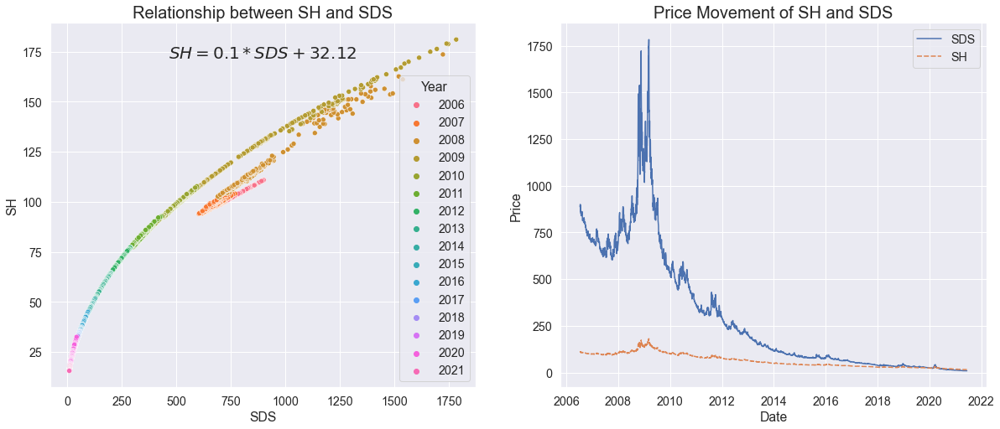

7. Relationship between SH(-1x) and UPRO(3x)


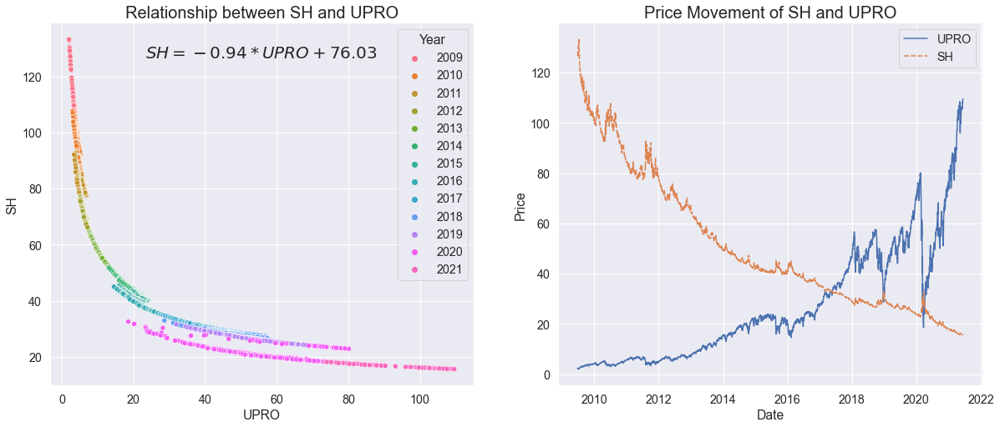

8. Relationship between SH(-1x) and SSO(2x)


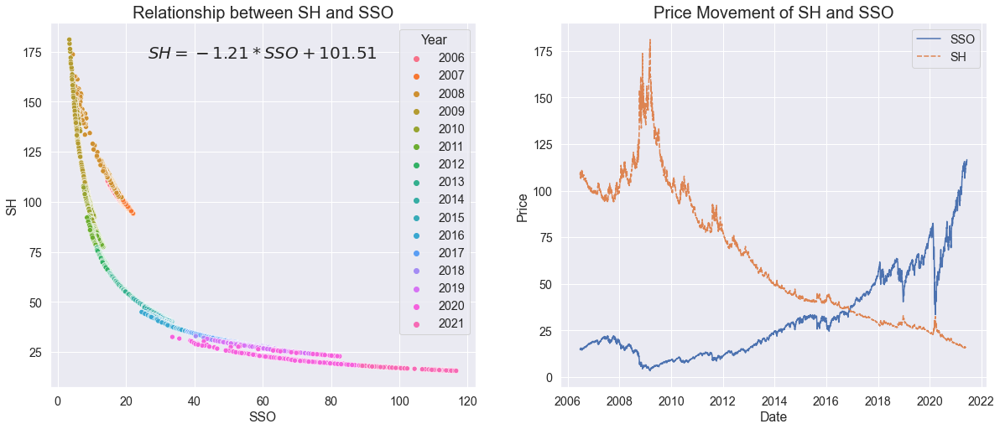

9. Relationship between SH(-1x) and SPXU(-3x)


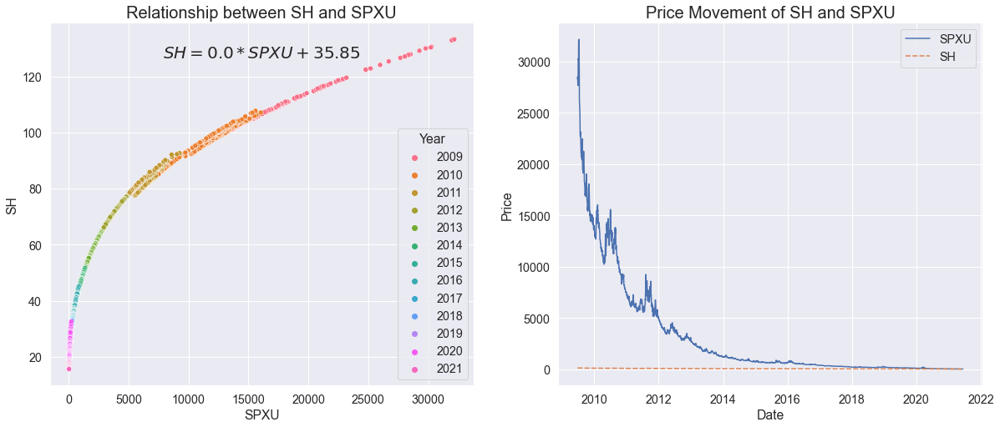

10. Relationship between SDS(-2x) and UPRO(3x)


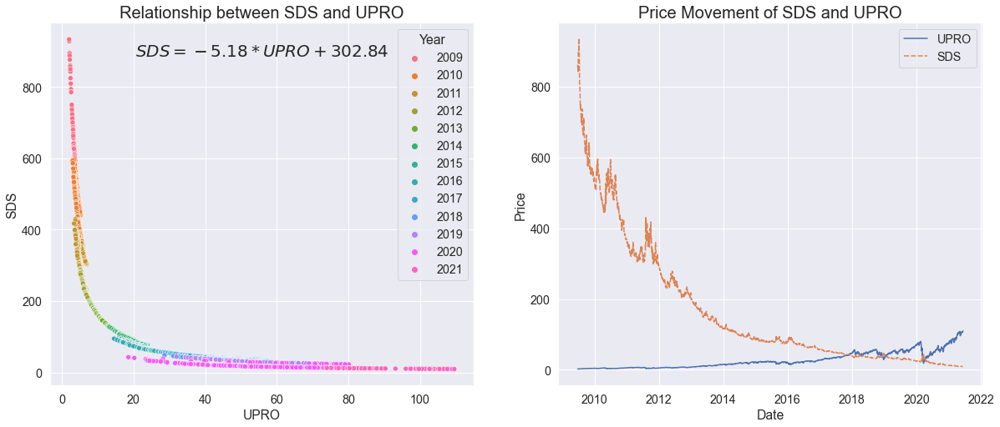

11. Relationship between SDS(-2x) and SSO(2x)


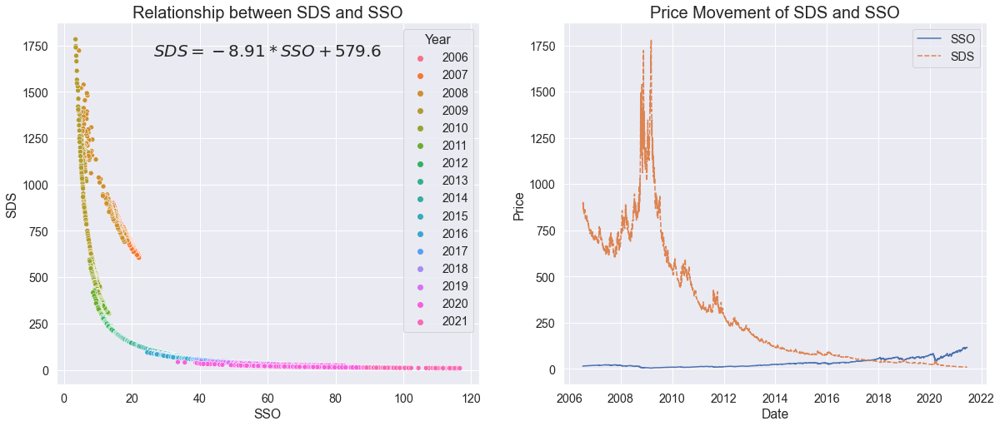

12. Relationship between SDS(-2x) and SPXU(-3x)


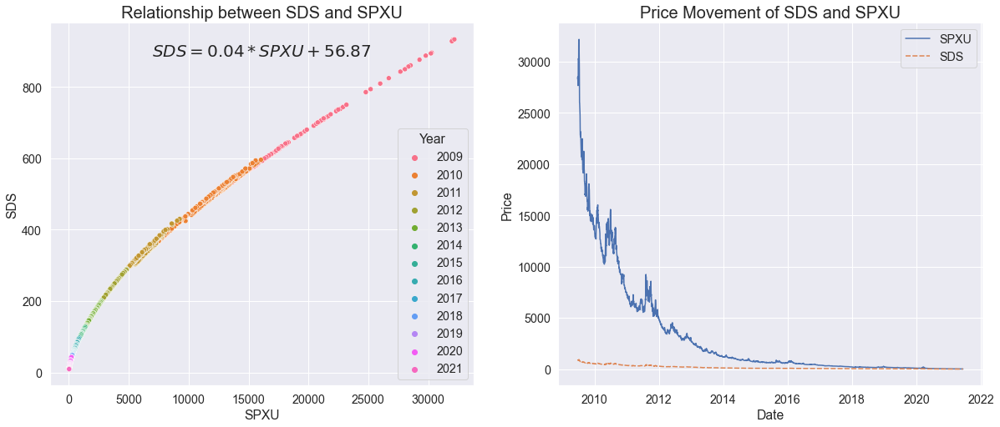

13. Relationship between UPRO(3x) and SSO(2x)


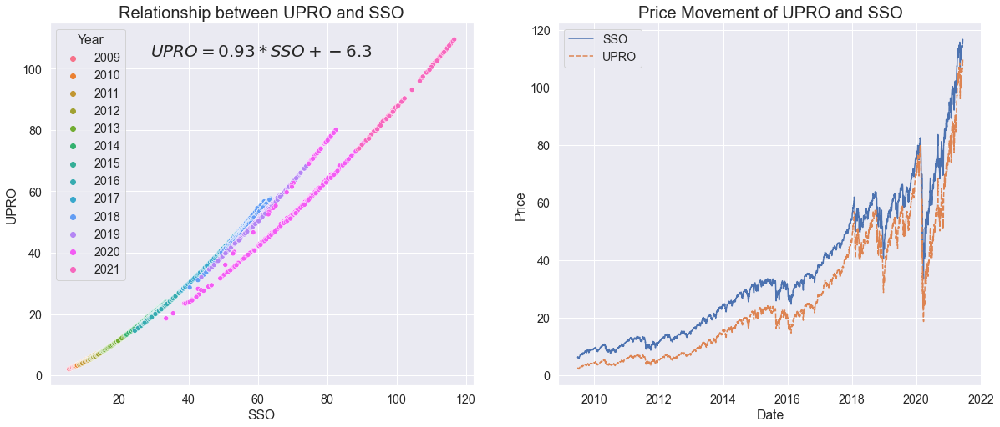

14. Relationship between UPRO(3x) and SPXU(-3x)


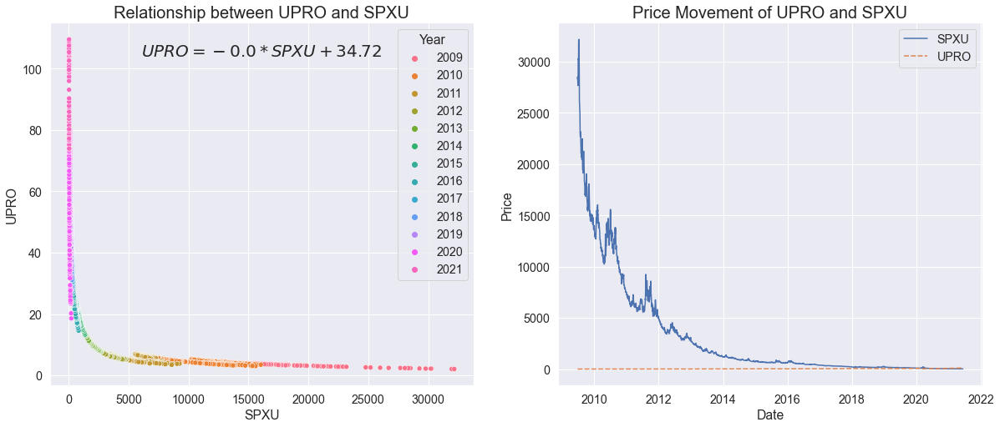

15. Relationship between SSO(2x) and SPXU(-3x)


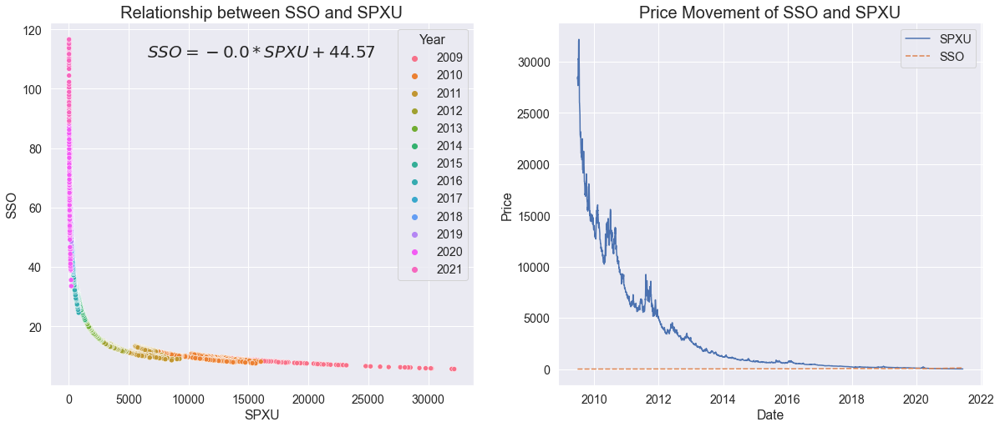

In [287]:
period = None # Number of samples to plot
for i, (x_ticker, y_ticker) in enumerate(itertools.combinations(TICKERS, 2)):
    print("{}. Relationship between {}({}) and {}({})".format(i + 1, x_ticker, LEVERAGES[x_ticker], y_ticker, LEVERAGES[y_ticker]))
    data_pair, slope, constant = plot(x_ticker, y_ticker, period)

### (b) Use two years data

1. Relationship between SPY(1x) and SH(-1x)


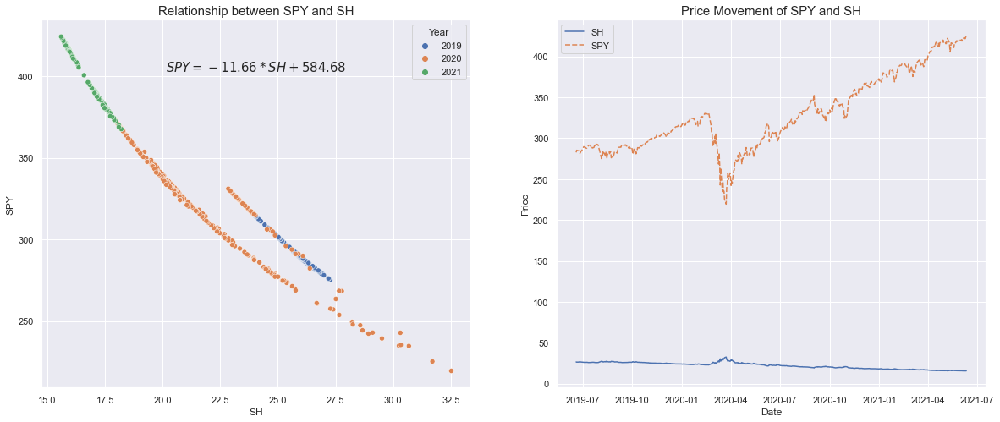

2. Relationship between SPY(1x) and SDS(-2x)


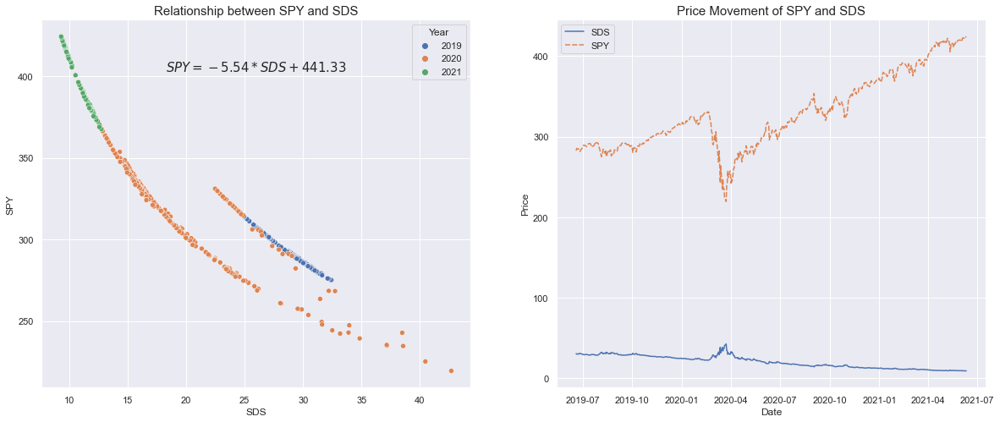

3. Relationship between SPY(1x) and UPRO(3x)


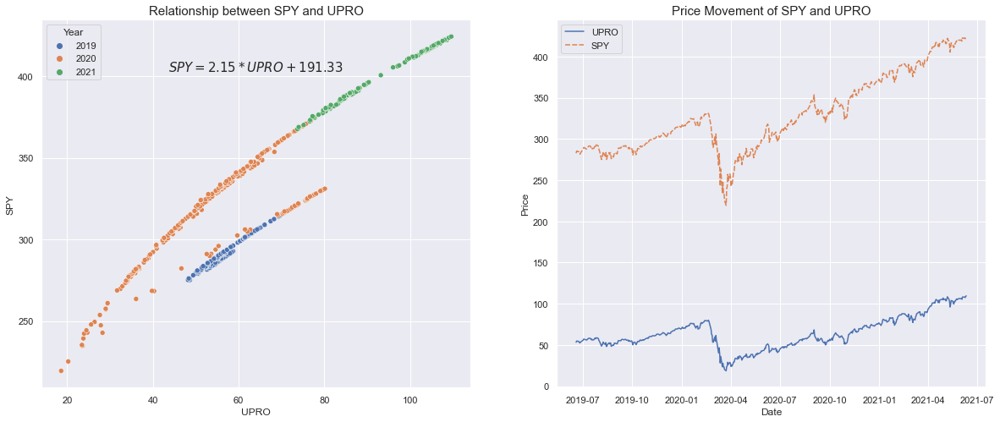

4. Relationship between SPY(1x) and SSO(2x)


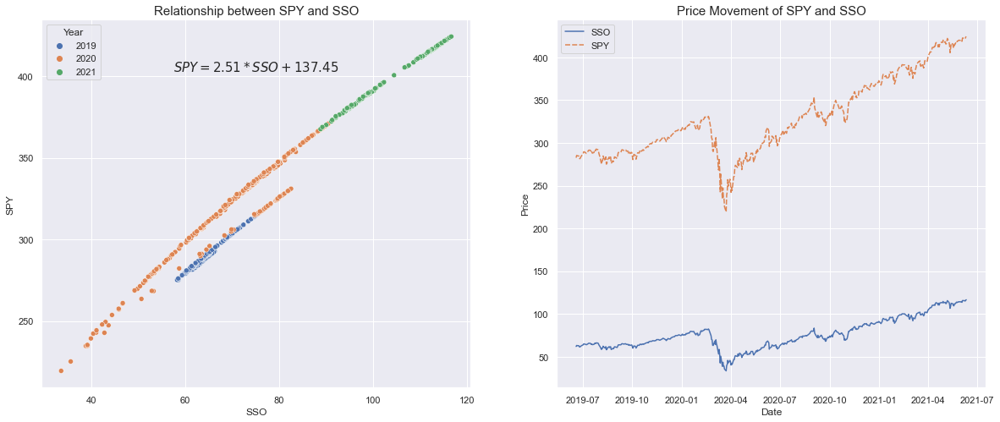

5. Relationship between SPY(1x) and SPXU(-3x)


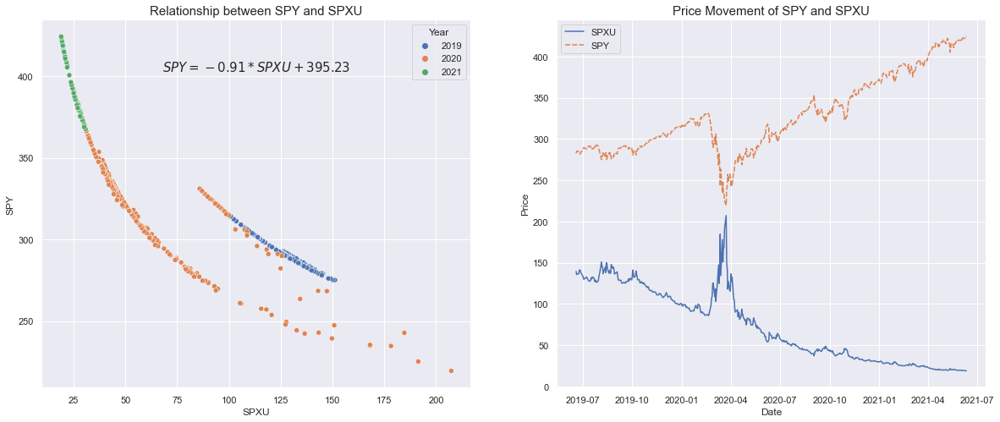

6. Relationship between SH(-1x) and SDS(-2x)


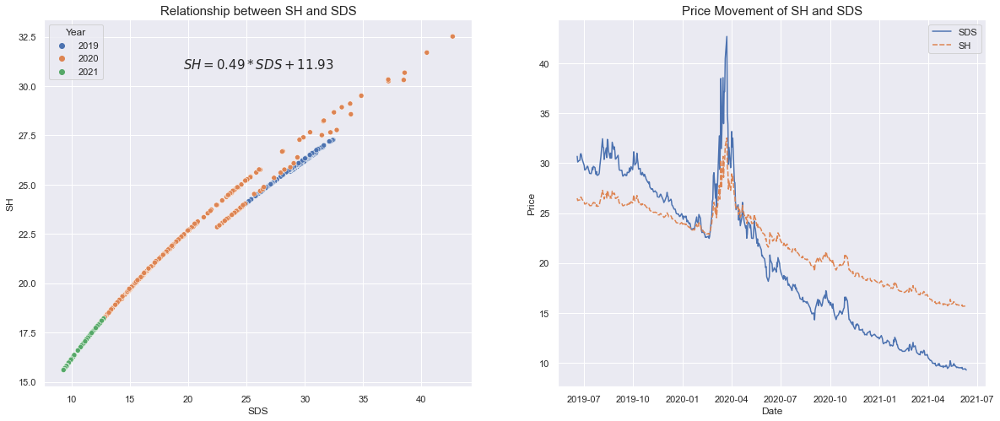

7. Relationship between SH(-1x) and UPRO(3x)


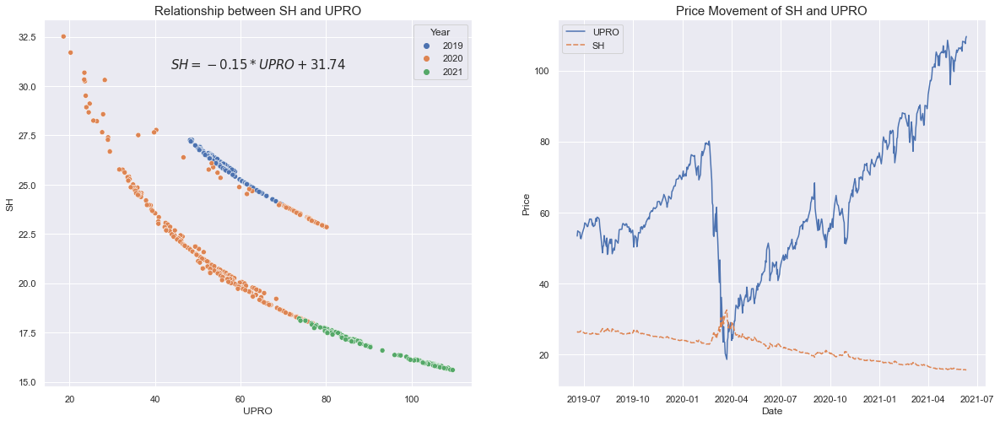

8. Relationship between SH(-1x) and SSO(2x)


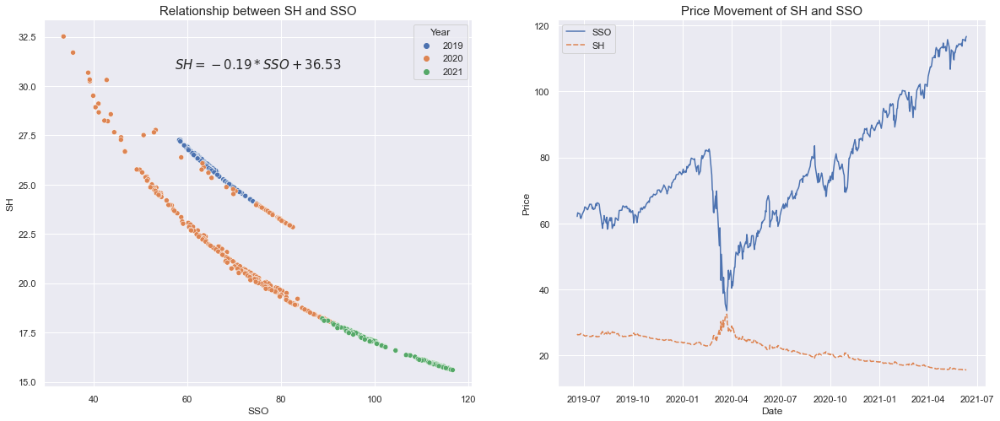

9. Relationship between SH(-1x) and SPXU(-3x)


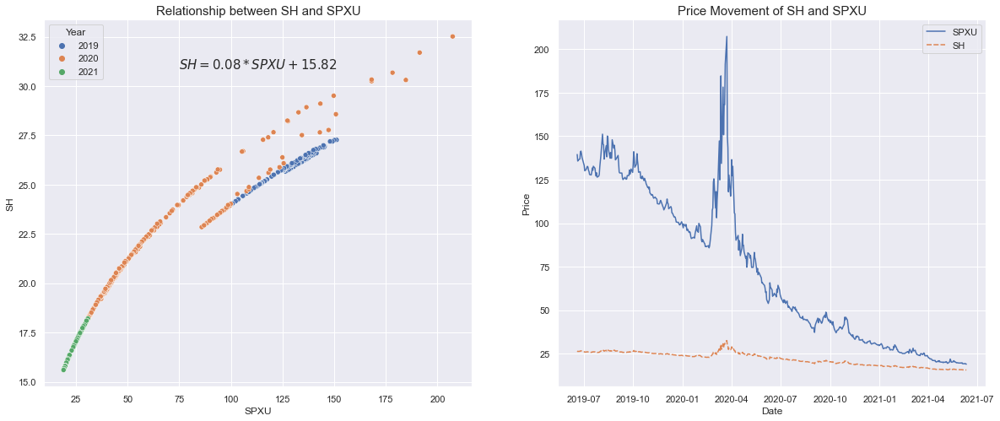

10. Relationship between SDS(-2x) and UPRO(3x)


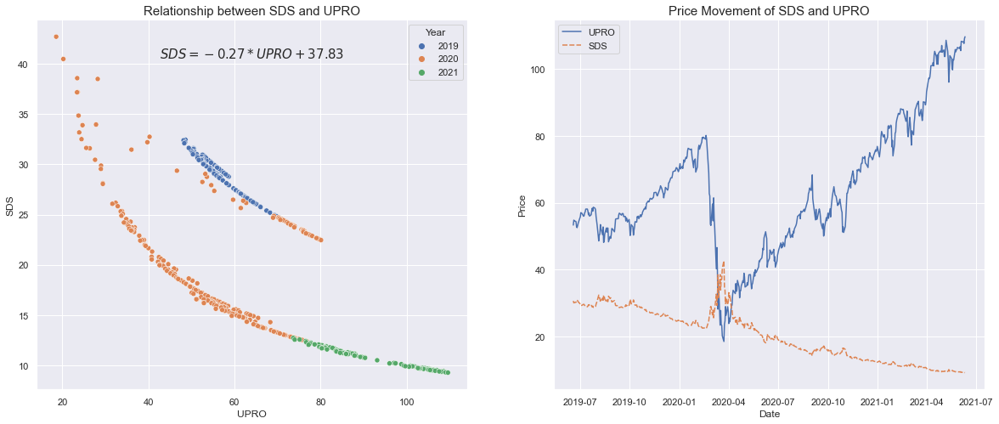

11. Relationship between SDS(-2x) and SSO(2x)


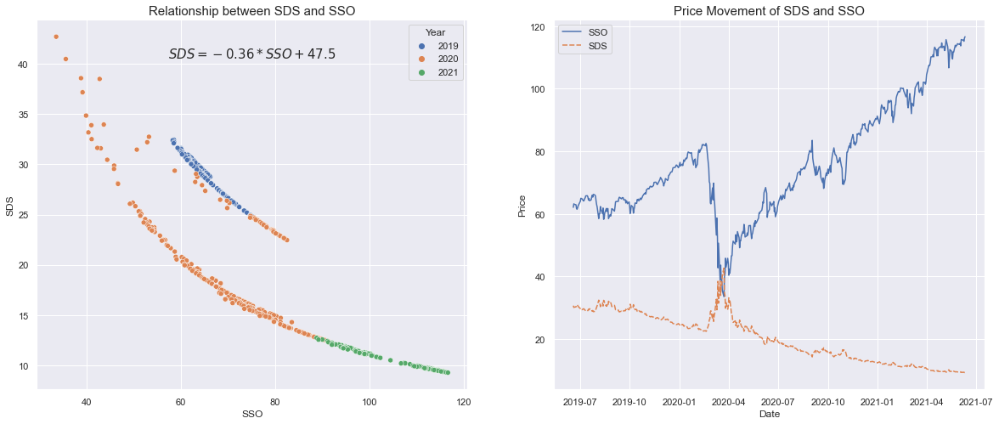

12. Relationship between SDS(-2x) and SPXU(-3x)


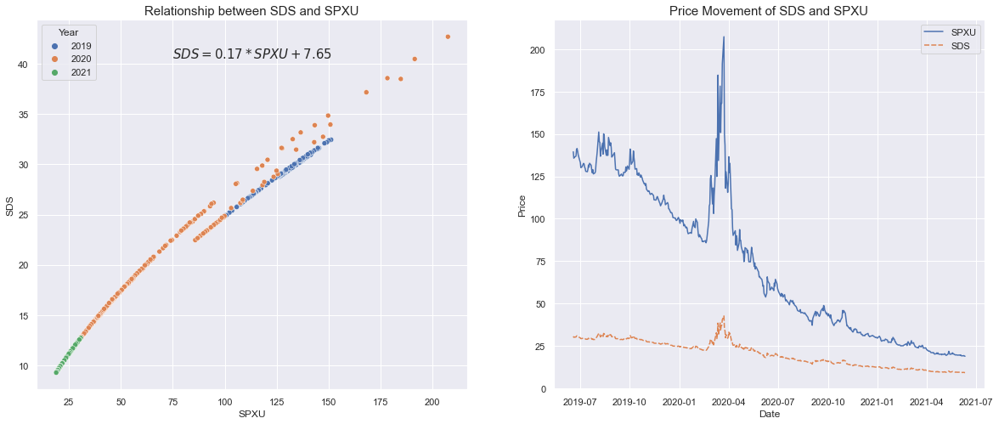

13. Relationship between UPRO(3x) and SSO(2x)


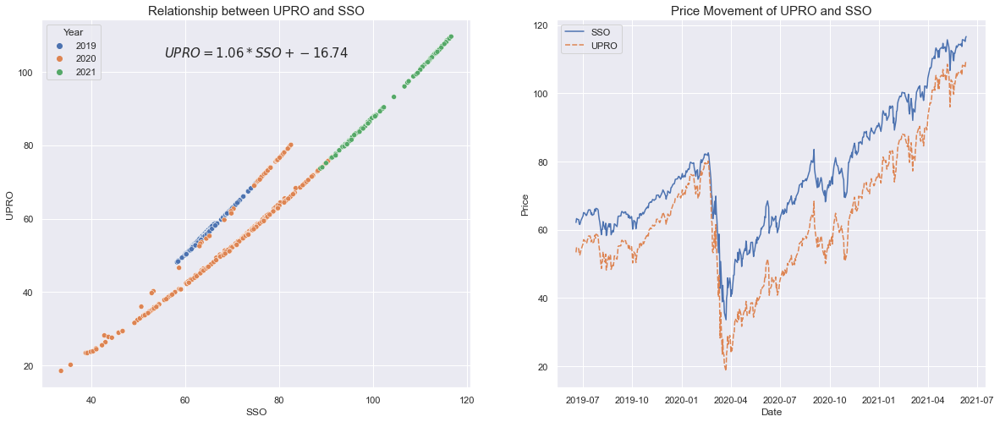

14. Relationship between UPRO(3x) and SPXU(-3x)


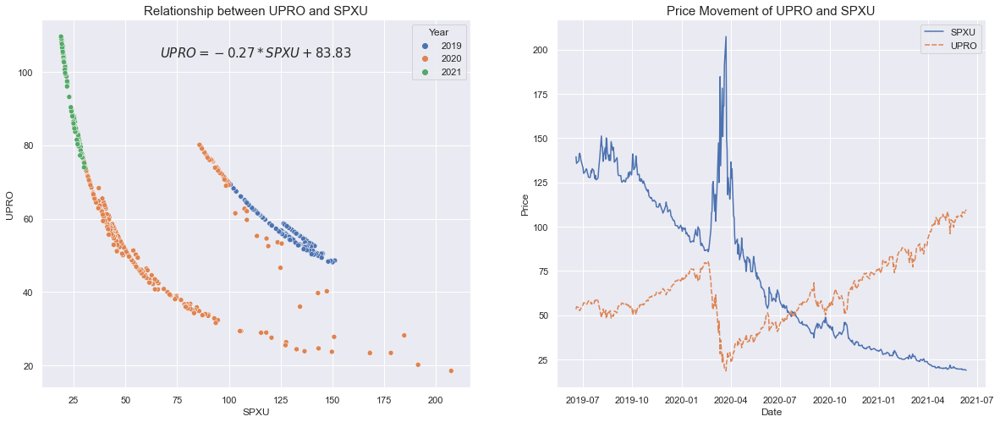

15. Relationship between SSO(2x) and SPXU(-3x)


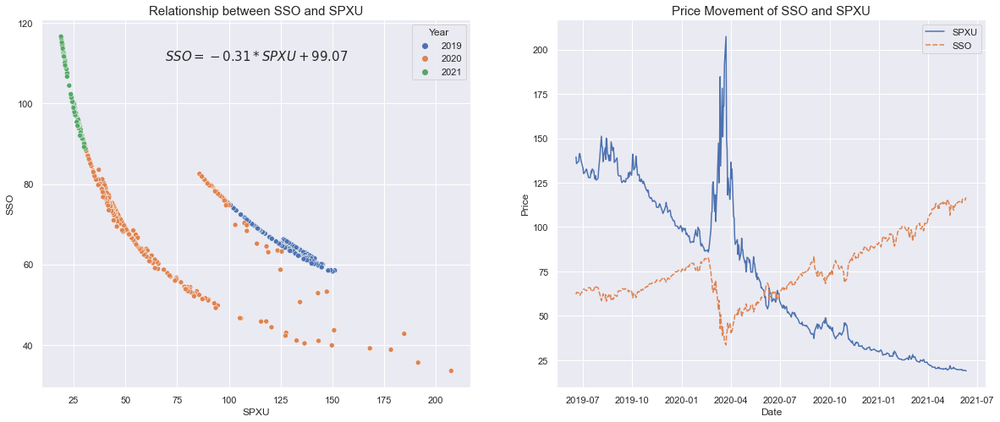

In [249]:
period = 500 # Number of samples to plot
for i, (x_ticker, y_ticker) in enumerate(itertools.combinations(TICKERS, 2)):
    print("{}. Relationship between {}({}) and {}({})".format(i + 1, x_ticker, LEVERAGES[x_ticker], y_ticker, LEVERAGES[y_ticker]))
    data_pair, slope, constant= plot(x_ticker, y_ticker, period)

### (c) Use one year data

1. Relationship between SPY(1x) and SH(-1x)


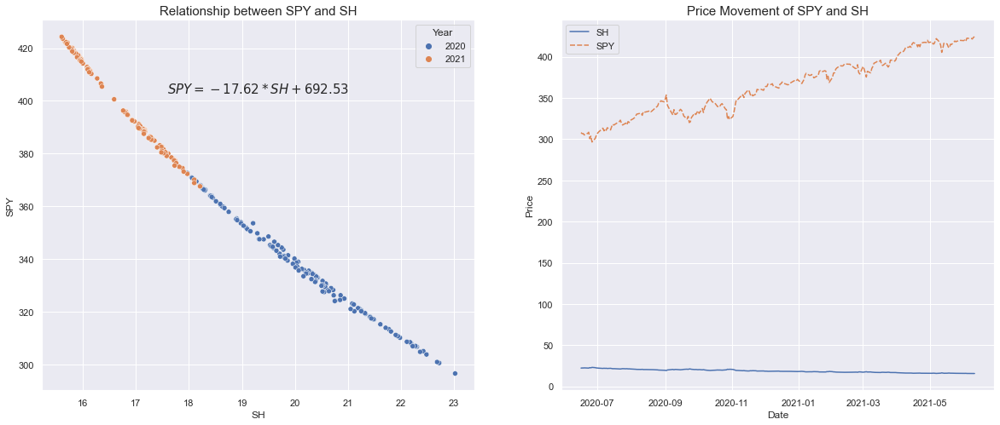

2. Relationship between SPY(1x) and SDS(-2x)


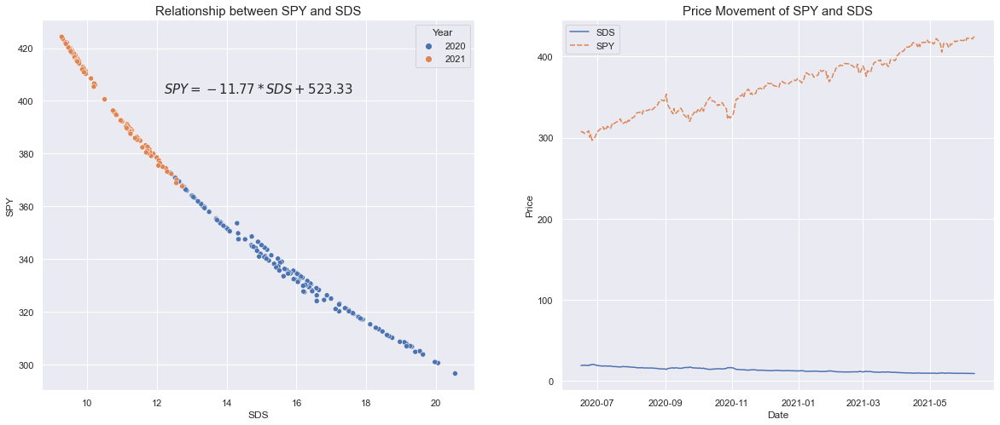

3. Relationship between SPY(1x) and UPRO(3x)


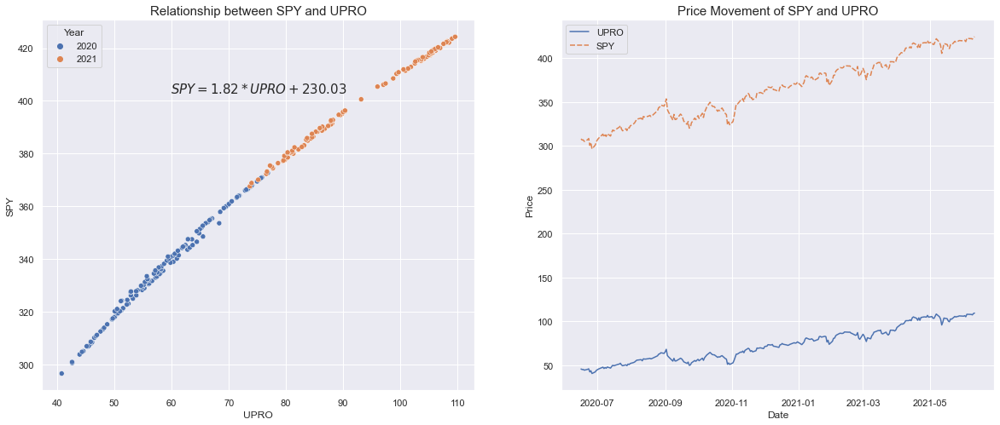

4. Relationship between SPY(1x) and SSO(2x)


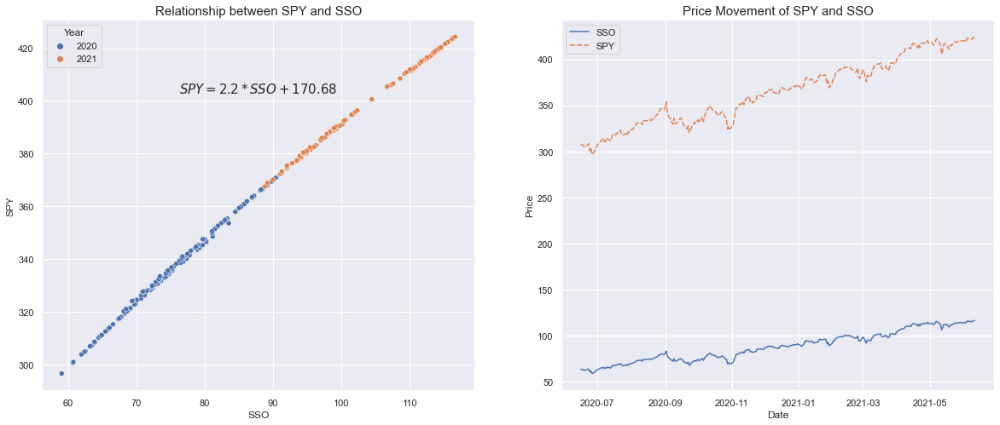

5. Relationship between SPY(1x) and SPXU(-3x)


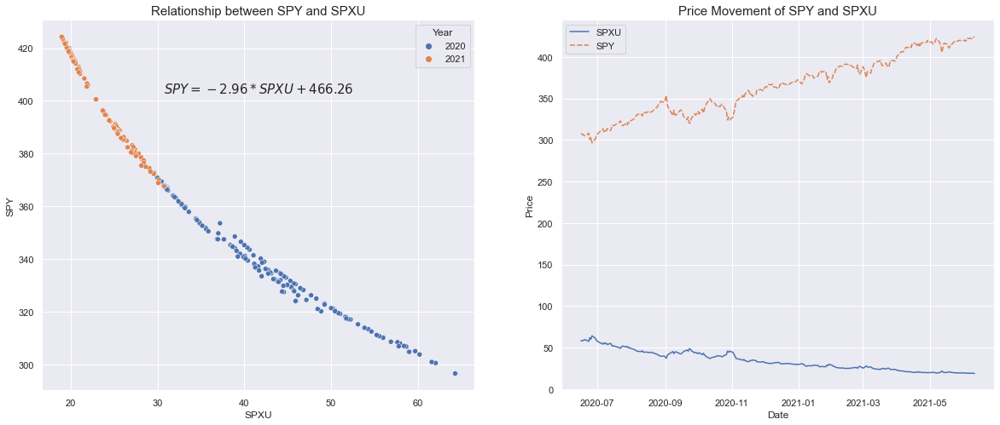

6. Relationship between SH(-1x) and SDS(-2x)


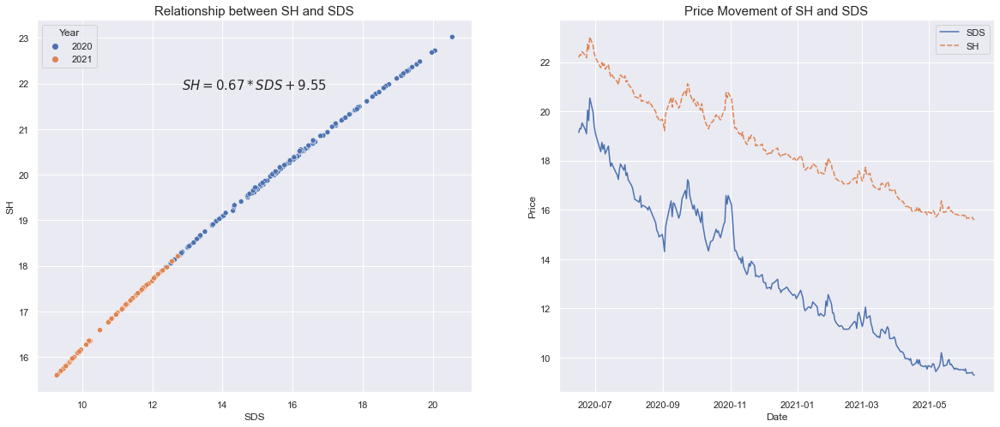

7. Relationship between SH(-1x) and UPRO(3x)


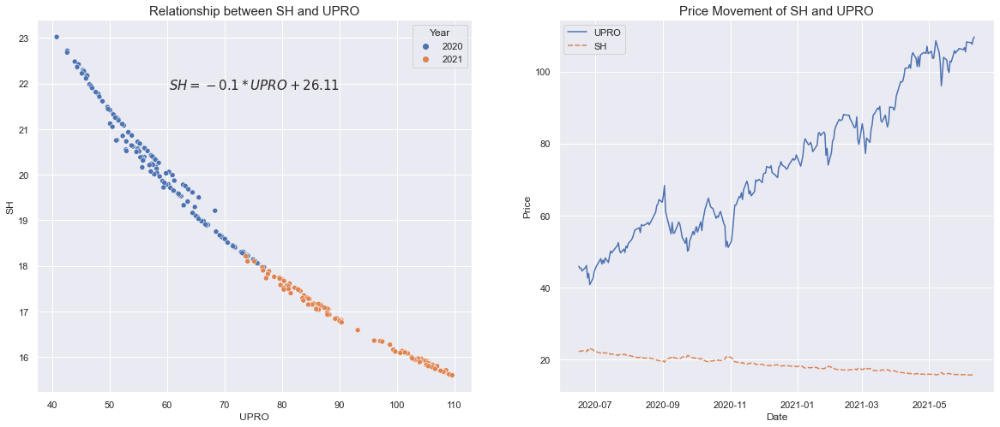

8. Relationship between SH(-1x) and SSO(2x)


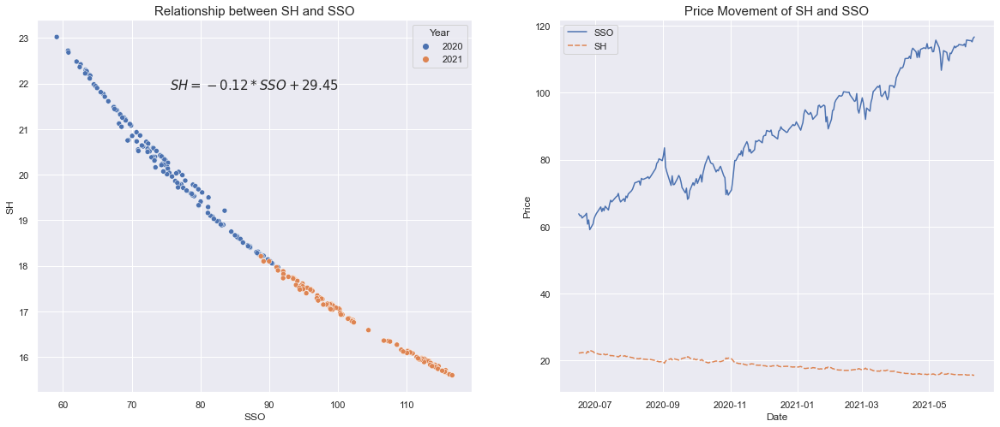

9. Relationship between SH(-1x) and SPXU(-3x)


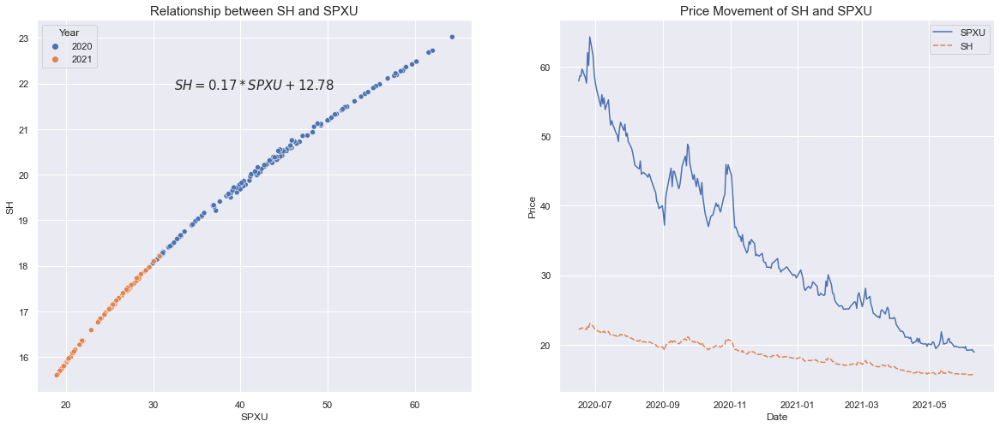

10. Relationship between SDS(-2x) and UPRO(3x)


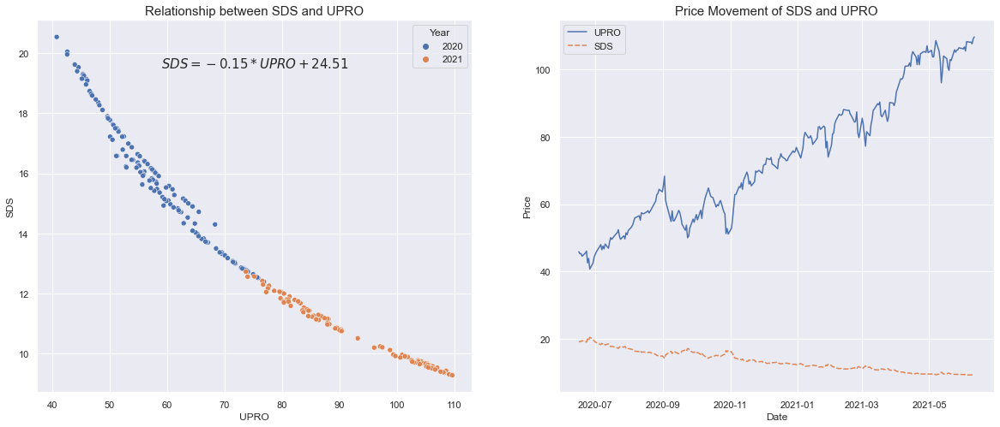

11. Relationship between SDS(-2x) and SSO(2x)


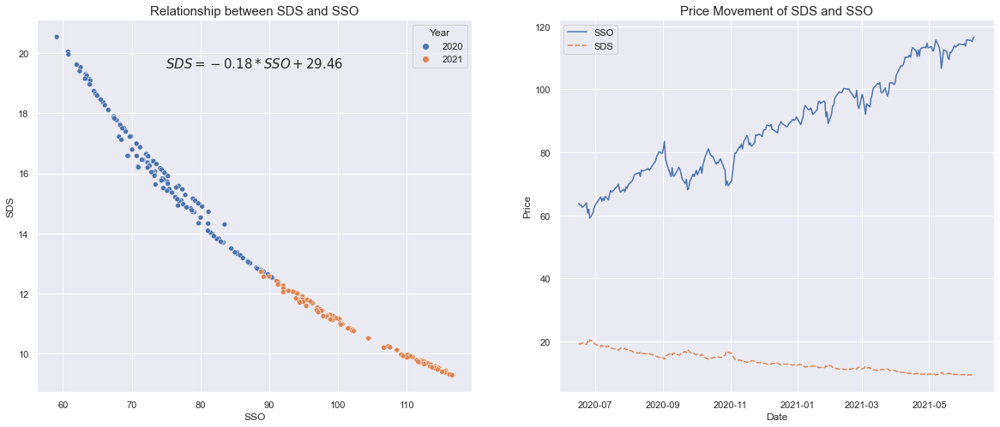

12. Relationship between SDS(-2x) and SPXU(-3x)


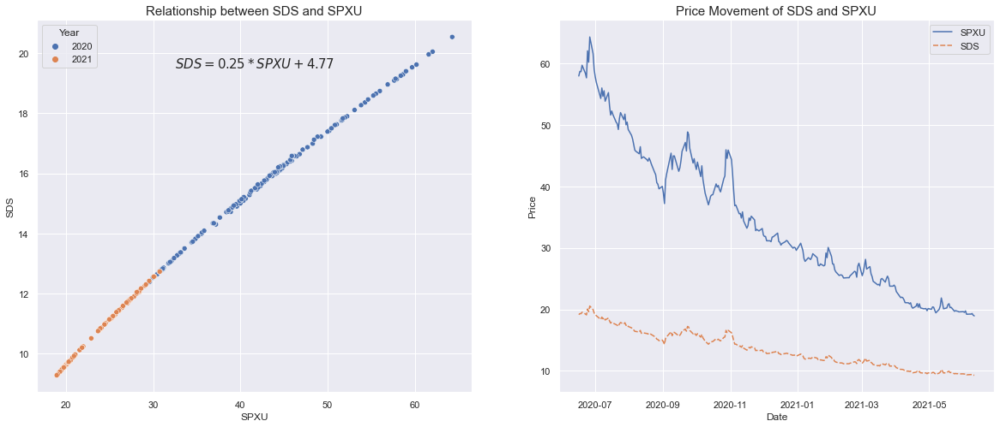

13. Relationship between UPRO(3x) and SSO(2x)


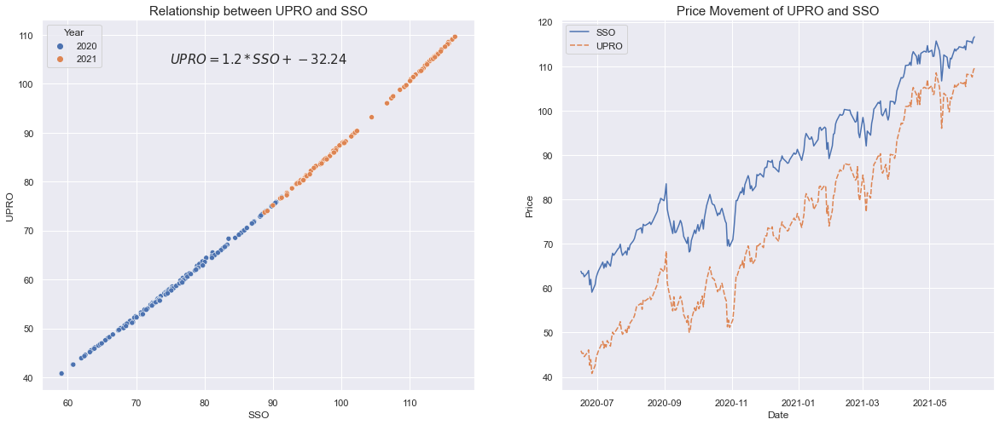

14. Relationship between UPRO(3x) and SPXU(-3x)


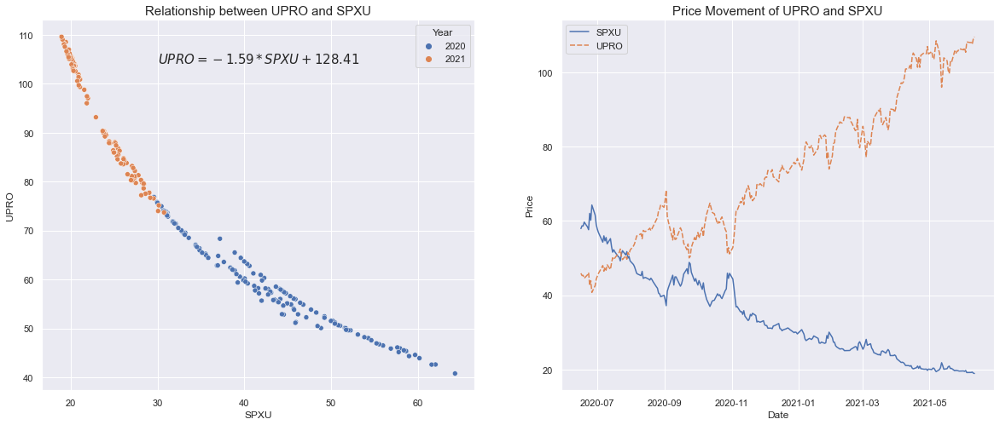

15. Relationship between SSO(2x) and SPXU(-3x)


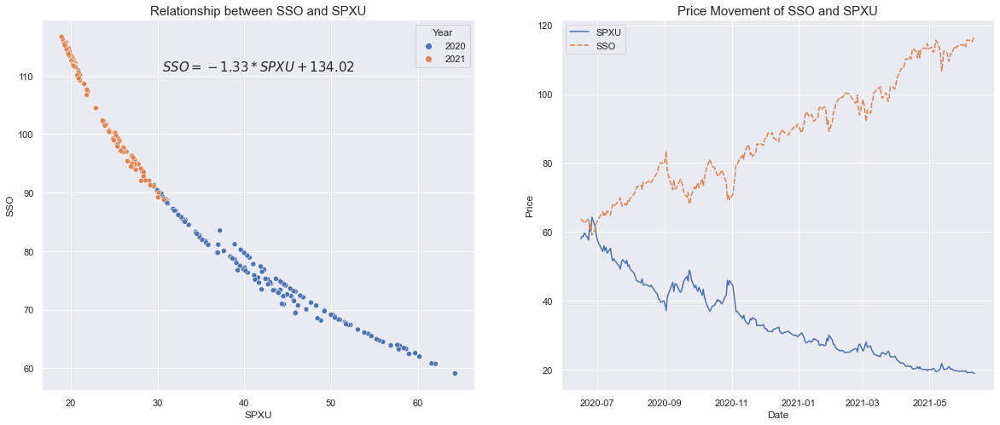

In [250]:
period = 250 # Number of samples to plot
for i, (x_ticker, y_ticker) in enumerate(itertools.combinations(TICKERS, 2)):
    print("{}. Relationship between {}({}) and {}({})".format(i + 1, x_ticker, LEVERAGES[x_ticker], y_ticker, LEVERAGES[y_ticker]))
    data_pair, slope, constant = plot(x_ticker, y_ticker, period)

### (d) Scatter plot, price movement, and residual plot between two ETFs

Relationship between SH(-1x) and SPXU(-3x)


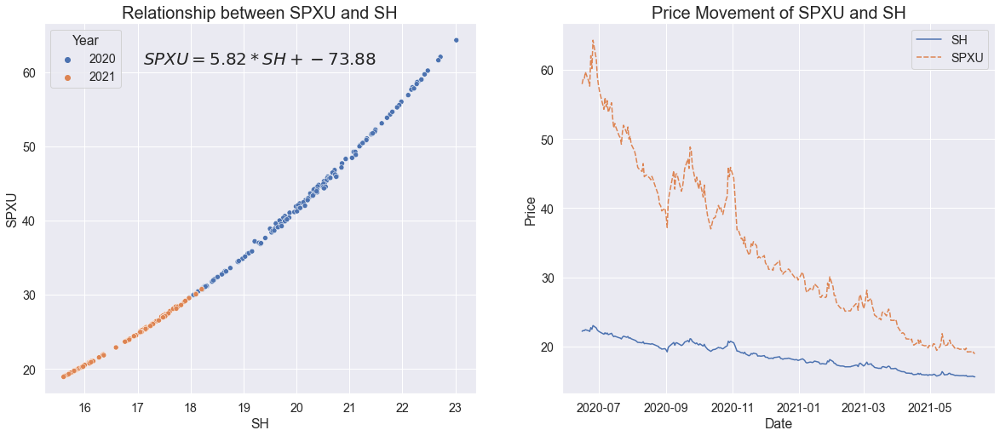

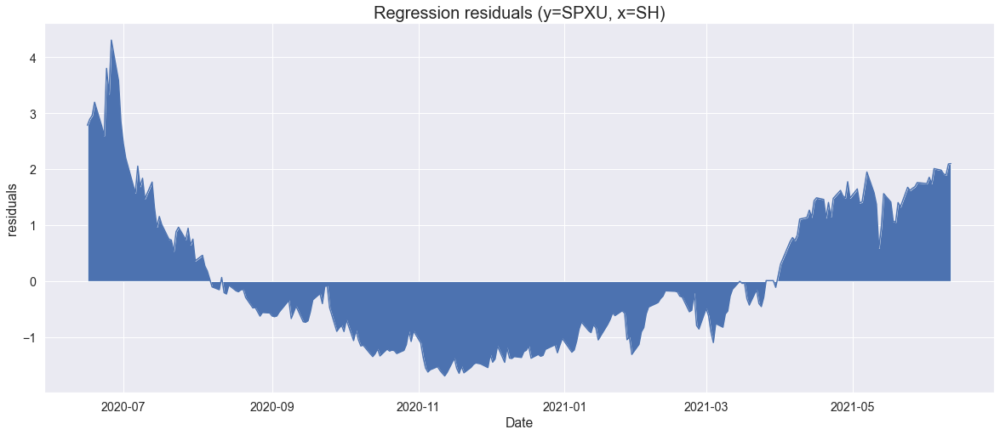

In [329]:
x_ticker, y_ticker = "SH", "SPXU"
period = 250

print("Relationship between {}({}) and {}({})".format(x_ticker, LEVERAGES[x_ticker], y_ticker, LEVERAGES[y_ticker]))
data_pair, slope, constant = plot(y_ticker, x_ticker, period=period)
pred_y = constant + slope * data_pair[x_ticker]

data_pair["residuals"] = data_pair[y_ticker] - pred_y
plt.figure(figsize=(20,8))
plt.title("Regression residuals (y={}, x={})".format(y_ticker, x_ticker), fontsize=20)
sns.lineplot(data=data_pair["residuals"])
plt.fill_between(data_pair.index, data_pair["residuals"])
plt.show()

In [330]:
RES_NUM = 6
LOOK_BACK_WINDOW = 10
data_pair["pnl_abs"] = data_pair["residuals"].shift(-LOOK_BACK_WINDOW) - data_pair["residuals"]  # forward pnl
data_pair['residual_bucket'] = pd.cut(data_pair['residuals'], RES_NUM, labels = False)


Average 10 day pnl for 6 bucket:
residual_bucket
0    0.109290
1    0.012660
2   -0.051756
3   -0.196732
4   -0.944234
5   -2.162295
Name: pnl_abs, dtype: float64/n


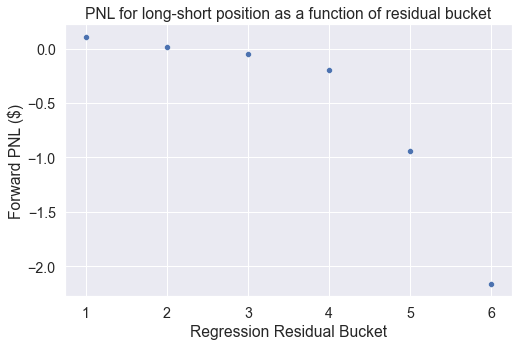

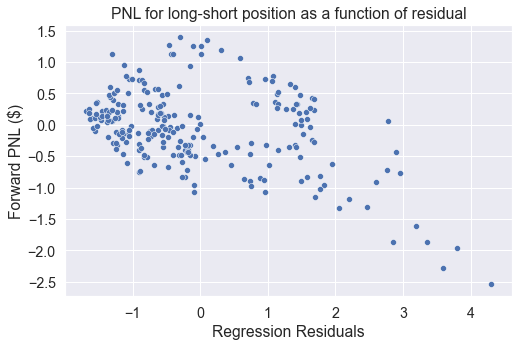

In [331]:
# residual_bucket vs avg_pnl
mapping = data_pair.groupby(["residual_bucket"])["pnl_abs"].mean()
print("Average {} day pnl for {} bucket:".format(LOOK_BACK_WINDOW, RES_NUM))
print("{}/n".format(mapping))
data_pair = data_pair.assign(avg_pnl = data_pair.residual_bucket.map(mapping))

sns.scatterplot(x = np.arange(RES_NUM) + 1, y = mapping)
# plt.scatter(df.residual_bucket,df.avg_pnl)
plt.xlabel("Regression Residual Bucket")
plt.ylabel("Forward PNL ($)")
plt.title("PNL for long-short position as a function of residual bucket")
plt.show()

sns.scatterplot(x = data_pair["residuals"], y = data_pair["pnl_abs"])
plt.xlabel("Regression Residuals")
plt.ylabel("Forward PNL ($)")
plt.title("PNL for long-short position as a function of residual")
plt.show()

## 2. Data Exploration - intraday level 1 data version
6/15~7/13

In [8]:
filepath = [file for file in os.listdir("cleaned_csv") if file.endswith("_new.csv") and file.startswith("07")]
all_data = []

for path in filepath:
    df_temp = pd.read_csv(os.path.join("cleaned_csv", path))
    if not len(all_data):
        all_data = df_temp
    else:
        all_data = pd.concat([all_data, df_temp])
all_data.time = pd.to_datetime(all_data.time)
all_data = all_data.reset_index(drop=True)

In [9]:
columns = dict()
for i in range(6):
    columns["bid{}".format(i + 1)] = "{}_bid".format(TICKERS[i])
    columns["ask{}".format(i + 1)] = "{}_ask".format(TICKERS[i])
    columns["mid{}".format(i + 1)] = "{}_mid".format(TICKERS[i])
    columns["imb{}".format(i + 1)] = "{}_imb".format(TICKERS[i])

all_data.rename(columns=columns, inplace=True)

all_data["time"] = all_data.time
all_data["date"] = list(map(lambda x: x.strftime("%m%d"), all_data.time))
all_data["hour"] = list(map(lambda x: x.strftime("%H"), all_data.time))
all_data["date_hour"] = all_data["date"] + '-' + all_data["hour"]

# check whether it is :00~:29 or :30~:59
first_second_half = list(map(lambda x: "30-59" if int(x.strftime("%M")) // 30 else "0-29", all_data.time))
all_data["half_hour"] = all_data["hour"] + ':' + first_second_half

In [53]:
def plot_multiple(df, i, j, mode="price", period=None):
    """ 
    Usage: To do a linear regression of y=SPY on x=SH, call `plot("SPY", "SH")`
    This function plots two graph about the relationship between two tickers, and do OLS with them.
        plot 1: The scatter plot of two etf prices
        plot 2: The lineplot of two etf prices over time
    Arguments:
        y_ticker: ticker of the etf to be the dependent variable
        x_ticker: ticker of the etf to be the independent variable
        period (day): If given, use the last `period` number of closed price 
                    If not given, use all the data since both tickers are traded
        mode: Support three modes, "price", "return", "log_return"; If return mode is "return" or "log_return",
            `period` should be provided
    """
    assert mode in ("price", "return", "log_return"), "mode {} not support".format(mode)
    
    if mode in ("return", "log_return"):
        assert period, "should provide period argument"

    x_ticker, y_ticker = TICKERS[i], TICKERS[j]
    x_mid_str, y_mid_str = "{}_mid".format(x_ticker), "{}_mid".format(y_ticker)
    
    data_pair = pd.DataFrame()
    
    data_pair[x_mid_str] = df[x_mid_str]
    data_pair[y_mid_str] = df[y_mid_str]
    data_pair["{}_imb".format(x_ticker)] = df["{}_imb".format(x_ticker)]
    data_pair["{}_imb".format(y_ticker)] = df["{}_imb".format(y_ticker)]
    data_pair["time"] = df["time"]
    data_pair["date"] = df["date"]
    data_pair["half_hour"] = df["half_hour"]
    
    if mode in ("return", "log_return"):
        x_mid_before = df[x_mid_str].shift(periods=period)
        y_mid_before = df[y_mid_str].shift(periods=period)
        
        if mode == "return":
            data_pair["{}_mid_ret".format(x_ticker)] = (df[x_mid_str] - x_mid_before) / x_mid_before
            data_pair["{}_mid_ret".format(y_ticker)] = (df[y_mid_str] - y_mid_before) / y_mid_before
            x_str, y_str = "{}_mid_ret".format(x_ticker), "{}_mid_ret".format(y_ticker)
            
        if mode == "log_return":
            data_pair["{}_mid_log_ret".format(x_ticker)] = np.log(df[x_mid_str] / x_mid_before)
            data_pair["{}_mid_log_ret".format(y_ticker)] = np.log(df[y_mid_str] / y_mid_before)
            x_str, y_str = "{}_mid_log_ret".format(x_ticker), "{}_mid_log_ret".format(y_ticker)
    
    else:
        x_str, y_str = x_mid_str, y_mid_str
    
    data_pair = data_pair.dropna()
    x_series, y_series = data_pair[x_str], data_pair[y_str]
    x, y = x_series, y_series
    
    plt.figure(figsize=(20,8))
    plt.subplot(1,2,1)
    plt.title("Relationship between {} and {} using {}".format(y_ticker, x_ticker, mode), fontsize=20)
    sns.scatterplot(data=data_pair, x=x_str, y=y_str, hue="date", palette="Greens")
    
    x = sm.add_constant(x)
    model = sm.OLS(y, x)
    result = model.fit()
    constant = result.params[0]
    slope = result.params[1]
    data_pair["pred_y"] = slope * x_series + constant
    plt.text((max(x_series) + min(x_series)) / 2, 
             max(y_series), r'${}={}*{} + {}$'.format(y_ticker, round(slope, 4), x_ticker, round(constant, 4)), fontsize=20, ha='center')
    plt.plot(x_series, slope * x_series + constant, linestyle='-', c="red")

    plt.subplot(1,2,2)
    plt.title("Price Movement of {} and {}".format(y_ticker, x_ticker), fontsize=20)
    sns.lineplot(data=data_pair[[x_mid_str, y_mid_str]])
    plt.ylabel("Price")
    plt.show()
    
#     plt.figure(figsize=(20,8))
#     plt.subplot(1,2,1)
#     plt.title("{}_bid vs {}_ask".format(x_ticker, y_ticker), fontsize=20)
#     sns.scatterplot(data=all_data, x="{}_bid".format(x_ticker), y="{}_ask".format(y_ticker), hue="date", palette="Greens")
    
#     plt.subplot(1,2,2)
#     plt.title("{}_ask vs {}_bid".format(x_ticker, y_ticker), fontsize=20)
#     sns.scatterplot(data=all_data, x="{}_ask".format(x_ticker), y="{}_bid".format(y_ticker), hue="date", palette="Greens")
#     plt.show()
    
    return data_pair, slope, constant

-4.4744689269704713e-07


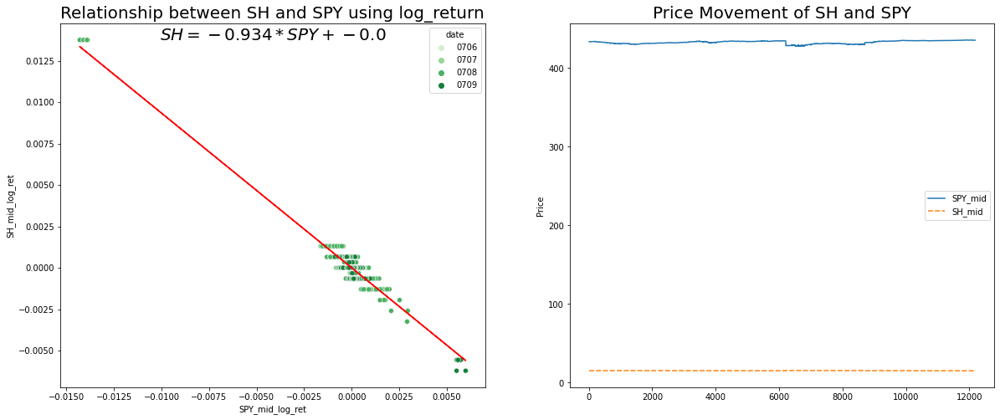

In [54]:
data_pair, slope, constant = plot_multiple(all_data, 0, 1, mode="log_return", period=10)

#### Theoretical Slope formula
Let  
ETF X: leverage m of SPY, price p_x  
ETF Y: leverage n of SPY, price p_y  
 
$$ n * \frac{\Delta p_x}{p_x} = m * \frac{\Delta p_y}{p_y} $$ 
$$ => {\Delta p_y} = \frac{n}{m} * \frac{p_y}{p_x} * \Delta p_x $$
Hence, $$ theoretical\_slope = \frac{n}{m} * \frac{p_y}{p_x} $$

In [12]:
def get_theoretical_slope(df, i, j):
    x_ticker, y_ticker = TICKERS[x_idx], TICKERS[y_idx]
    x, y = df["{}_mid".format(x_ticker)], df["{}_mid".format(y_ticker)]
    
    p_yticker_avg, p_xticker_avg = np.mean(y), np.mean(x)
    x_leverage, y_leverage = int(LEVERAGES[x_ticker][:-1]), int(LEVERAGES[y_ticker][:-1])
    
    return (p_yticker_avg / p_xticker_avg) * (y_leverage / x_leverage)
    

### (a) Plot the relationship between each pair of ETFs

1. Relationship between SPY(1x) and SH(-1x)
Theoretical slope: -0.0352


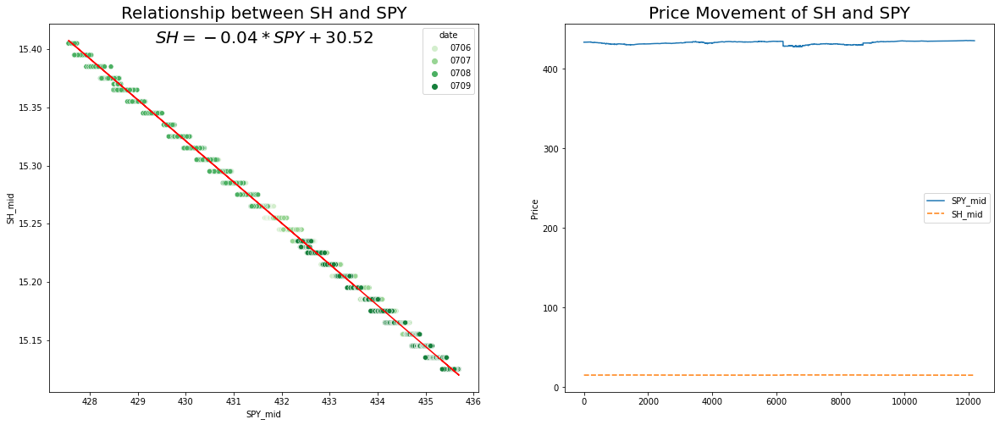

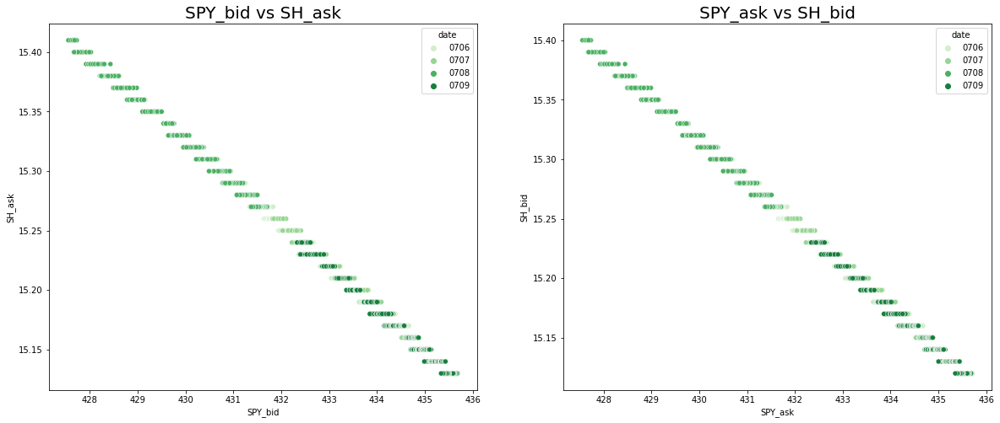

2. Relationship between SPY(1x) and SDS(-2x)
Theoretical slope: -0.0409


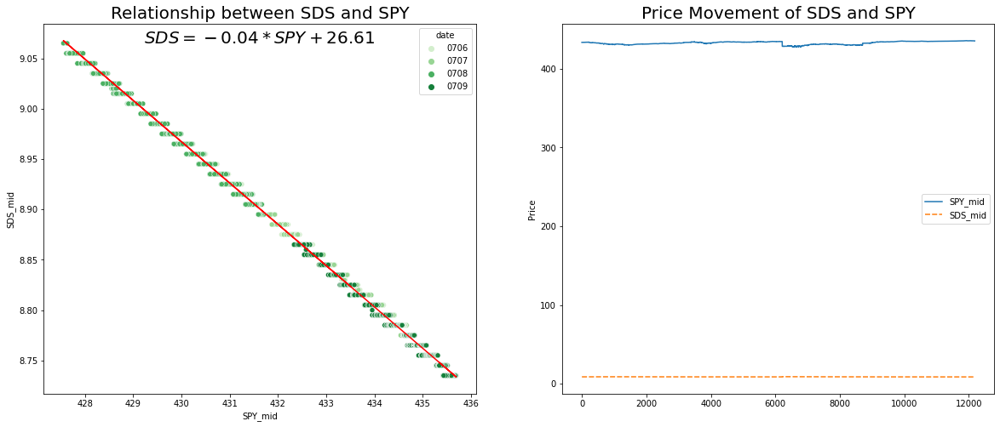

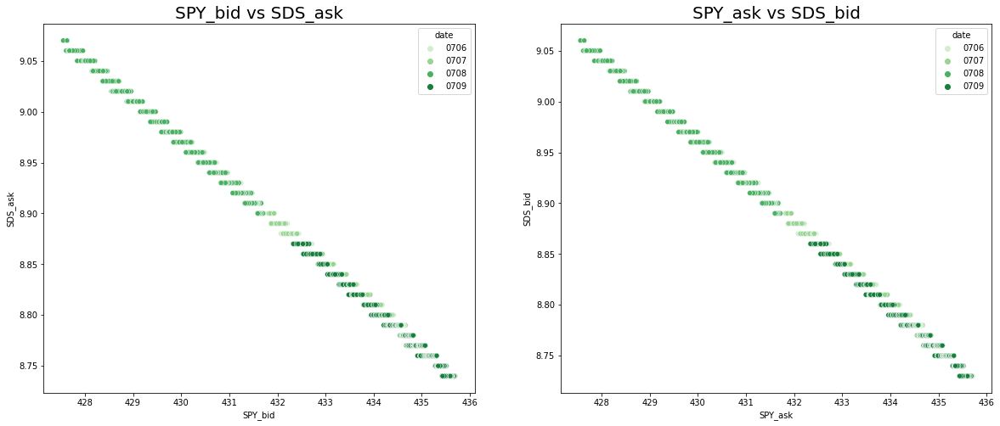

3. Relationship between SPY(1x) and UPRO(3x)
Theoretical slope: 0.8116


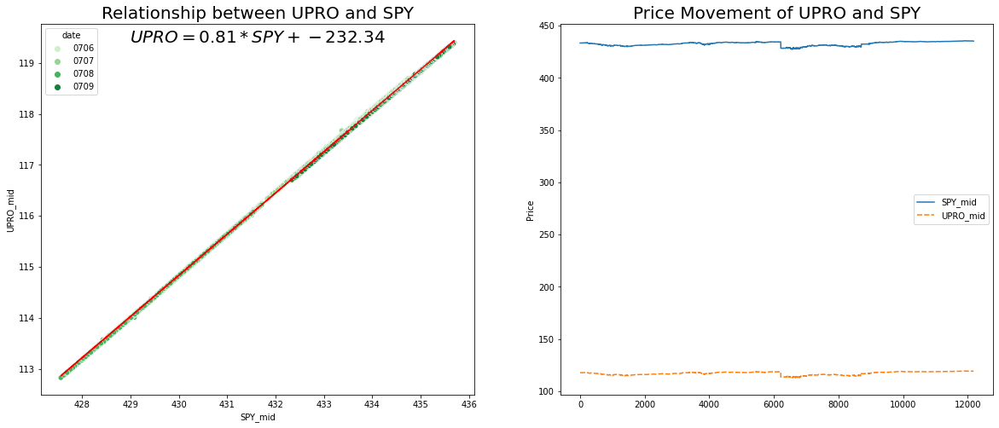

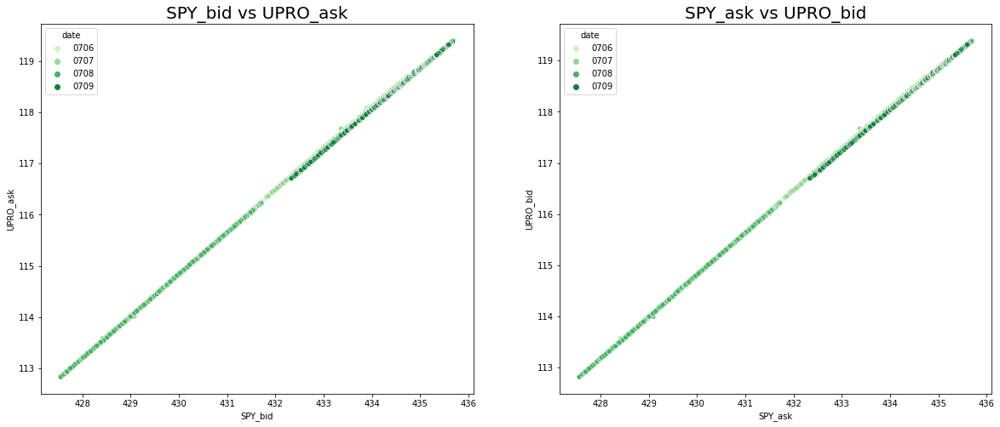

4. Relationship between SPY(1x) and SSO(2x)
Theoretical slope: 0.5633


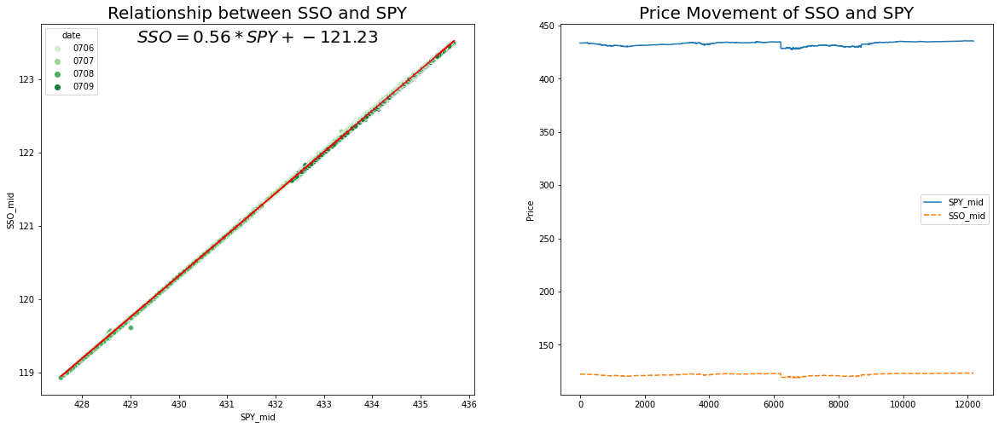

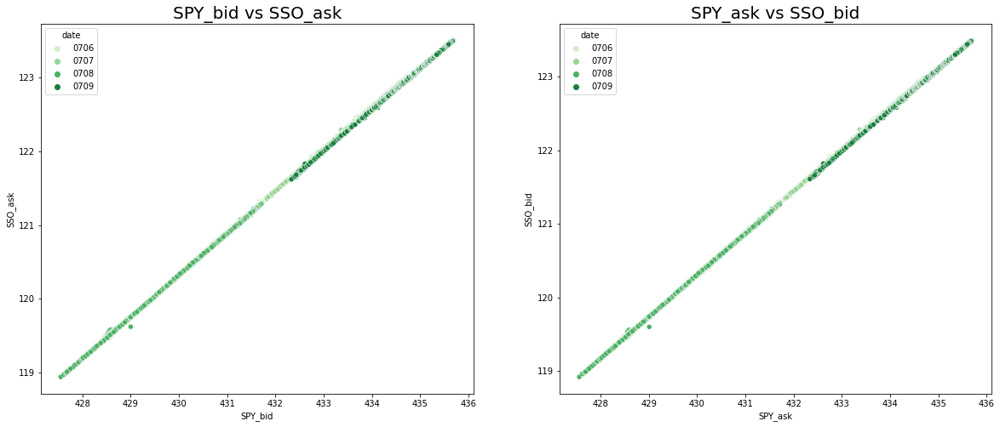

5. Relationship between SPY(1x) and SPXU(-3x)
Theoretical slope: -0.1221


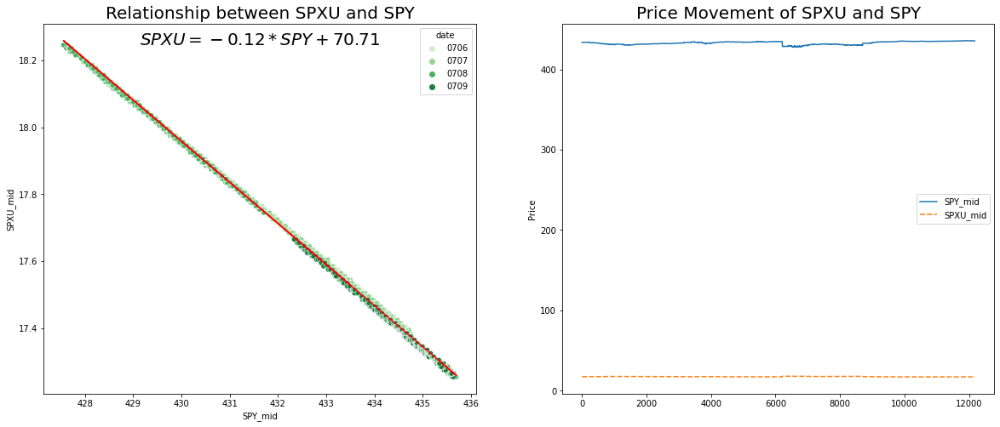

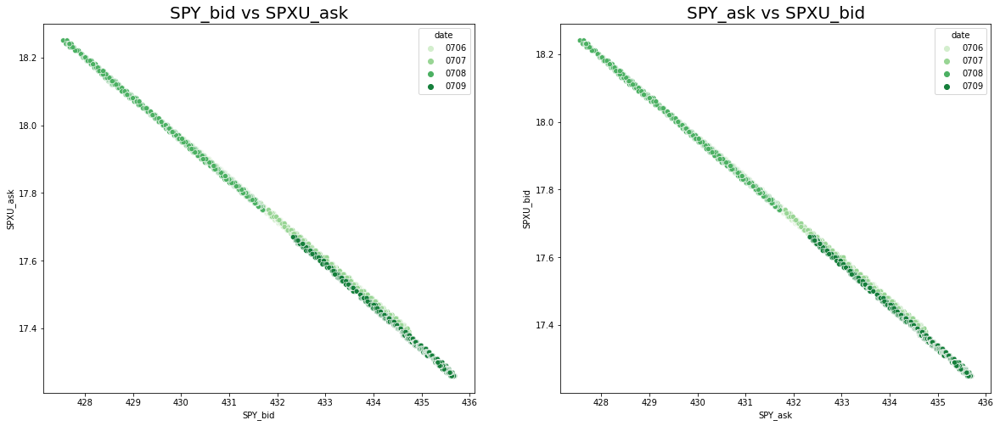

6. Relationship between SH(-1x) and SDS(-2x)
Theoretical slope: 1.1631


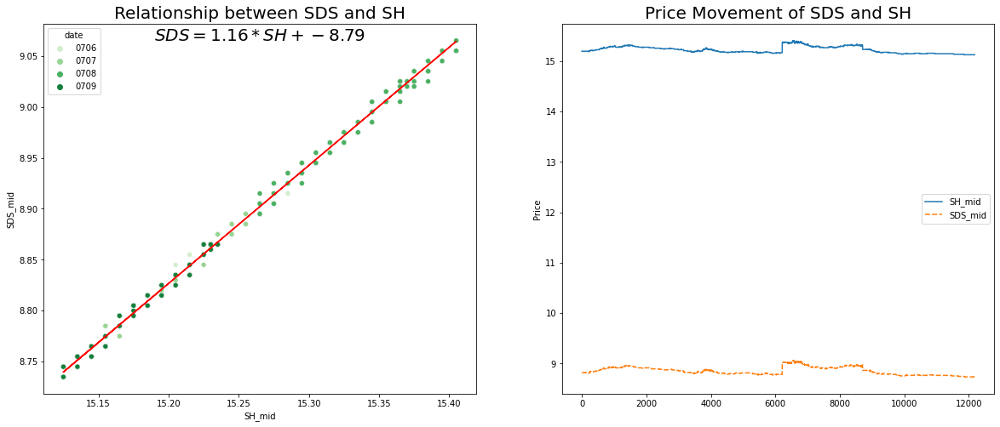

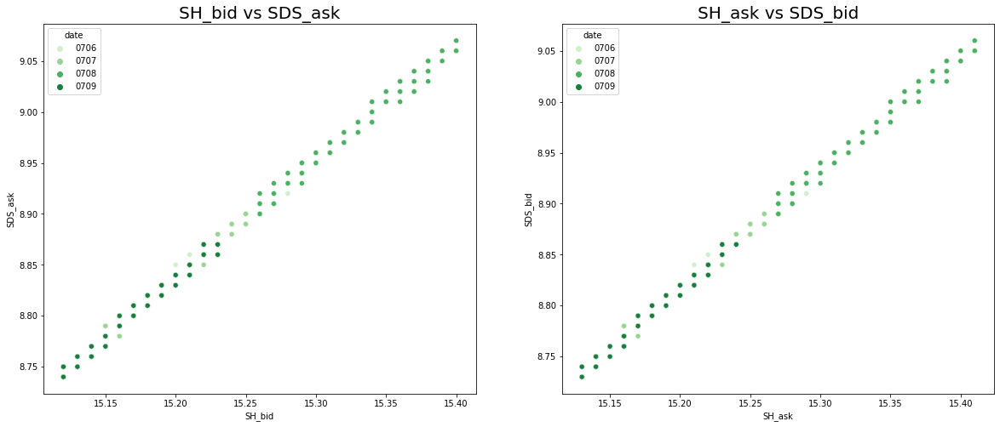

7. Relationship between SH(-1x) and UPRO(3x)
Theoretical slope: -23.0745


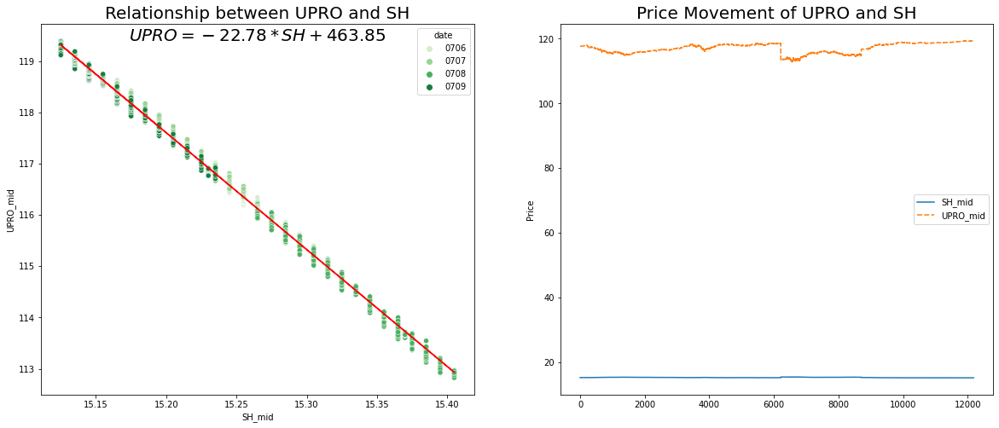

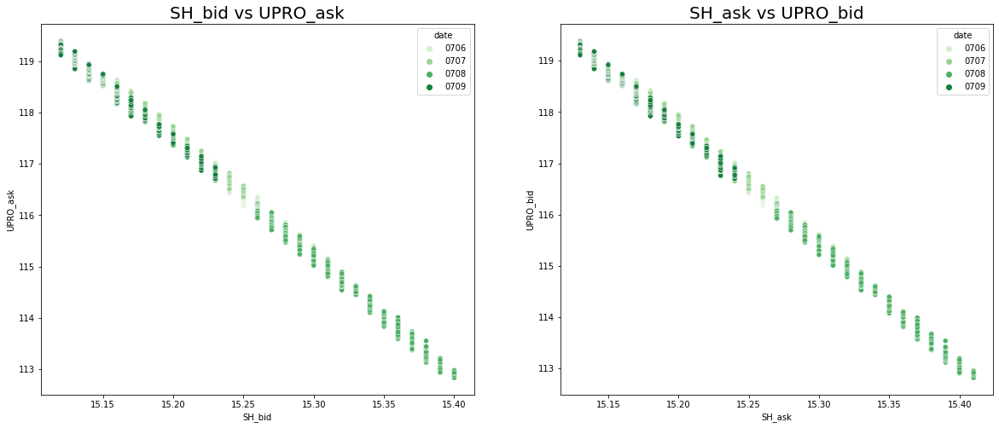

8. Relationship between SH(-1x) and SSO(2x)
Theoretical slope: -16.0136


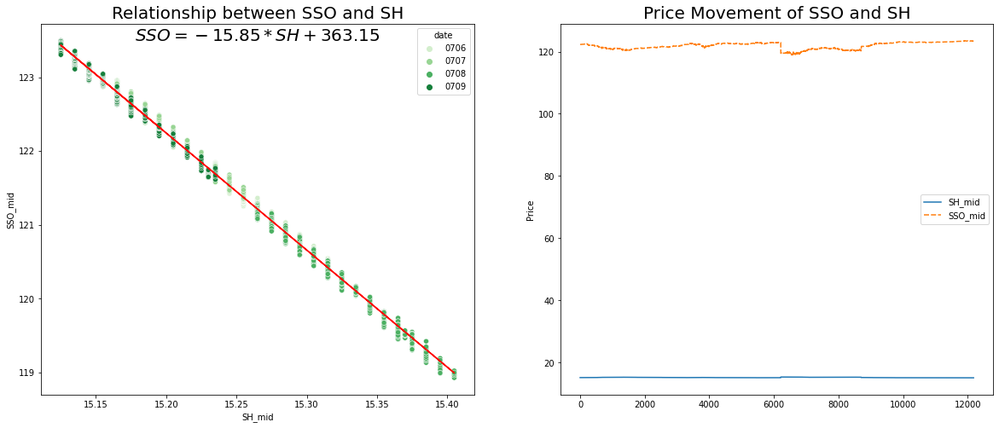

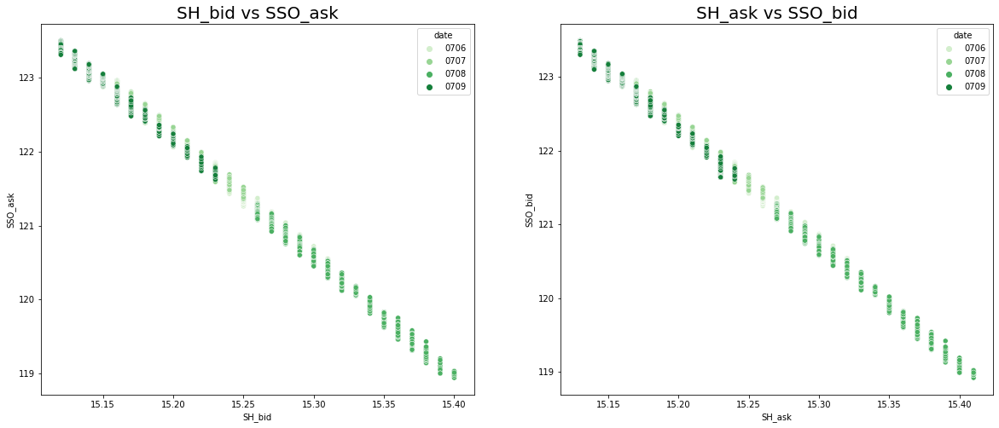

9. Relationship between SH(-1x) and SPXU(-3x)
Theoretical slope: 3.4718


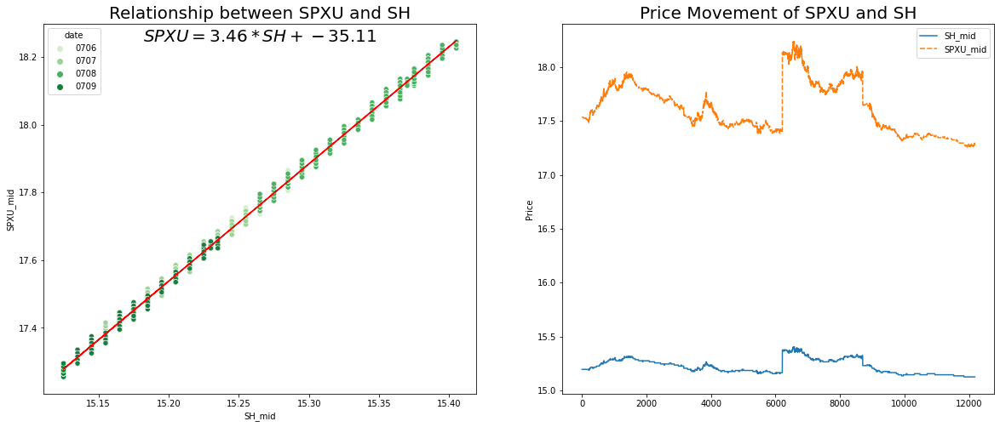

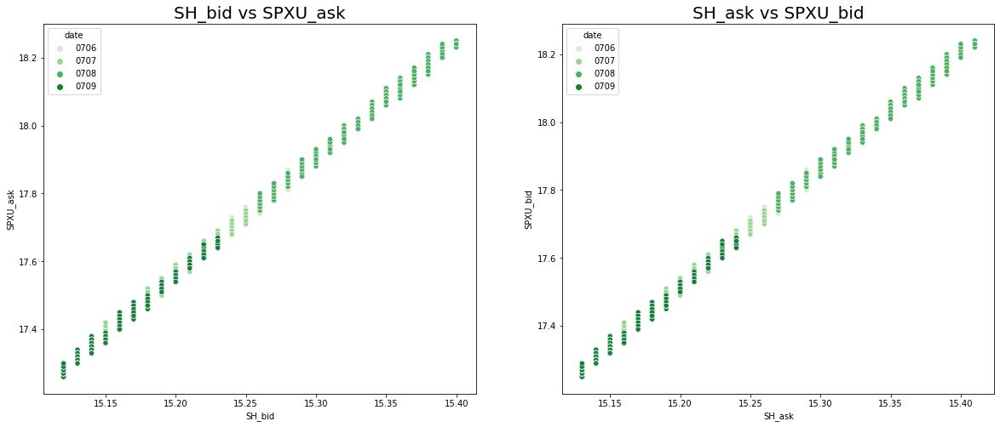

10. Relationship between SDS(-2x) and UPRO(3x)
Theoretical slope: -19.8381


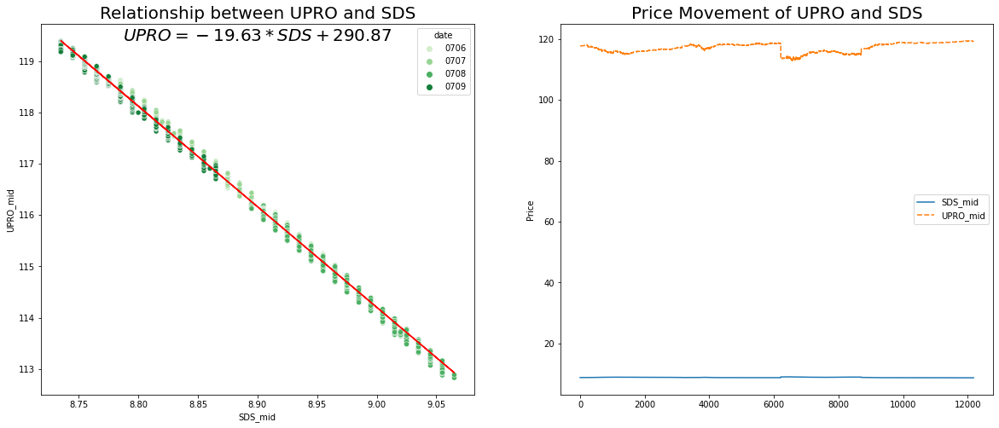

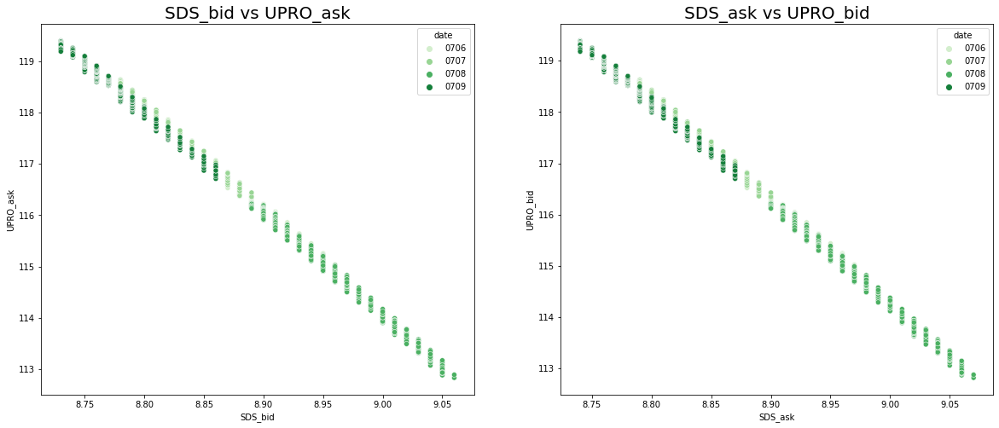

11. Relationship between SDS(-2x) and SSO(2x)
Theoretical slope: -13.7676


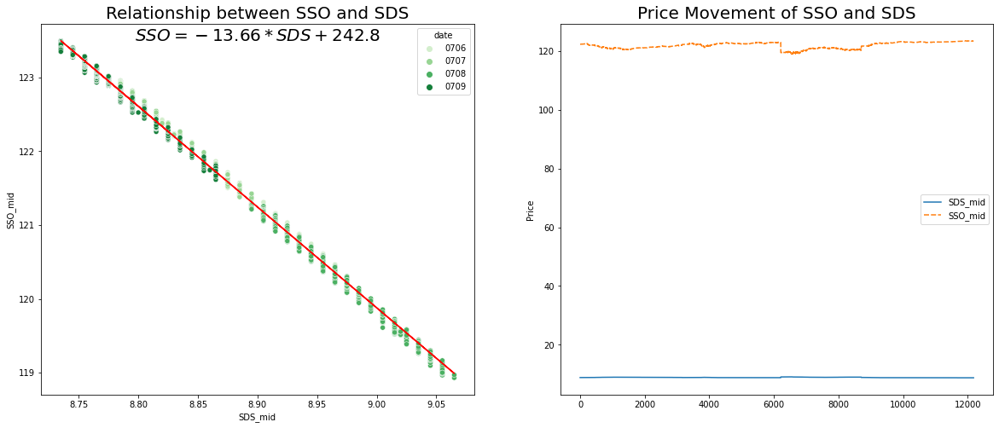

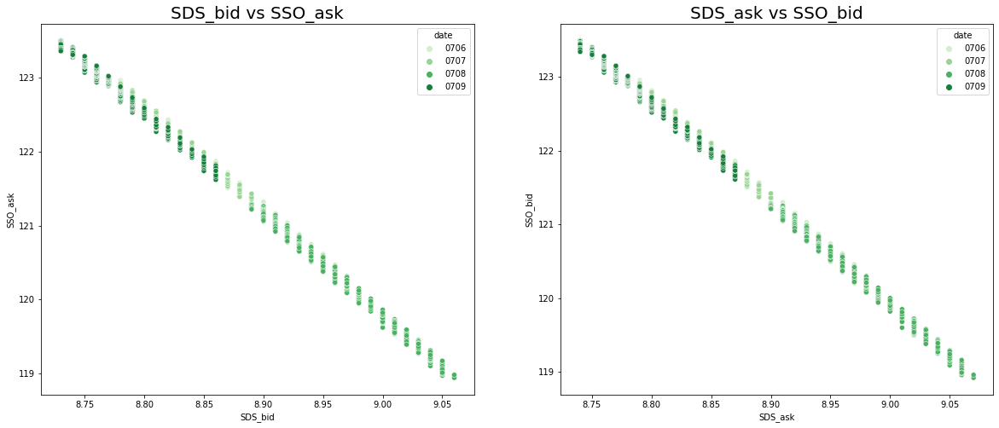

12. Relationship between SDS(-2x) and SPXU(-3x)
Theoretical slope: 2.9848


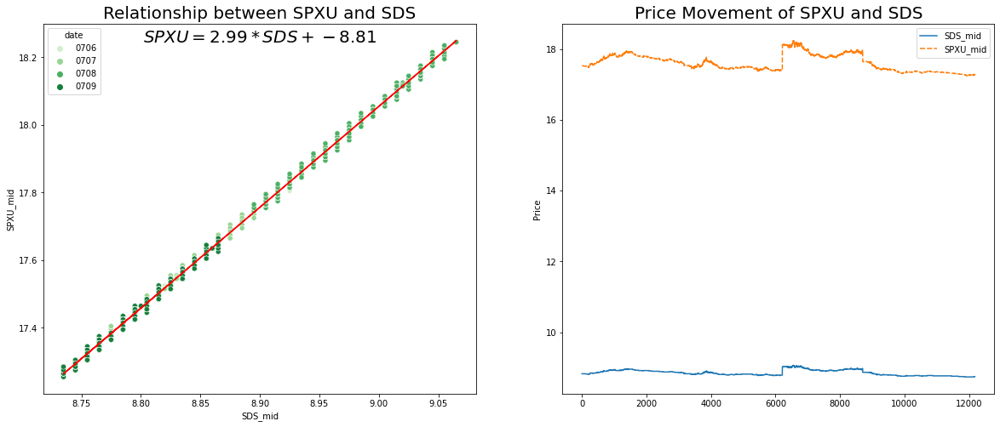

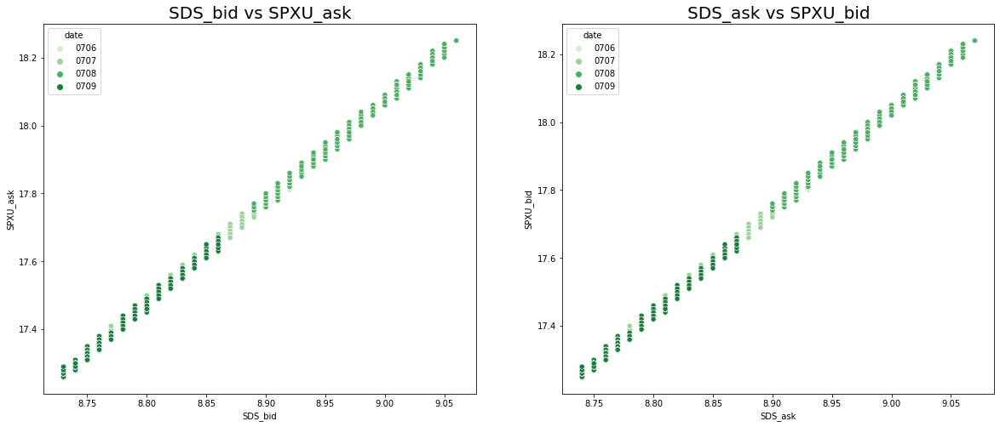

13. Relationship between UPRO(3x) and SSO(2x)
Theoretical slope: 0.694


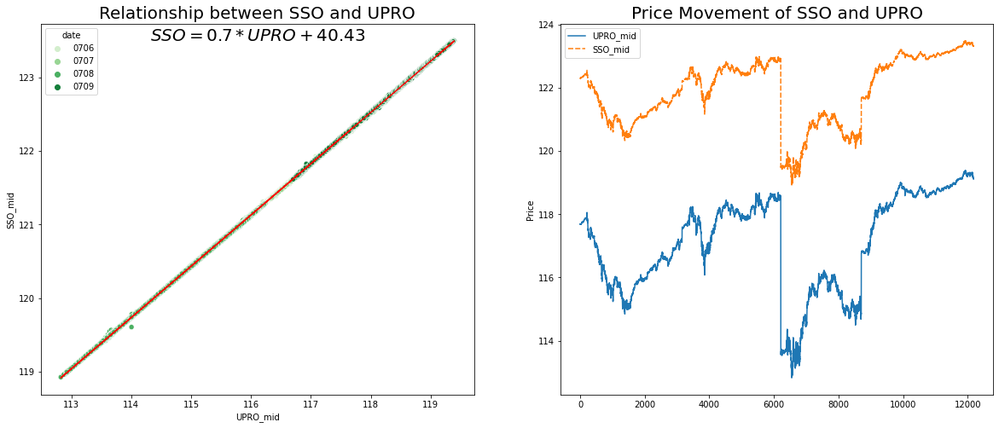

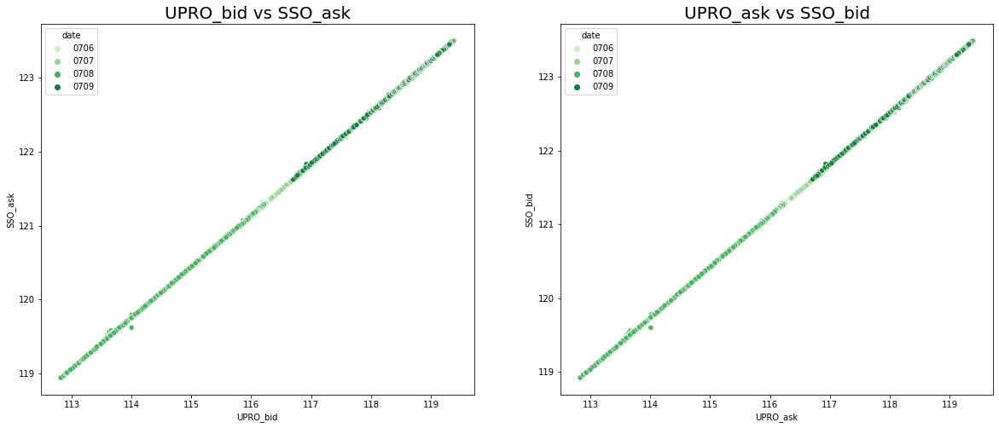

14. Relationship between UPRO(3x) and SPXU(-3x)
Theoretical slope: -0.1505


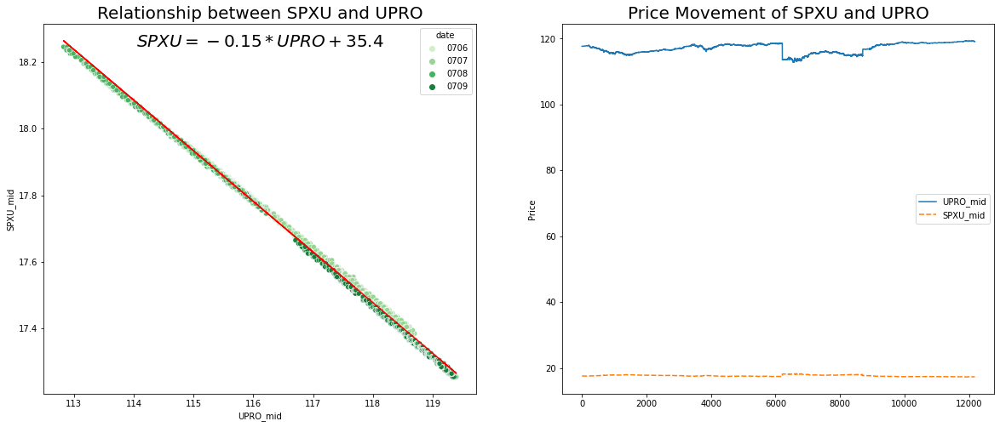

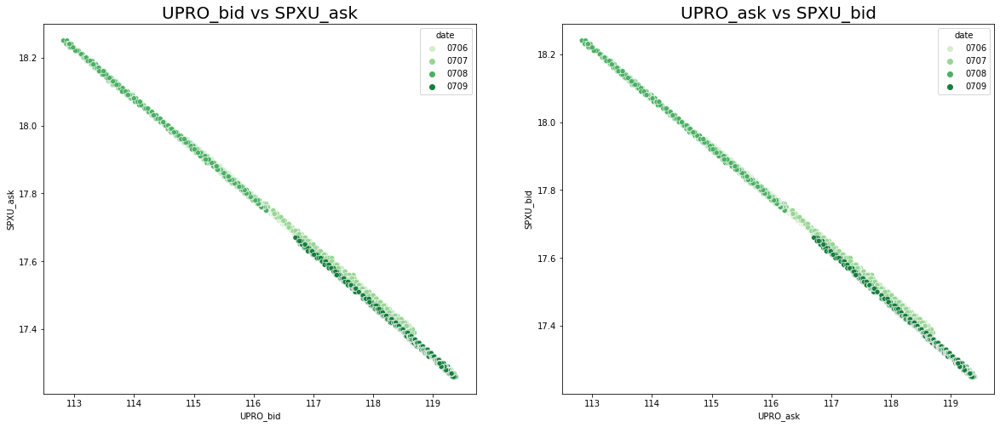

15. Relationship between SSO(2x) and SPXU(-3x)
Theoretical slope: -0.2168


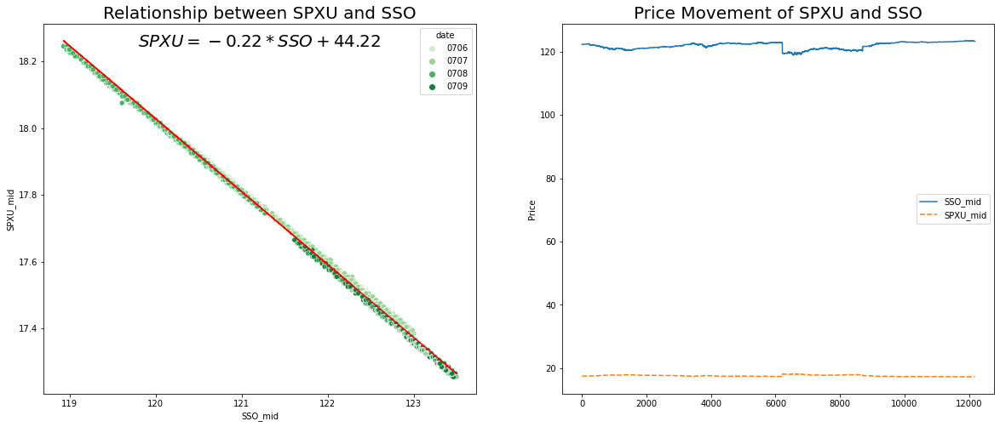

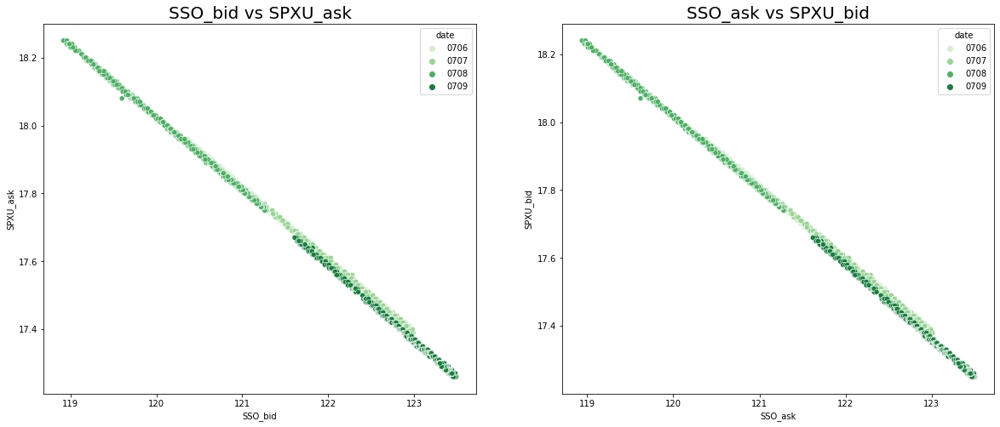

In [36]:
for i, (x_idx, y_idx) in enumerate(itertools.combinations(range(6), 2)):
    x_ticker, y_ticker = TICKERS[x_idx], TICKERS[y_idx]
    slope_theta = get_theoretical_slope(all_data, x_idx, y_idx)
    
    print("{}. Relationship between {}({}) and {}({})".format(i + 1, x_ticker, LEVERAGES[x_ticker], y_ticker, LEVERAGES[y_ticker]))
    print("Theoretical slope: {}".format(round(slope_theta, 4)))
    data_pair, slope, constant = plot_multiple(all_data, x_idx, y_idx, period=None)
    

### (b) Scatter plot and Residual plot between pairs of ETFs

In [187]:
# ["SPY", "SH", "SDS", "UPRO", "SSO", "SPXU"]
LARGE_PRICE = ["SPY", "UPRO", "SSO"]  # price > 100; all long side
SMALL_PRICE = ["SH", "SDS", "SPXU"]   # price < 100; all short side

In [13]:
def partition_residual(df, lookback_window=10, num_bucket=6):
    print("PnL vs Regression Residuals")
    
    df['residual_bucket'] = pd.cut(df['residuals'], num_bucket, labels = False)
    # residual_bucket vs avg_pnl
    mapping = df.groupby(["residual_bucket"])["pnl_abs"].mean()
    print("Average {} seconds pnl for {} bucket:".format(lookback_window, num_bucket))
    print("{}/n".format(mapping))
    df = df.assign(avg_pnl = df.residual_bucket.map(mapping))
    
    plt.figure(figsize=(16,6))
    plt.subplot(1,2,1)
    plt.title("PNL for long-short position as a function of residual bucket", fontsize=16)
    sns.scatterplot(x = np.arange(num_bucket) + 1, y = mapping)
    # plt.scatter(df.residual_bucket,df.avg_pnl)
    plt.xlabel("Regression Residual Bucket")
    plt.ylabel("Forward PNL ($)")
    
    plt.subplot(1,2,2)
    plt.title("PNL for long-short position as a function of residual", fontsize=16)
    sns.scatterplot(x = df["residuals"], y = df["pnl_abs"])
    plt.xlabel("Regression Residuals")
    plt.ylabel("Forward PNL ($)")
    plt.show()
    
    return df

In [14]:
def arbitrary_bound(df, x_ticker, y_ticker, slope, constant, lookback_window):
    x_bid, x_ask = df["{}_bid".format(x_ticker)], df["{}_ask".format(x_ticker)]
    y_bid, y_ask = df["{}_bid".format(y_ticker)], df["{}_ask".format(y_ticker)]
    x_mid, y_mid = df["{}_mid".format(x_ticker)], df["{}_mid".format(y_ticker)]
    
    x_spread, y_spread = 0.5 * (x_ask - x_bid), 0.5 * (y_ask - y_bid)
    
    plt.figure(figsize=(16,8))
    plt.title("Relationship between {} and {}".format(y_ticker, x_ticker), fontsize=20)
    sns.scatterplot(data=df, x="{}_mid".format(x_ticker), y="{}_mid".format(y_ticker), hue="date_hour", palette="Greens")
    
    plt.text((max(x_mid) + min(x_mid)) / 2, 
             max(y_mid), r'${}={}*{} + {}$'.format(y_ticker, round(slope, 2), x_ticker, round(constant, 2)), fontsize=20, ha='center')
    y_pred = slope * x_mid + constant
    plt.plot(x_mid, y_pred, linestyle='-', c="red")
    
    # Embed transaction cost:
    # Vertical direction, 
    #      i) Above -> y overpriced and x underpriced -> short 1 unit of y and long `slope` unit of x -> expected return `epsilon`
    #           Transaction cost = 1 spread of y and `slope` spread of x -> epsilon should be >= 1 * y_spread + slope * x_spread
    #      ii)Below -> y underpriced and x overpriced -> long 1 unit of y and short `slope` unit of x -> expected return `epsilon`
    #           Transaction cost = 1 spread of y and `slope` spread of x -> epsilon should be >= 1 * y_spread + slope * x_spread
    # Horizontal direction will just be the case if we flip the x y axis
    upperbound = y_pred + y_spread + slope * x_spread
    lowerbound = y_pred - y_spread + slope * x_spread
    
    plt.plot(x_mid, upperbound, c = "blue", linestyle = '--', alpha=0.5)
    plt.plot(x_mid, lowerbound, c = "blue", linestyle = '--', alpha=0.5)
    
    plt.show()
    
    y_nparray = y_mid.to_numpy()
    short_y_idx = y_mid[y_mid > upperbound].index
    long_y_idx = y_mid[y_mid < lowerbound].index
    index_arbitrage = np.concatenate((short_y_idx, long_y_idx), axis=None)
    
    num_arbitrage = len(index_arbitrage)
    exp_mean_return = np.mean(df.loc[index_arbitrage]["pnl_abs"])     # difference between residuals
    
    df2 = df[["{}_bid".format(x_ticker), "{}_bid".format(y_ticker), "{}_ask".format(x_ticker), "{}_ask".format(y_ticker)]]
    df2.index = df2.index.shift(-lookback_window, freq='S')
    df2.columns = ["{}_bid_later".format(x_ticker), "{}_bid_later".format(y_ticker), "{}_ask_later".format(x_ticker), "{}_ask_later".format(y_ticker)]
    df = pd.merge_asof(df, df2, left_index=True, right_index=True, direction="forward")

    short_y_return = df.loc[short_y_idx]["{}_bid".format(y_ticker)] - df.loc[short_y_idx]["{}_ask_later".format(y_ticker)] + \
                    slope * (- df.loc[short_y_idx]["{}_ask".format(x_ticker)] + df.loc[short_y_idx]["{}_bid_later".format(x_ticker)])
    long_y_return = -df.loc[long_y_idx]["{}_ask".format(y_ticker)] + df.loc[long_y_idx]["{}_bid_later".format(y_ticker)] + \
                    slope * (df.loc[long_y_idx]["{}_bid".format(x_ticker)] - df.loc[long_y_idx]["{}_ask_later".format(x_ticker)])
    
    act_return = pd.concat([short_y_return, long_y_return])
    act_mean_return = np.mean(act_return)
    
    pos_return = act_return[act_return > 0]
    neg_return = act_return[act_return <= 0]
    
    pos_trade = df.loc[index_arbitrage][df.loc[index_arbitrage]["pnl_abs"] > 0]
    neg_trade = df.loc[index_arbitrage][df.loc[index_arbitrage]["pnl_abs"] <= 0]
    
    print("Total number of data points: {}".format(len(df)))
    print("Number of arbitrage opportunity: {}".format(num_arbitrage))
    print("Expected Mean return of arbitrage opportunity: {}".format(round(exp_mean_return, 4)))
    print("\tPercentage of profitable arbitrage opportunity: {}%".format(100 * round( len(pos_trade)/num_arbitrage, 4)))
    print("\tPercentage of non-profitable arbitrage opportunity: {}%".format(100 * round( len(neg_trade)/num_arbitrage, 4)))
    
    print("Actual Mean return: {}".format(round(act_mean_return, 4)))
    print("\tPercentage of profitable trade: {}%".format(100 * round( len(pos_return)/num_arbitrage, 4)))
    print("\tPercentage of non-profitable trade: {}%".format(100 * round( len(neg_return)/num_arbitrage, 4)))
    

In [15]:
# arbitrary_bound(df, "SPY", "SSO", 0.5454392574209095, -114.19692180836864, 20)

In [16]:
def residual_analysis(df, x_ticker, y_ticker, binrange, num_bins=10, lookback_window=10):
    """
    lookback_window: calculate pnl from now to `lookback_window` seconds later
    """
    print("Regression Residuals Distribution")
    x_mid_str, y_mid_str = "{}_mid".format(x_ticker), "{}_mid".format(y_ticker)
    x_imb_str, y_imb_str = "{}_imb".format(x_ticker), "{}_imb".format(y_ticker)
    
    df["residuals"] = df[y_mid_str] - df["pred_y"]
    plt.figure(figsize=(20,8))
    plt.subplot(1,2,1)
    plt.title("Regression residuals (y={}, x={})".format(y_ticker, x_ticker), fontsize=15)
    sns.lineplot(data=df["residuals"])
    plt.axhline(y=0, c="red")
    plt.fill_between(df.index, df["residuals"])
    
    plt.subplot(1,2,2)
    plt.title("Regression residuals vs time of day".format(y_ticker, x_ticker), fontsize=15)
    lowerbound, upperbound = np.quantile(df["residuals"], (0.05, 0.95))

    df["abmormal"] = df['residuals'].apply(lambda x: 1 if x >= upperbound or x <= lowerbound else 0)
    sns.scatterplot(data=df, x="time", y="residuals", hue="abmormal")
    plt.show()
    
    plt.figure(figsize=(15,5))
    plt.title("Boxplot of Residuals in every half hour".format(num_bins), fontsize=16)
    sns.boxplot(data=df, x="half_hour", y="residuals")
    plt.show()
    
    plt.figure(figsize=(20,8))
    plt.subplot(1,2,1)
    plt.title("Frequency of Residuals", fontsize=16)
    sns.histplot(data=df, x="residuals")
    
    plt.subplot(1,2,2)
    plt.title("Frequency of Residuals (num_bins = {})".format(num_bins), fontsize=16)
    sns.histplot(data=df, x="residuals", bins=num_bins, kde=True, binrange=binrange)
    plt.show()
    
    df1 = df.set_index("time")
    is_duplicate = df1.index.duplicated(keep="first")
    not_duplicate = ~is_duplicate
    df1 = df1[not_duplicate]

    df2 = df1[["residuals", x_mid_str, y_mid_str, x_imb_str, y_imb_str]]
    df2.index = df2.index.shift(-lookback_window, freq='S')
    df2.columns=["residual_later", x_mid_str+"_later", y_mid_str+"_later", x_imb_str+"_later", y_imb_str+"_later"]
    df = pd.merge_asof(df1, df2, left_index=True, right_index=True, direction="forward")
    
    df['pnl_abs'] = df["residual_later"] - df["residuals"]  # forward pnl
    df['mid1_diff'] = df[x_mid_str+"_later"] - df[x_mid_str]
    df['mid2_diff'] = df[y_mid_str+"_later"] - df[y_mid_str]
    df.dropna(inplace=True)
    
    return df

Relationship between SDS(-2x) and SH(-1x)


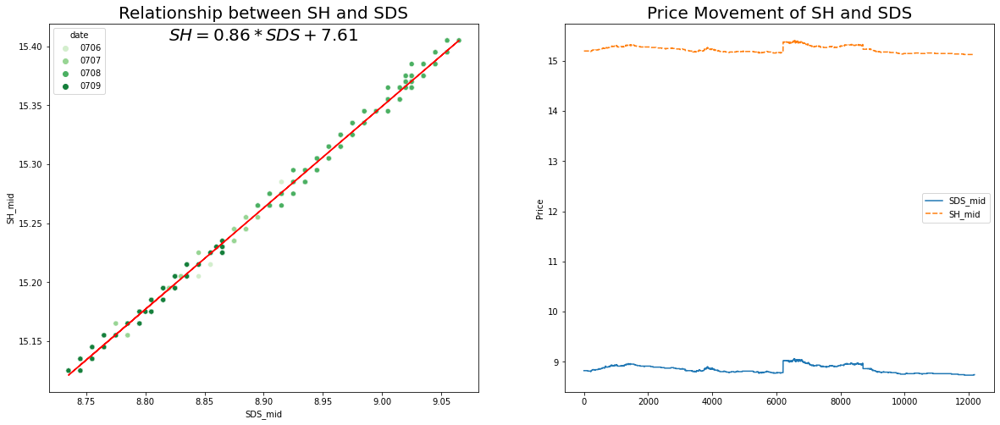

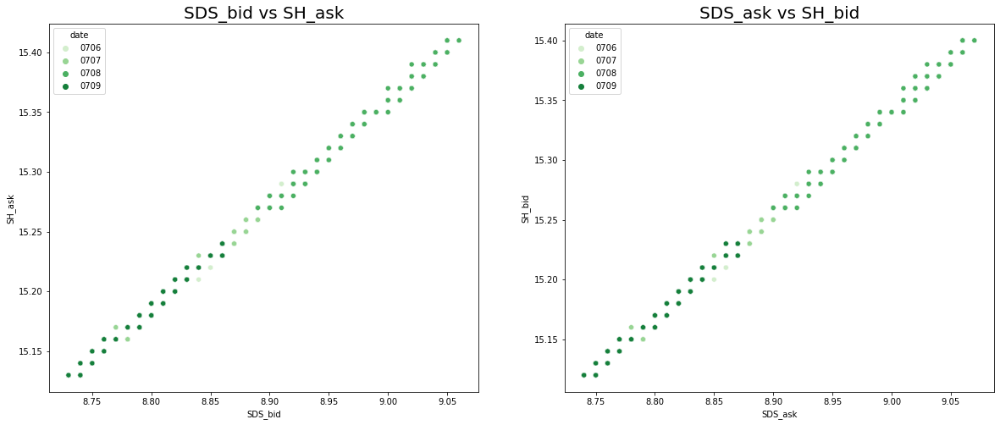

       SDS_mid  SH_mid   SDS_imb    SH_imb     pred_y  \
0        8.825  15.195  0.452394  0.674542  15.198575   
1        8.825  15.195  0.452394  0.688163  15.198575   
2        8.825  15.195  0.452394  0.688163  15.198575   
3        8.825  15.195  0.479481  0.699361  15.198575   
4        8.825  15.195  0.479481  0.699361  15.198575   
...        ...     ...       ...       ...        ...   
12177    8.745  15.125  0.384633  0.473605  15.129766   
12178    8.745  15.125  0.383737  0.473605  15.129766   
12179    8.745  15.125  0.391213  0.480908  15.129766   
12180    8.745  15.125  0.393176  0.480908  15.129766   
12181    8.745  15.125  0.474885  0.514549  15.129766   

                            time half_hour  
0     2021-07-06 09:30:09.232986  09:30-59  
1     2021-07-06 09:30:18.059942  09:30-59  
2     2021-07-06 09:30:19.062293  09:30-59  
3     2021-07-06 09:30:29.072767  09:30-59  
4     2021-07-06 09:30:29.072767  09:30-59  
...                          ...       ...  


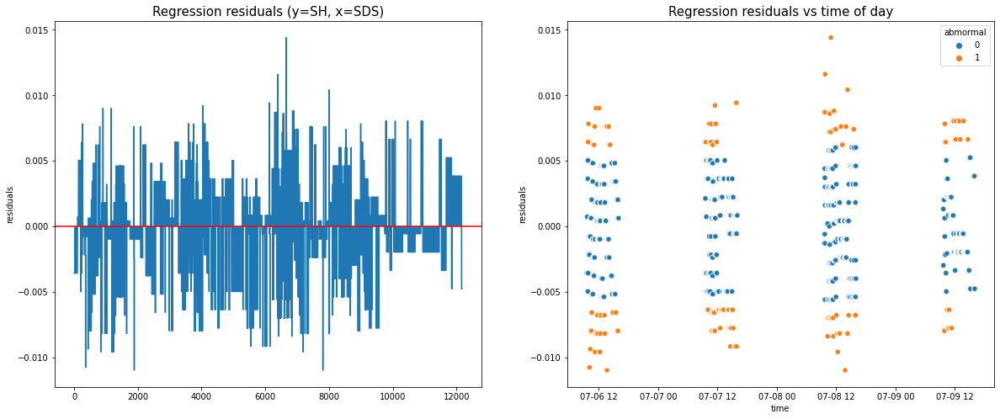

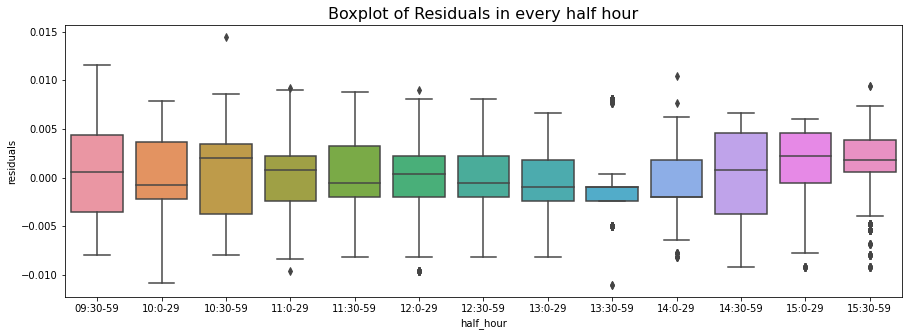

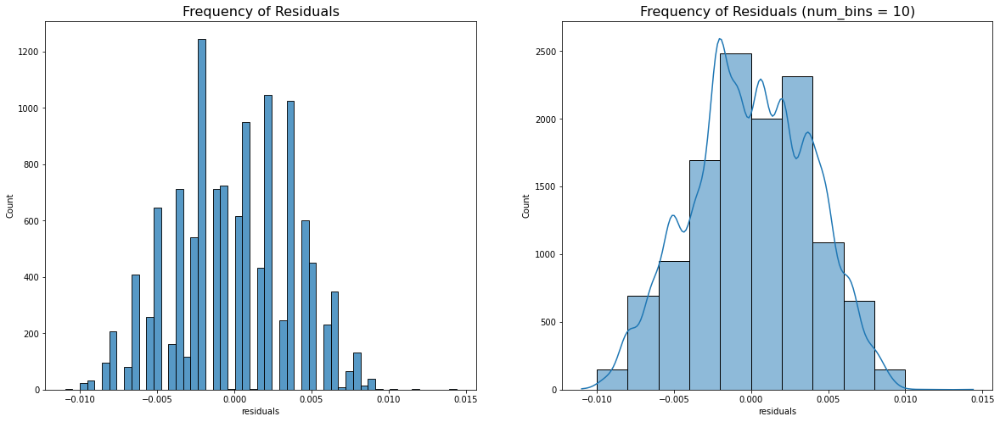

PnL vs Regression Residuals
Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.002267
1    0.000259
2   -0.001257
3   -0.003168
Name: pnl_abs, dtype: float64/n


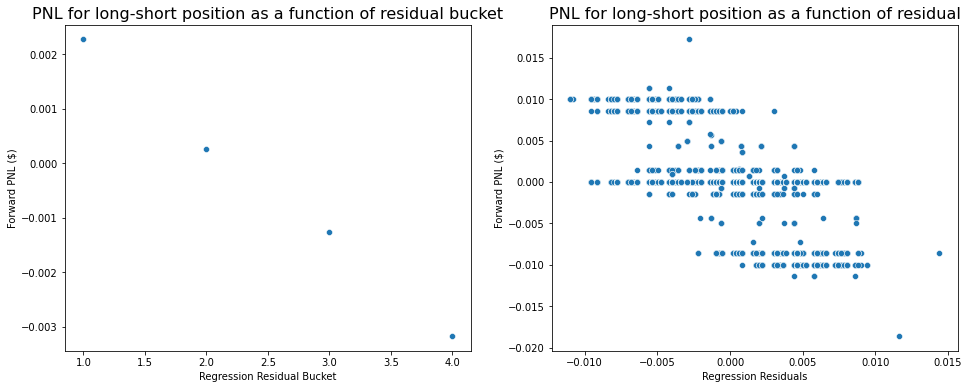

In [33]:
x_ticker, y_ticker = "SDS", "SH"   # "SPY", "SH", "SDS", "UPRO", "SSO", "SPXU"
x_mid_str, y_mid_str = "{}_mid".format(x_ticker), "{}_mid".format(y_ticker)

print("Relationship between {}({}) and {}({})".format(x_ticker, LEVERAGES[x_ticker], y_ticker, LEVERAGES[y_ticker]))
data_pair, slope, constant = plot_multiple(all_data, TICKERS2INDEX[x_ticker], TICKERS2INDEX[y_ticker], period=None)
pred_y = constant + slope * data_pair[x_mid_str]

print(data_pair)
data_pair = residual_analysis(data_pair, x_ticker, y_ticker, binrange=(-0.01, 0.01), num_bins=10, lookback_window=20)
data_pair = partition_residual(data_pair, lookback_window=20, num_bucket=4)
# print(x_ticker, y_ticker, slope, constant)
# arbitrary_bound(df, x_ticker, y_ticker, slope, constant, 20)

### (c) Split the discussion into large and small cap and compare within groups 

### Large Price

1. Analysis of SPY(1x) and UPRO(3x)
Theoretical slope: 0.8116
Relationship between SPY(1x) and UPRO(3x)


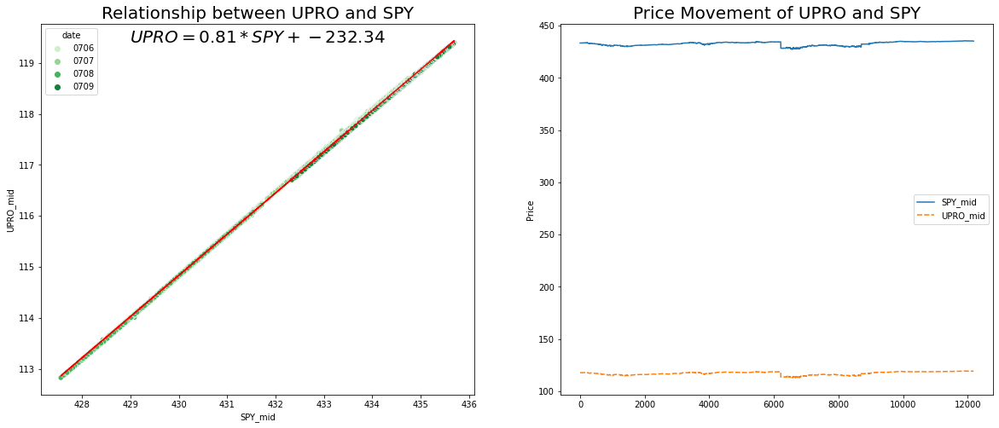

Regression Residuals Distribution


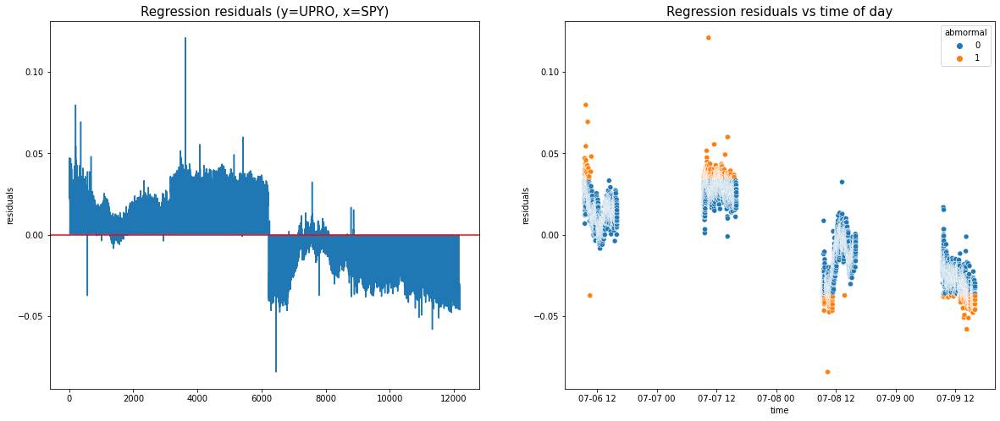

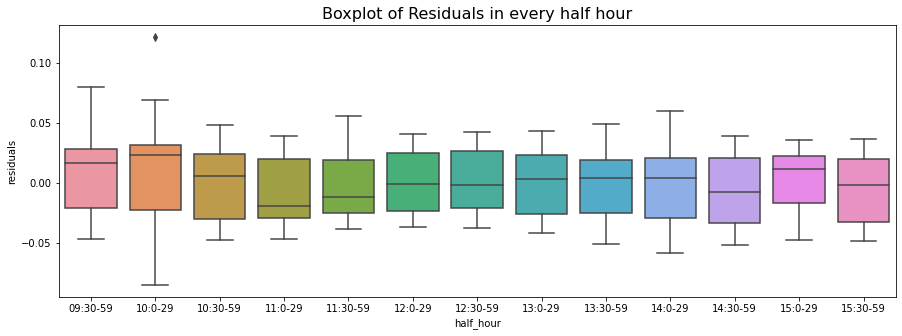

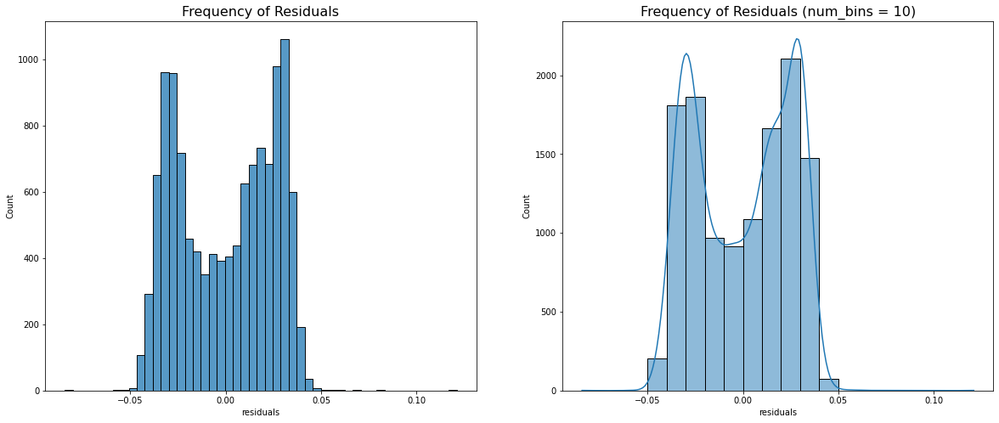

PnL vs Regression Residuals
Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.002683
1   -0.000027
2   -0.000881
3   -0.063536
Name: pnl_abs, dtype: float64/n


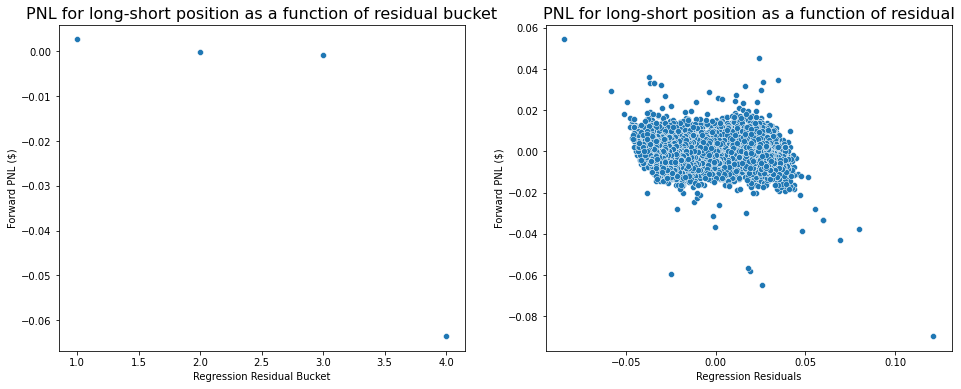





2. Analysis of SPY(1x) and SSO(2x)
Theoretical slope: 0.5633
Relationship between SPY(1x) and SSO(2x)


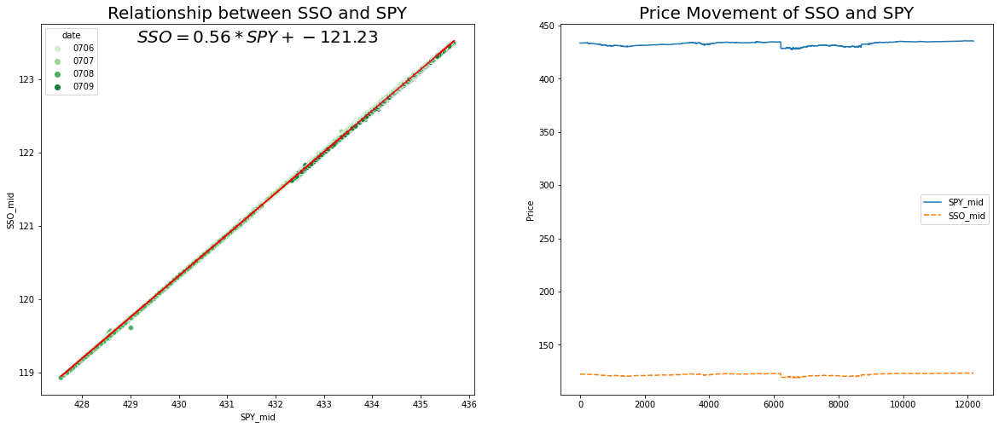

Regression Residuals Distribution


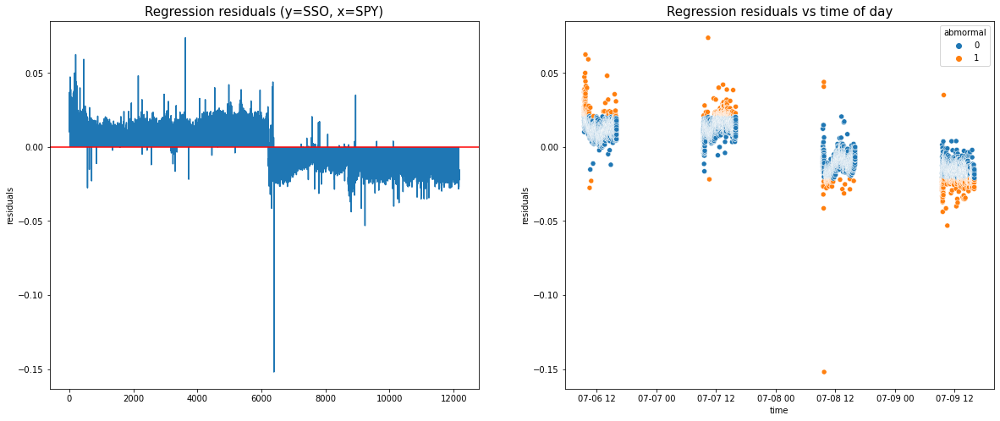

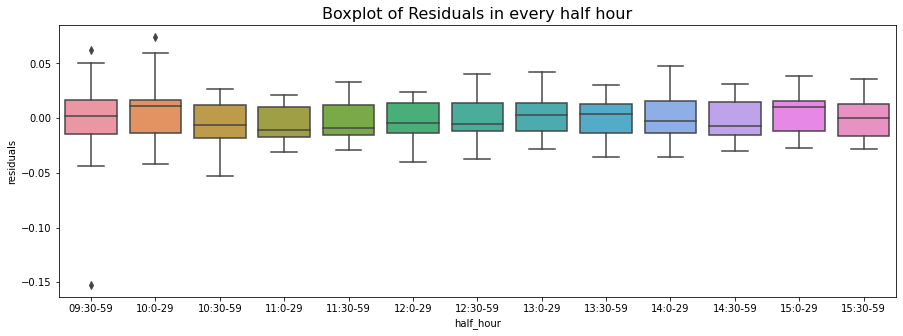

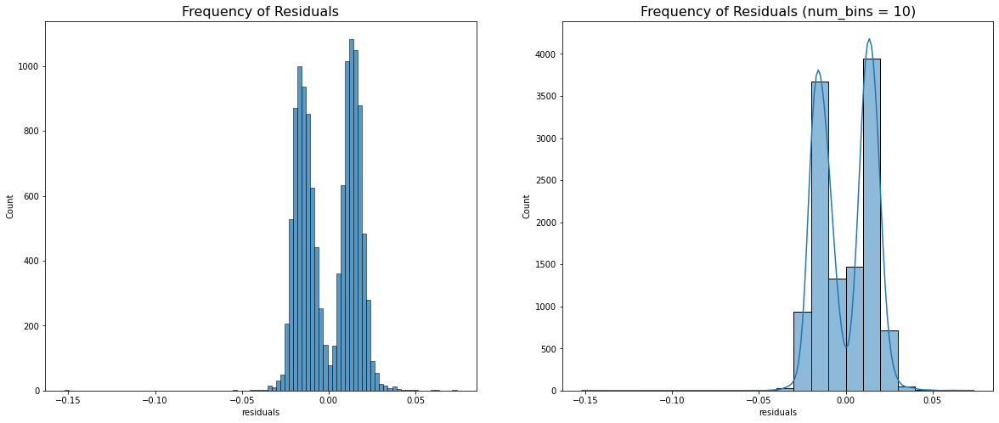

PnL vs Regression Residuals
Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.128365
1    0.035803
2    0.000392
3   -0.003007
Name: pnl_abs, dtype: float64/n


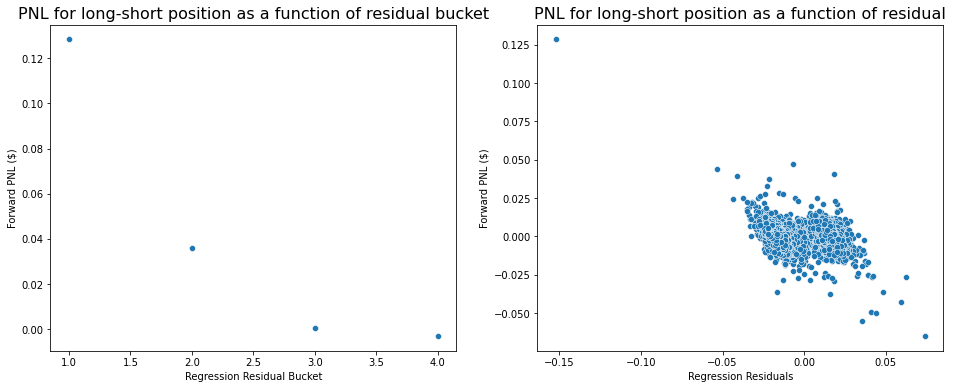





3. Analysis of UPRO(3x) and SSO(2x)
Theoretical slope: 0.694
Relationship between UPRO(3x) and SSO(2x)


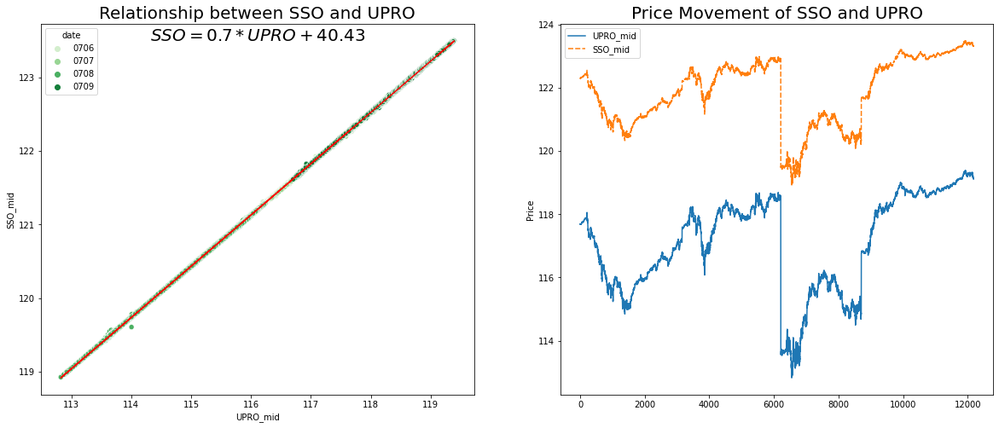

Regression Residuals Distribution


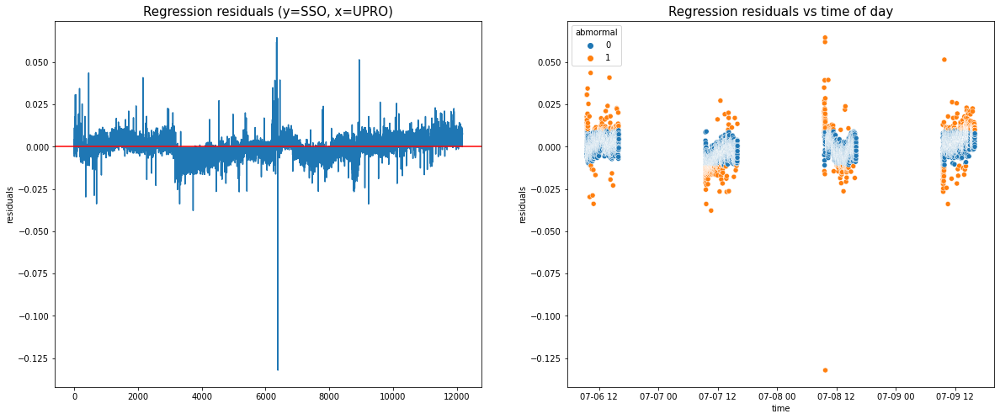

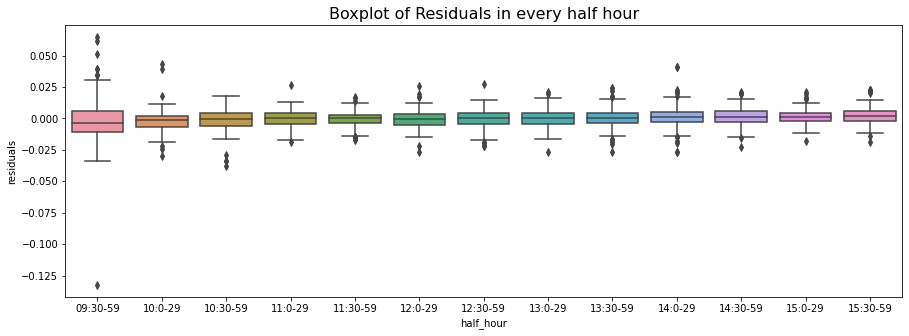

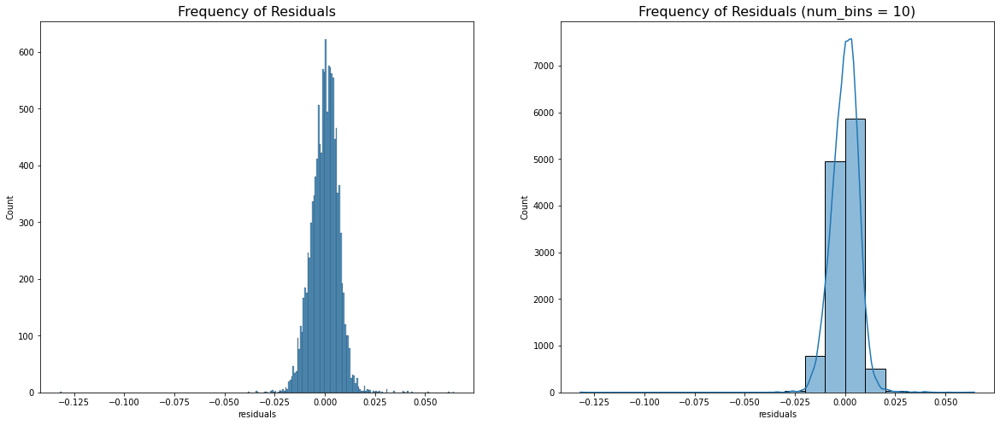

PnL vs Regression Residuals
Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.130657
1    0.037175
2    0.000100
3   -0.013391
Name: pnl_abs, dtype: float64/n


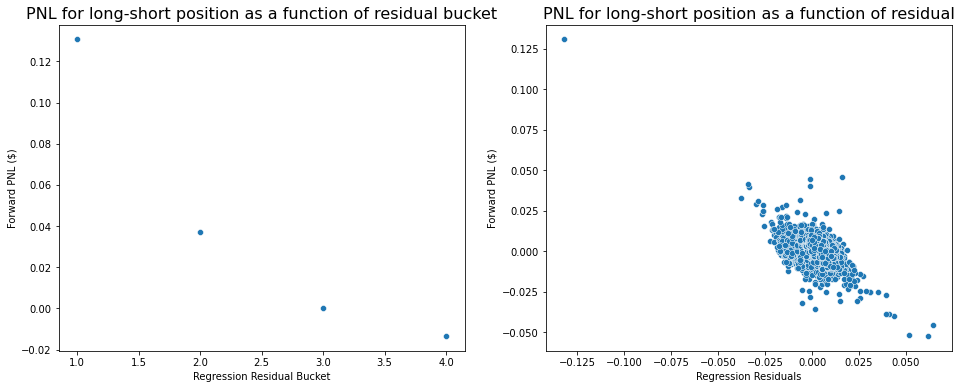

In [40]:
for i, (x_ticker, y_ticker) in enumerate(itertools.combinations(LARGE_PRICE, 2)):
    x_idx, y_idx = TICKERS2INDEX[x_ticker], TICKERS2INDEX[y_ticker]
    slope_theta = get_theoretical_slope(all_data, x_idx, y_idx)
    
    if slope_theta > 1:
        x_ticker, y_ticker = y_ticker, x_ticker
        x_idx, y_idx = TICKERS2INDEX[x_ticker], TICKERS2INDEX[y_ticker]
        
    slope_theta = get_theoretical_slope(all_data, x_idx, y_idx)
    
    print("{}. Analysis of {}({}) and {}({})".format(i + 1, x_ticker, LEVERAGES[x_ticker], y_ticker, LEVERAGES[y_ticker]))
    print("Theoretical slope: {}".format(round(slope_theta, 4)))
    
    x_mid_str, y_mid_str = "{}_mid".format(x_ticker), "{}_mid".format(y_ticker)

    print("Relationship between {}({}) and {}({})".format(x_ticker, LEVERAGES[x_ticker], y_ticker, LEVERAGES[y_ticker]))
    data_pair, slope, constant = plot_multiple(all_data, TICKERS2INDEX[x_ticker], TICKERS2INDEX[y_ticker], period=None)
    pred_y = constant + slope * data_pair[x_mid_str]

    df = residual_analysis(data_pair, x_ticker, y_ticker, binrange=(-0.05, 0.05), lookback_window=20)
    df = partition_residual(df, lookback_window=20, num_bucket=4)
#     arbitrary_bound(df, x_ticker, y_ticker, slope, constant, 30)
    print("\n\n\n")

### Small price

1. Analysis of SDS(-2x) and SH(-1x)
Relationship between SDS(-2x) and SH(-1x)


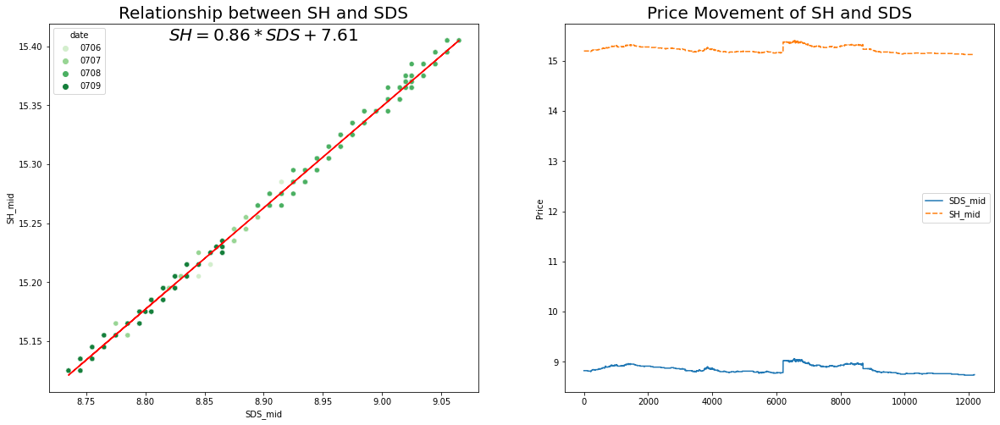

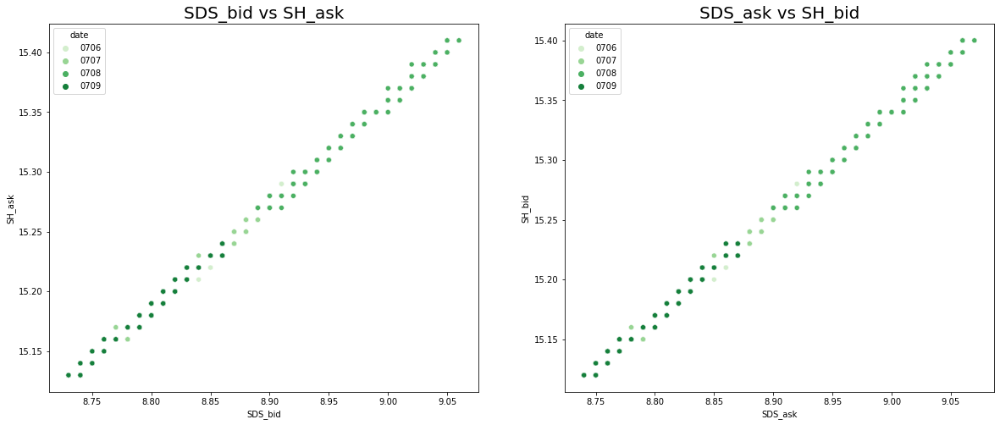

Regression Residuals Distribution


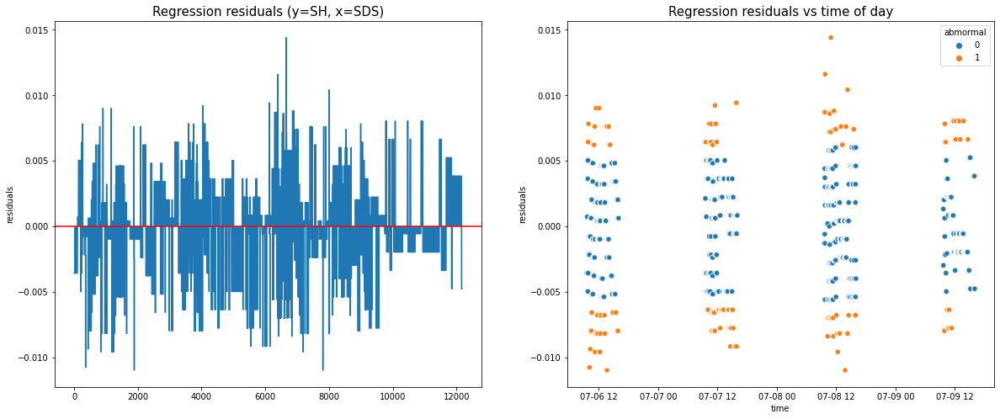

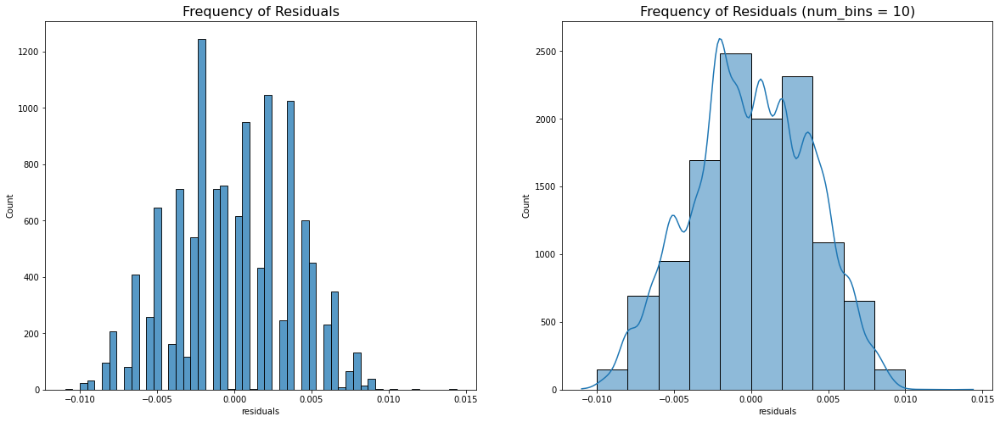

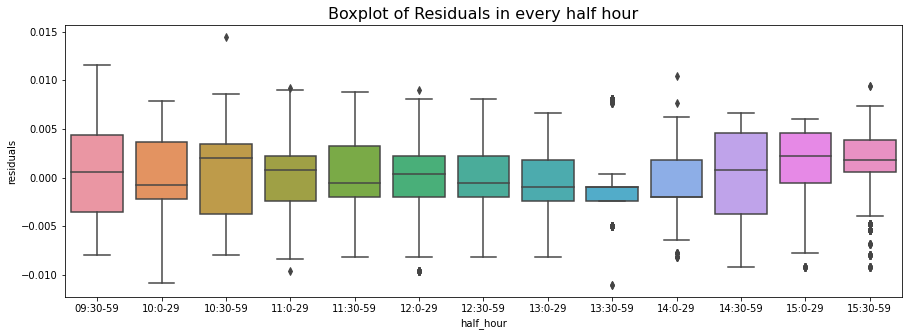

PnL vs Regression Residuals
Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.002267
1    0.000259
2   -0.001257
3   -0.003168
Name: pnl_abs, dtype: float64/n


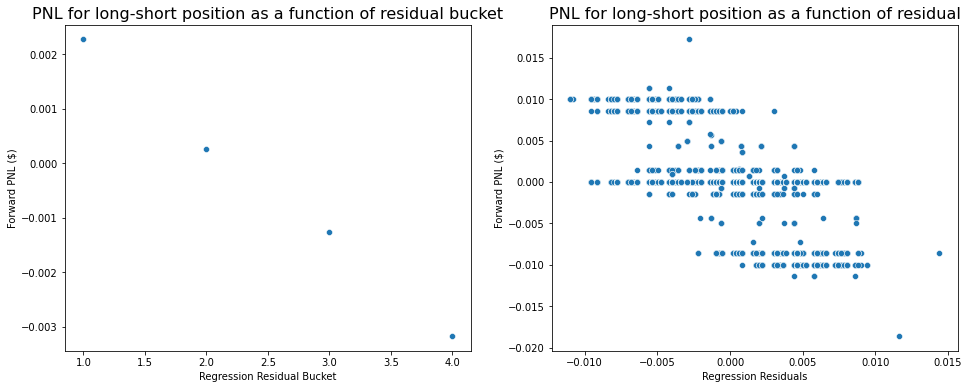





2. Analysis of SPXU(-3x) and SH(-1x)
Relationship between SPXU(-3x) and SH(-1x)


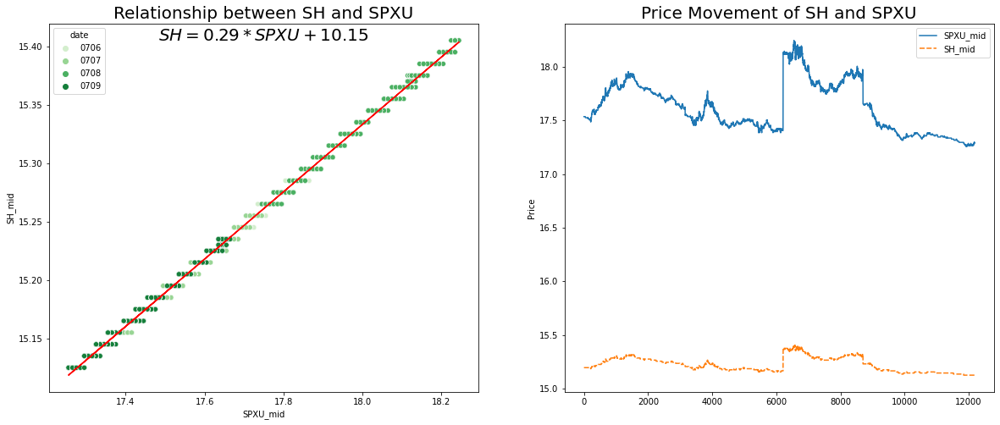

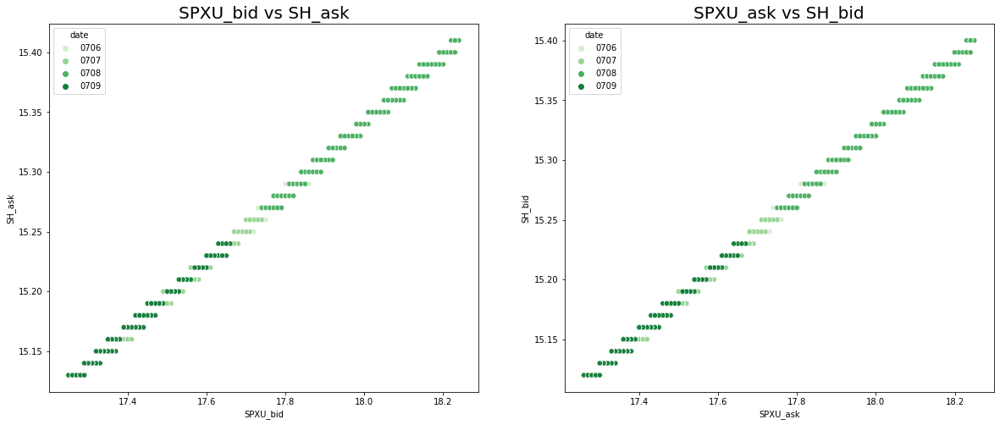

Regression Residuals Distribution


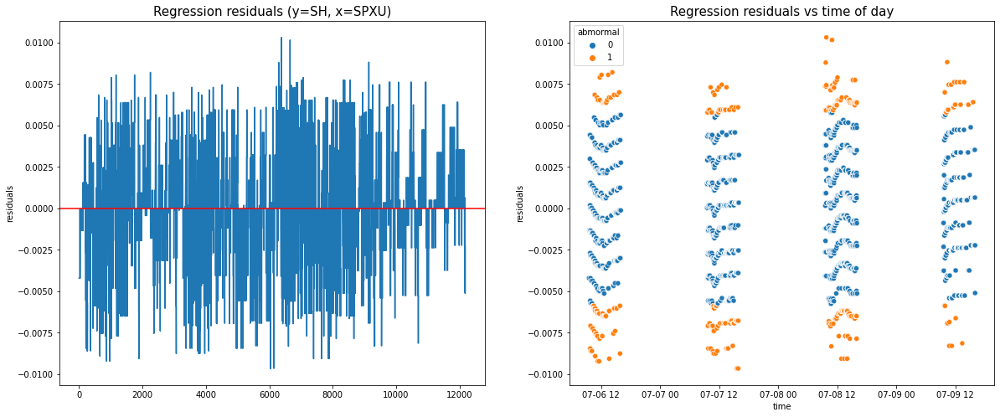

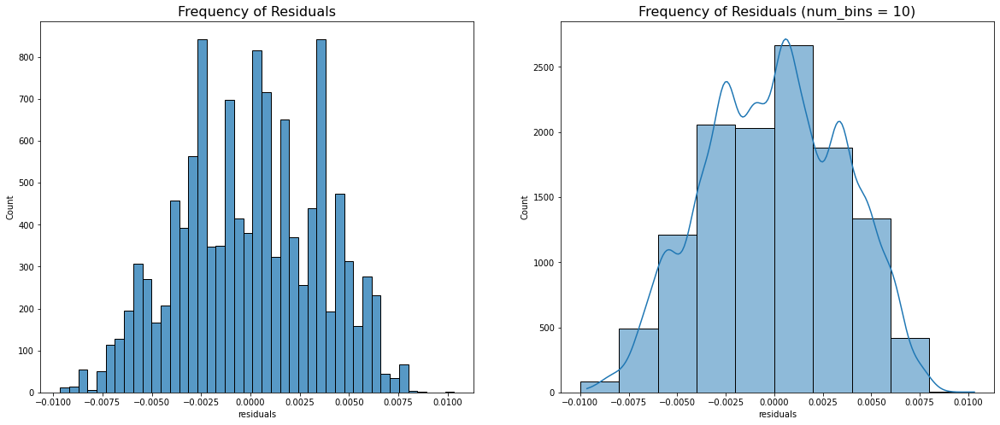

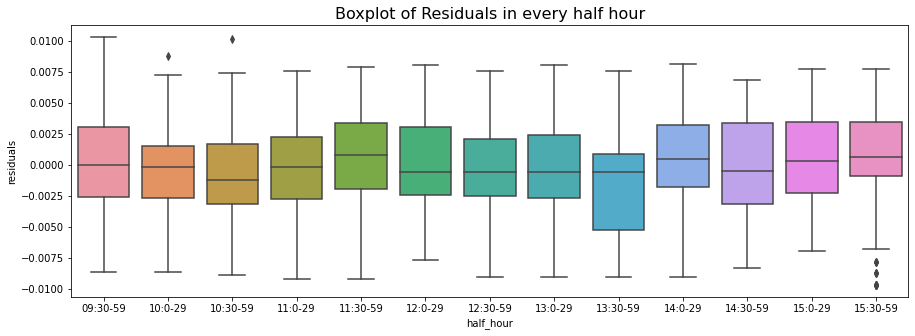

PnL vs Regression Residuals
Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.002120
1    0.000300
2   -0.000405
3   -0.003080
Name: pnl_abs, dtype: float64/n


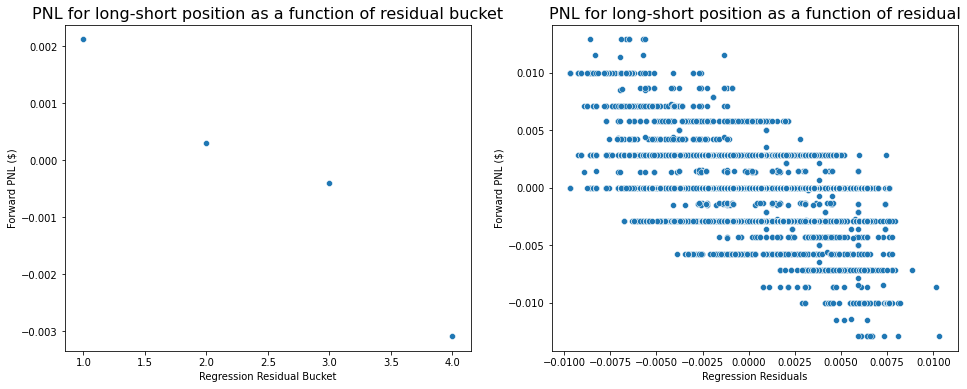





3. Analysis of SPXU(-3x) and SDS(-2x)
Relationship between SPXU(-3x) and SDS(-2x)


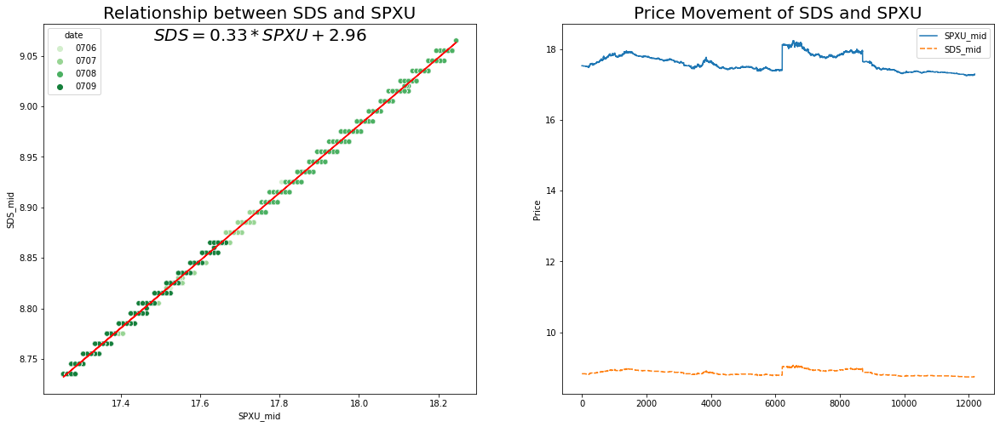

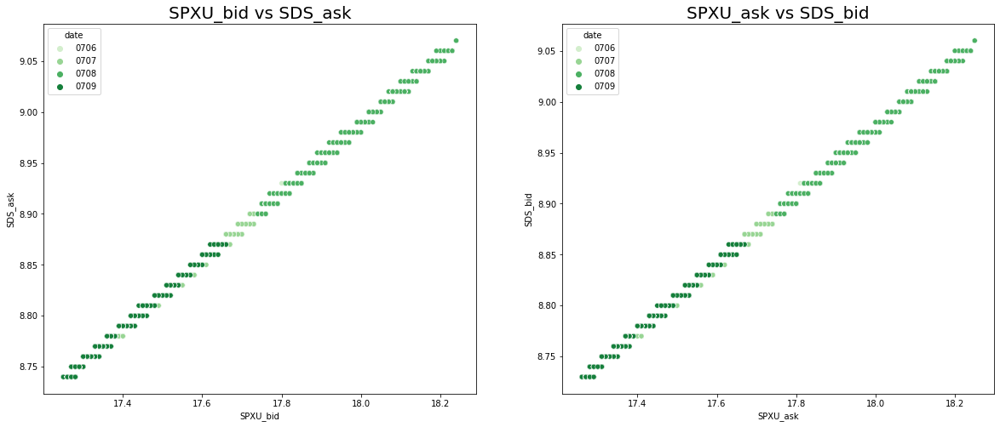

Regression Residuals Distribution


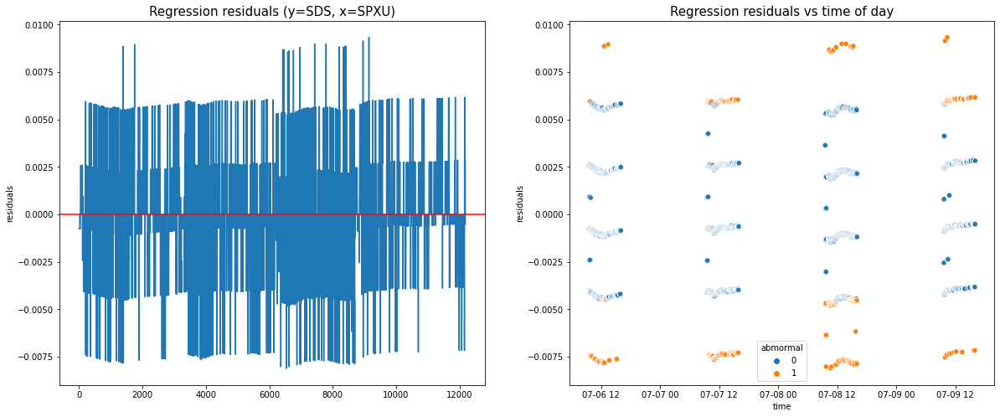

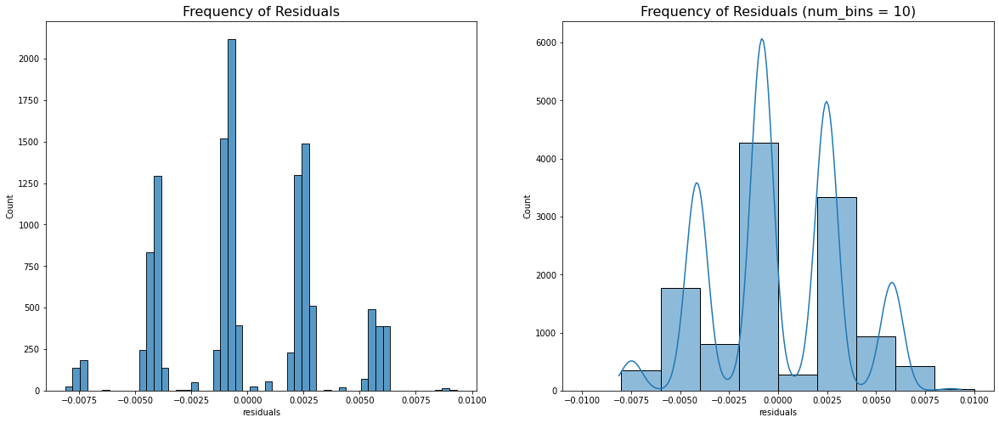

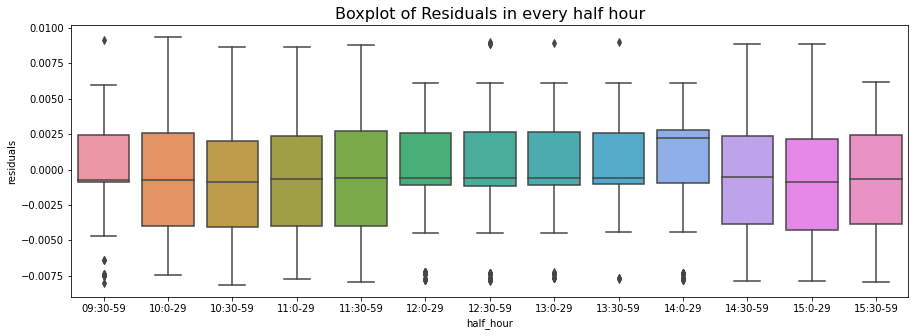

PnL vs Regression Residuals
Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.001801
1    0.000174
2   -0.000538
3   -0.002848
Name: pnl_abs, dtype: float64/n


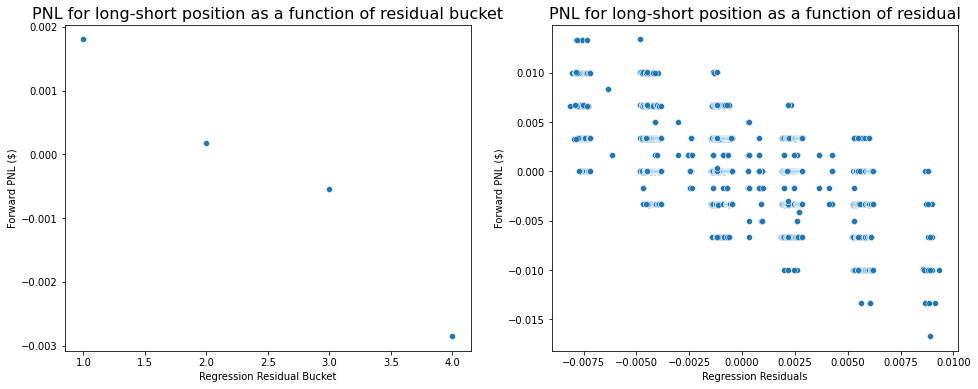

In [215]:
for i, (x_ticker, y_ticker) in enumerate(itertools.combinations(SMALL_PRICE, 2)):
    x_idx, y_idx = TICKERS2INDEX[x_ticker], TICKERS2INDEX[y_ticker]
    
    slope_theta = get_theoretical_slope(all_data, x_idx, y_idx)
    
    if slope_theta > 1:
        x_ticker, y_ticker = y_ticker, x_ticker
        
    print("{}. Analysis of {}({}) and {}({})".format(i + 1, x_ticker, LEVERAGES[x_ticker], y_ticker, LEVERAGES[y_ticker]))
    x_mid_str, y_mid_str = "{}_mid".format(x_ticker), "{}_mid".format(y_ticker)

    print("Relationship between {}({}) and {}({})".format(x_ticker, LEVERAGES[x_ticker], y_ticker, LEVERAGES[y_ticker]))
    data_pair, slope, constant = plot_multiple(all_data, TICKERS2INDEX[x_ticker], TICKERS2INDEX[y_ticker], period=None)
    pred_y = constant + slope * data_pair[x_mid_str]
    
    df = residual_analysis(data_pair, x_ticker, y_ticker, binrange=(-0.01, 0.01), num_bins=10, lookback_window=20)
    df = partition_residual(df, lookback_window=20, num_bucket=4)
#     arbitrary_bound(df, x_ticker, y_ticker, slope, constant, 30)
    print("\n\n\n")

### Residual plots for regression line and quadratic curve
7/13~7/27

In [219]:
STDS = list()
for i in range(6):
    ticker = TICKERS[i]
    STDS.append(np.std(all_data["{}_mid".format(ticker)]))
df_std = pd.DataFrame()
df_std["standard deviation"] = STDS
df_std.index = TICKERS
df_std["leverage"] = list(map(LEVERAGES.get, TICKERS))
df_std.sort_values("standard deviation")

,standard deviation,leverage
SH,0.066968,-1x
SDS,0.077731,-2x
SPXU,0.232266,-3x
SSO,1.063177,2x
UPRO,1.528142,3x
SPY,1.892444,1x


In [17]:
def plot_curve(df, i, j):
    x_ticker, y_ticker = TICKERS[i], TICKERS[j]
    
    x_mid, y_mid = df["{}_mid".format(x_ticker)], df["{}_mid".format(y_ticker)]
    
    print("Relationship between y={}({}) and x={}({})".format(y_ticker, LEVERAGES[y_ticker], x_ticker, LEVERAGES[x_ticker]))
    plt.figure(figsize=(20,6))
    plt.subplot(1,2,1)
    plt.title("y={}({}), x={}({})".format(y_ticker, LEVERAGES[y_ticker], x_ticker, LEVERAGES[x_ticker]), fontsize=20)
    sns.scatterplot(data=all_data, x="{}_mid".format(x_ticker), y="{}_mid".format(y_ticker), hue="date", palette="Greens")
    
    plt.subplot(1,2,2)
    plt.title("Zoom in version", fontsize=20)
    sns.scatterplot(data=all_data, x="{}_mid".format(x_ticker), y="{}_mid".format(y_ticker), hue="date", palette="Greens")
    
    if np.mean(x_mid) > 100:  # large price
        x_lower, x_upper = 0.4, 0.6
    else:
        x_lower, x_upper = 0.2, 0.8
    
    if np.mean(y_mid) > 100:  # large price
        y_lower, y_upper = 0.4, 0.6
    else:
        y_lower, y_upper = 0.2, 0.8
        
    plt.axis([np.quantile(x_mid, x_lower), np.quantile(x_mid, x_upper), np.quantile(y_mid, y_lower), np.quantile(y_mid, y_upper)])
    plt.show()
    
    print("Residual plots for different curve fitting setup")
    # 1. Fit a straight line
    plt.figure(figsize=(20,12))
    plt.subplot(2,2,1)
    
    x, y = x_mid, y_mid
    x = sm.add_constant(x)
    model = sm.OLS(y, x)
    result = model.fit()
    constant = result.params[0]
    slope = result.params[1]
    
    x_linspace = np.linspace(min(x_mid), max(x_mid))
    y_pred_1 = slope * x_mid + constant
    residuals = y_mid - y_pred_1
    plt.title("${}={}*{} + {}$".format(y_ticker, round(slope, 3), x_ticker, round(constant, 3)), fontsize=15)
    sns.lineplot(data=residuals)
    plt.axhline(y=0, c="red")
    plt.fill_between(df.index, residuals)

    # 2. Fit a curve
    plt.subplot(2,2,2)
    model = np.poly1d(np.polyfit(x_mid, y_mid, 2))
    
    y_pred_2 = model(x_mid)
    residuals = y_mid - y_pred_2
    param = model.c
    plt.title("Fit a curve\n${}={}*{}^2 + {}*{} + {}$".format(y_ticker, round(param[0], 3), x_ticker, round(param[1], 3), x_ticker, round(param[2], 3)), fontsize=15)
    sns.lineplot(data=residuals)
    plt.axhline(y=0, c="red")
    plt.fill_between(df.index, residuals)
    
    # 3. Fit a curve with mid price and time
    def objective1(X, a, b, c):
        x, t = X[0], X[1]
        return a * x * x + b * x + c * t
    
    X = np.stack((x_mid, all_data.index), axis=0).reshape(2, -1)
    param, _ = curve_fit(objective1, X, y)
    y_pred_3 = objective1(X, *param)
    
    plt.subplot(2,2,3)
    residuals = y_mid - y_pred_3
    plt.title("Fit a curve with t\n${}={}*{}^2 + {}*{} + {}*index$".format(y_ticker, round(param[0], 3), x_ticker, round(param[1], 3), x_ticker, round(param[2], 3)), fontsize=15)
    sns.lineplot(data=residuals)
    plt.axhline(y=0, c="red")
    plt.fill_between(df.index, residuals)
    
    # 4. Fit a curve with mid price and std ratio
    def objective2(X, a, b, c):
        x, std_ratios = X[0], X[1]
        return a * x + b * std_ratios + c
    
    temp = pd.DataFrame()
    temp['x_mid'] = x_mid.rolling(100).std()
    temp['y_mid'] = y_mid.rolling(100).std()
    rep = np.quantile(temp['y_mid']/temp['x_mid'], 0.95)
    temp["std_ratios"] = np.where(temp['x_mid'] != 0, temp['y_mid']/temp['x_mid'], rep)
    temp = temp.dropna()
    
    X = np.stack((temp['x_mid'], temp["std_ratios"]), axis=0).reshape(2, -1)
    
    param, _ = curve_fit(objective2, X, temp['y_mid'])
    y_pred_4 = objective2(X, *param)
    
    plt.subplot(2,2,4)
    residuals = temp['y_mid'] - y_pred_4
    plt.title("Fit a curve with t\n${}={}*{} + {}*{} + {}*index$".format(y_ticker, round(param[0], 3), x_ticker, round(param[1], 3), "std\_ratios", round(param[2], 3)), fontsize=15)
    sns.lineplot(data=residuals)
    plt.axhline(y=0, c="red")
    plt.fill_between(temp.index, residuals) 
    plt.show()
#     print("1. Fit a straight line")
#     plt.figure(figsize=(20,8))
#     plt.subplot(1,2,1)
#     plt.title("Fit a straight line", fontsize=20)
#     sns.scatterplot(data=all_data, x="{}_mid".format(x_ticker), y="{}_mid".format(y_ticker), hue="date", palette="Greens")
#     plt.axis([np.quantile(x_mid, 0.35), np.quantile(x_mid, 0.65), np.quantile(y_mid, 0.35), np.quantile(y_mid, 0.65)])
    
#     x = sm.add_constant(x)
#     model = sm.OLS(y, x)
#     result = model.fit()
#     constant = result.params[0]
#     slope = result.params[1]
    
#     x_linspace = np.linspace(min(x_mid), max(x_mid))
# #     plt.text((max(x_mid) + min(x_mid)) / 2, 
# #              max(y_mid), r'${}={}*{} + {}$'.format(y_ticker, round(slope, 2), x_ticker, round(constant, 2)), fontsize=20, ha='center')
#     y_pred_1 = slope * x_mid + constant
#     plt.plot(x_linspace, slope * x_linspace + constant, linestyle='-', c="red")

#     plt.subplot(1,2,2)
#     residuals = y_mid - y_pred_1
#     plt.title("${}={}*{} + {}$".format(y_ticker, round(slope, 2), x_ticker, round(constant, 4)), fontsize=15)
#     sns.lineplot(data=residuals)
#     plt.axhline(y=0, c="red")
#     plt.fill_between(df.index, residuals)
#     plt.show()
    
#     print("2. Fit a curve")
#     plt.figure(figsize=(20,8))
#     plt.subplot(1,2,1)
#     plt.title("Fit a quadratic curve", fontsize=20)
#     sns.scatterplot(data=all_data, x="{}_mid".format(x_ticker), y="{}_mid".format(y_ticker), hue="date", palette="Greens")
#     plt.axis([np.quantile(x_mid, 0.35), np.quantile(x_mid, 0.65), np.quantile(y_mid, 0.35), np.quantile(y_mid, 0.65)])
    
#     model = np.poly1d(np.polyfit(x_mid, y_mid, 2))
#     plt.plot(x_linspace, model(x_linspace), linestyle='-', c="red")
    
#     y_pred_2 = model(x_mid)
#     residuals = y_mid - y_pred_2
#     plt.subplot(1,2,2)
#     param = model.c
#     plt.title("Fit a curve\n${}={}*{}^2 + {}*{} + {}$".format(y_ticker, round(param[0], 4), x_ticker, round(param[1], 4), x_ticker, round(param[2], 4)), fontsize=15)
#     sns.lineplot(data=residuals)
#     plt.axhline(y=0, c="red")
#     plt.fill_between(df.index, residuals)
#     plt.show()
    
#     def objective(X, a, b, c):
#         x, t = X[0], X[1]
#         return a * x * x + b * x + c * t
    
#     print("3. Fit a curve with mid price and time")
#     plt.figure(figsize=(20,8))
#     plt.subplot(1,2,1)
#     plt.title("Fit a quadratic curve with t", fontsize=20)
#     sns.scatterplot(data=all_data, x="{}_mid".format(x_ticker), y="{}_mid".format(y_ticker), hue="date", palette="Greens")
#     plt.axis([np.quantile(x_mid, 0.35), np.quantile(x_mid, 0.65), np.quantile(y_mid, 0.35), np.quantile(y_mid, 0.65)])
    
#     # curve fit
#     X = np.stack((x_mid, all_data.index), axis=0).reshape(2, -1)
#     param, _ = curve_fit(objective, X, y)
#     y_pred_3 = objective(X, *param)
    
#     plt.plot(x_mid, y_pred_3, linestyle='-', c="red")
#     residuals = y_mid - y_pred_3
#     plt.subplot(1,2,2)
#     plt.title("Fit a curve with t\n${}={}*{}^2 + {}*{} + {}*index$".format(y_ticker, round(param[0], 4), x_ticker, round(param[1], 4), x_ticker, round(param[2], 4)), fontsize=15)
#     sns.lineplot(data=residuals)
#     plt.axhline(y=0, c="red")
#     plt.fill_between(df.index, residuals)
# #     plt.margins(0.5)
# #     plt.tight_layout(pad=1.05)
#     plt.show()

1. UPRO and SPY
Relationship between y=UPRO(3x) and x=SPY(1x)


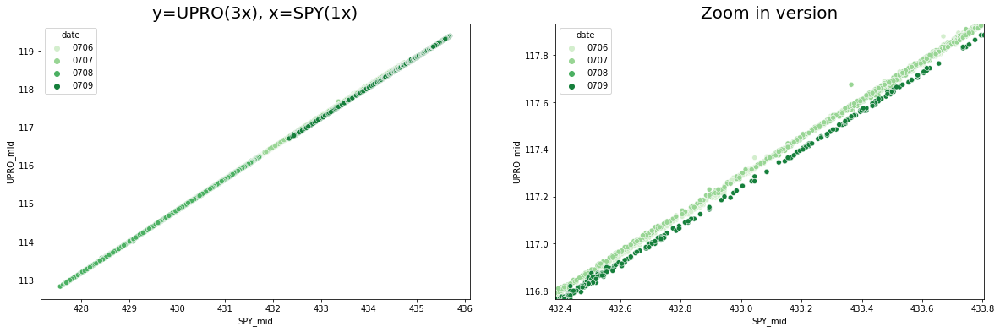

Residual plots for different curve fitting setup


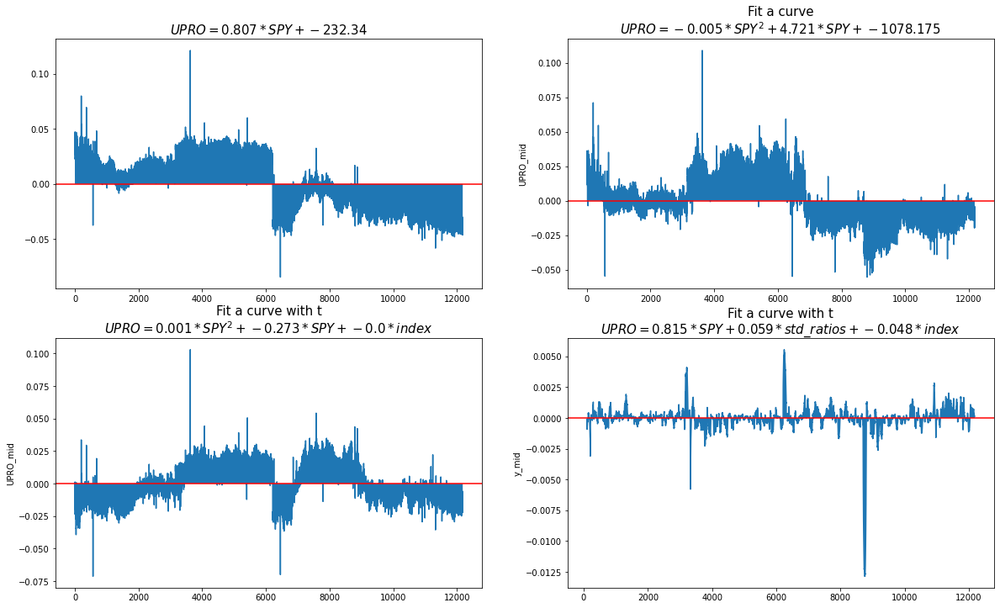

2. SSO and SPY
Relationship between y=SSO(2x) and x=SPY(1x)


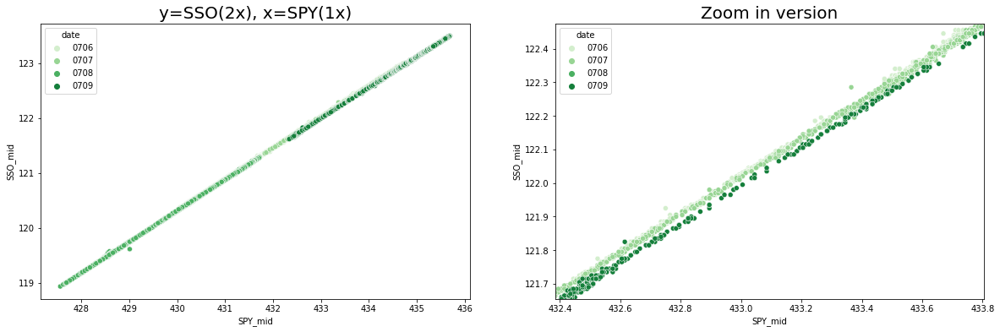

Residual plots for different curve fitting setup


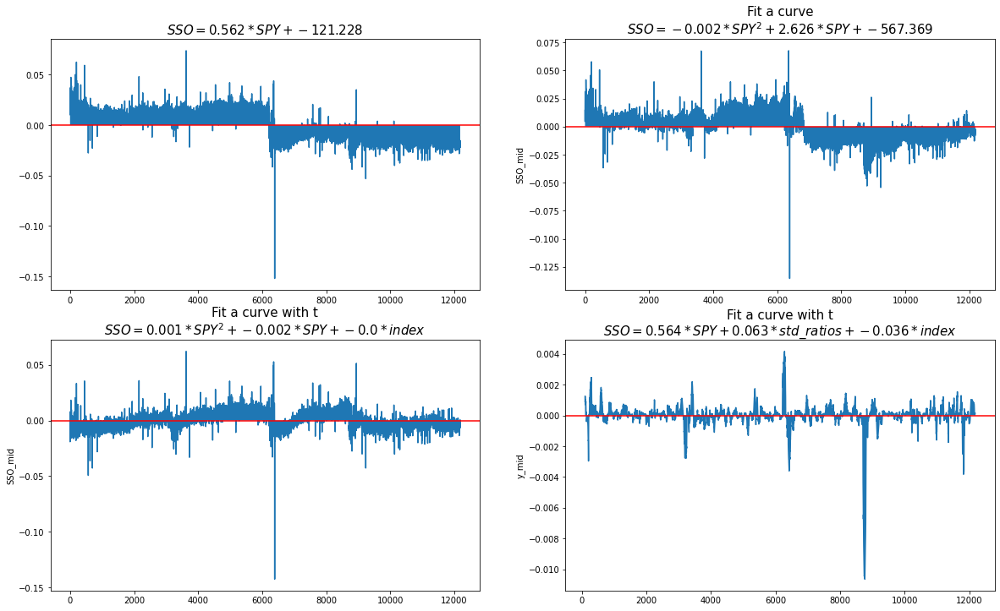

3. SSO and UPRO
Relationship between y=SSO(2x) and x=UPRO(3x)


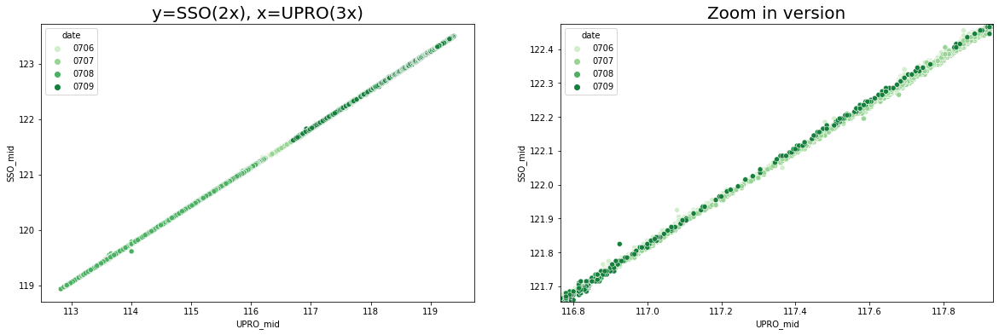

Residual plots for different curve fitting setup


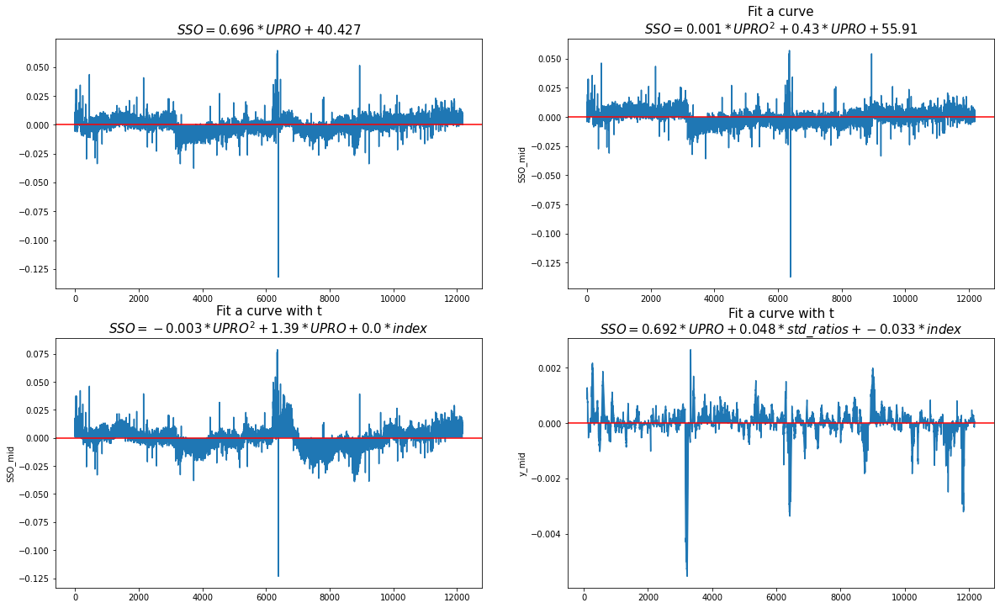

In [281]:
for i, (x_ticker, y_ticker) in enumerate(itertools.combinations(LARGE_CAP, 2)):
    x_idx, y_idx = TICKERS2INDEX[x_ticker], TICKERS2INDEX[y_ticker]
    slope_theta = get_theoretical_slope(all_data, x_idx, y_idx)
    
    if slope_theta > 1:
        x_ticker, y_ticker = y_ticker, x_ticker
        x_idx, y_idx = y_idx, x_idx
    
    print("{}. {} and {}".format(i + 1, y_ticker, x_ticker))
    plot_curve(all_data, x_idx, y_idx)

1. SH and SDS
Relationship between y=SH(-1x) and x=SDS(-2x)


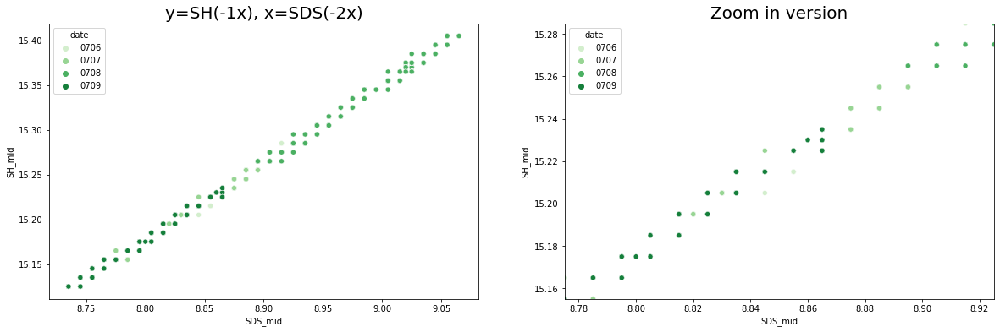

Residual plots for different curve fitting setup


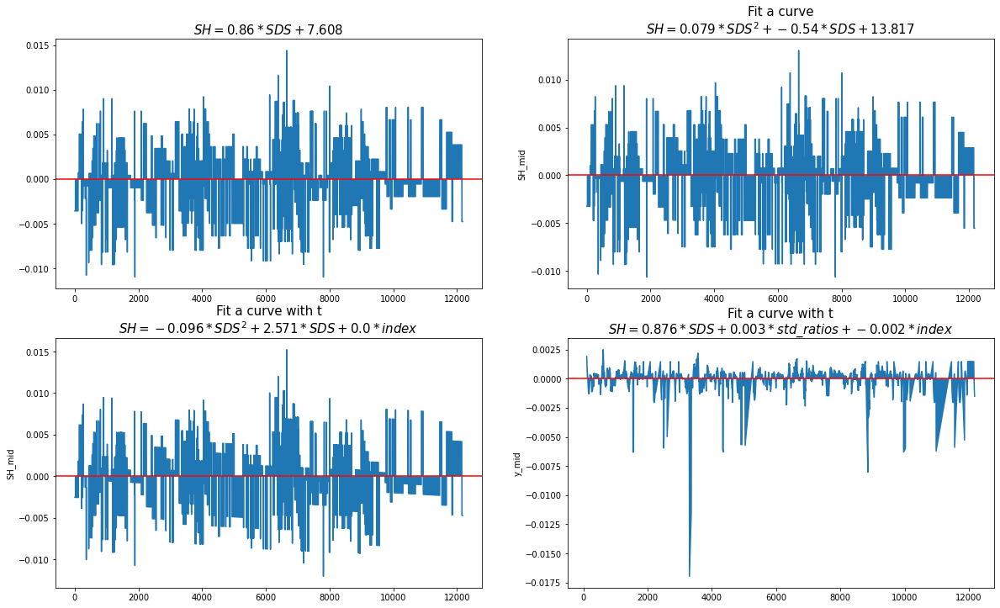

2. SH and SPXU
Relationship between y=SH(-1x) and x=SPXU(-3x)


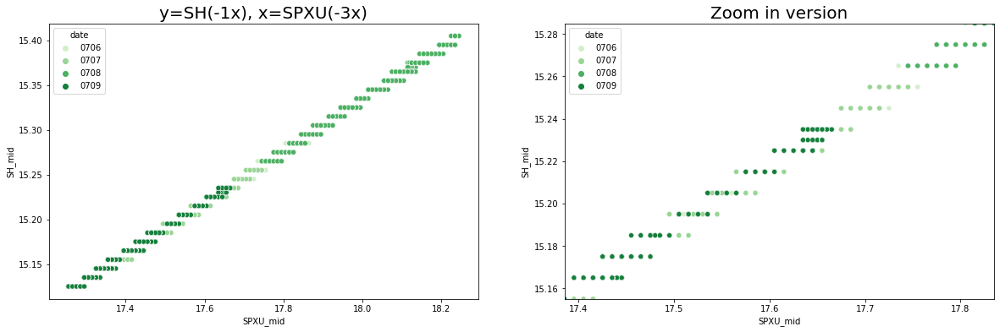

Residual plots for different curve fitting setup


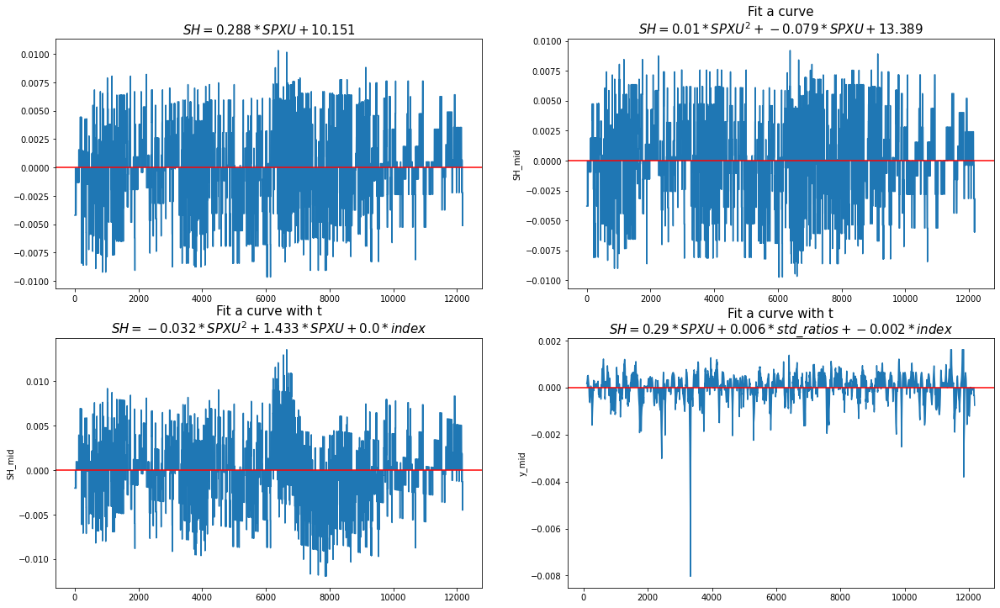

3. SDS and SPXU
Relationship between y=SDS(-2x) and x=SPXU(-3x)


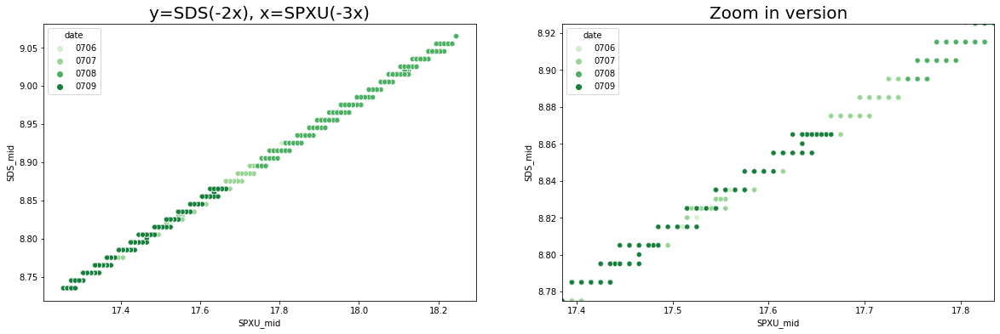

Residual plots for different curve fitting setup


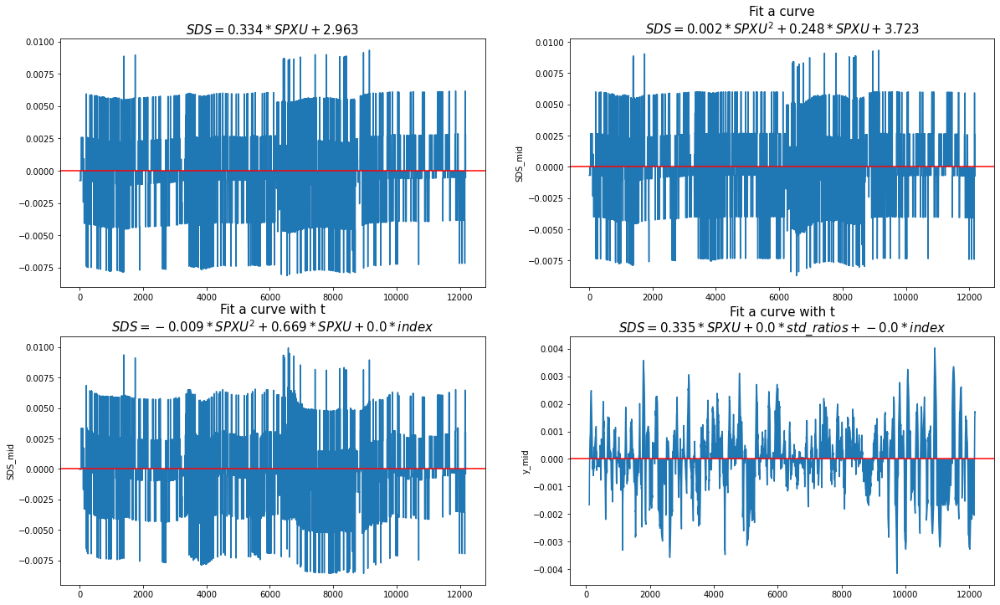

In [282]:
for i, (x_ticker, y_ticker) in enumerate(itertools.combinations(SMALL_CAP, 2)):
    x_idx, y_idx = TICKERS2INDEX[x_ticker], TICKERS2INDEX[y_ticker]
    slope_theta = get_theoretical_slope(all_data, x_idx, y_idx)
    
    if slope_theta > 1:
        x_ticker, y_ticker = y_ticker, x_ticker
        x_idx, y_idx = y_idx, x_idx
        
    print("{}. {} and {}".format(i + 1, y_ticker, x_ticker))
    plot_curve(all_data, x_idx, y_idx)

1. SH and SPY
Relationship between y=SH(-1x) and x=SPY(1x)


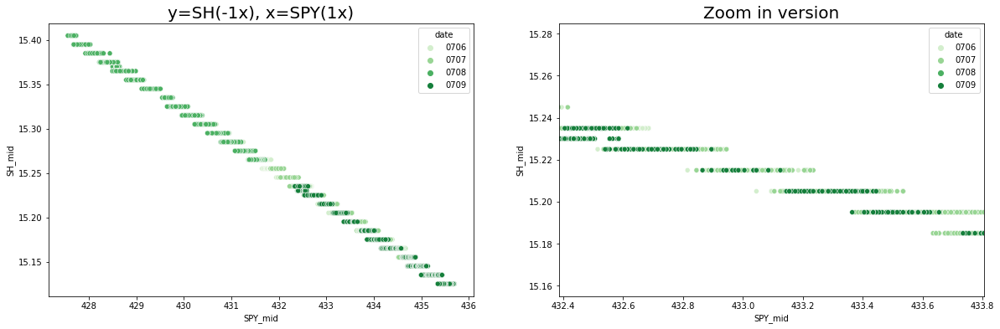

Residual plots for different curve fitting setup


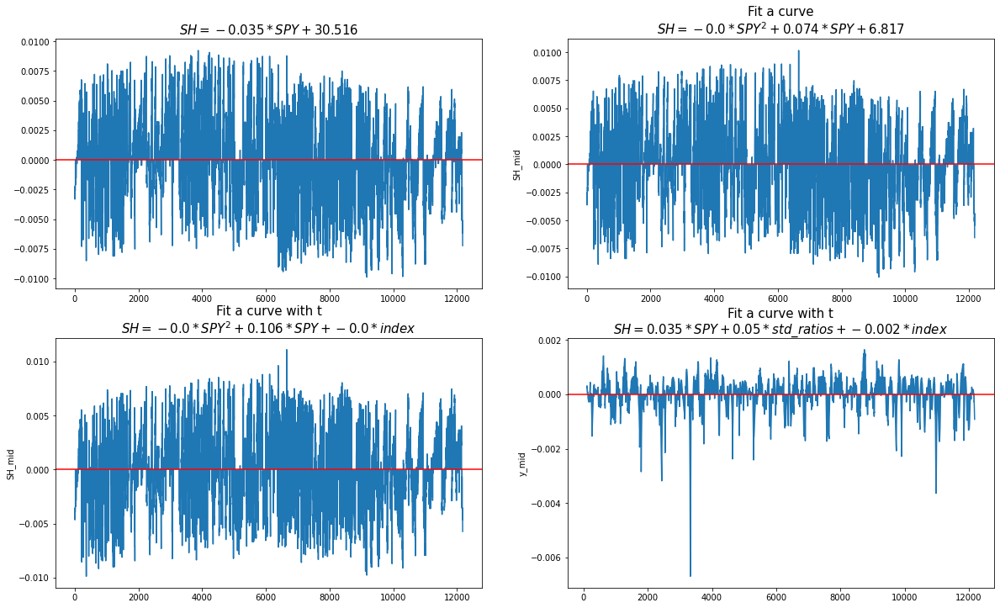

2. SDS and SPY
Relationship between y=SDS(-2x) and x=SPY(1x)


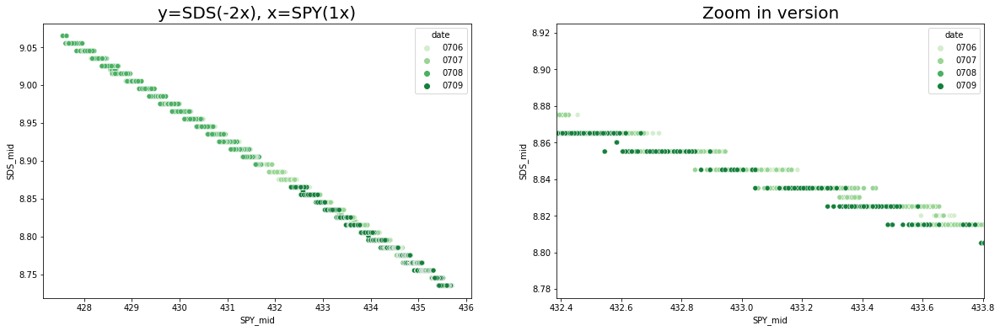

Residual plots for different curve fitting setup


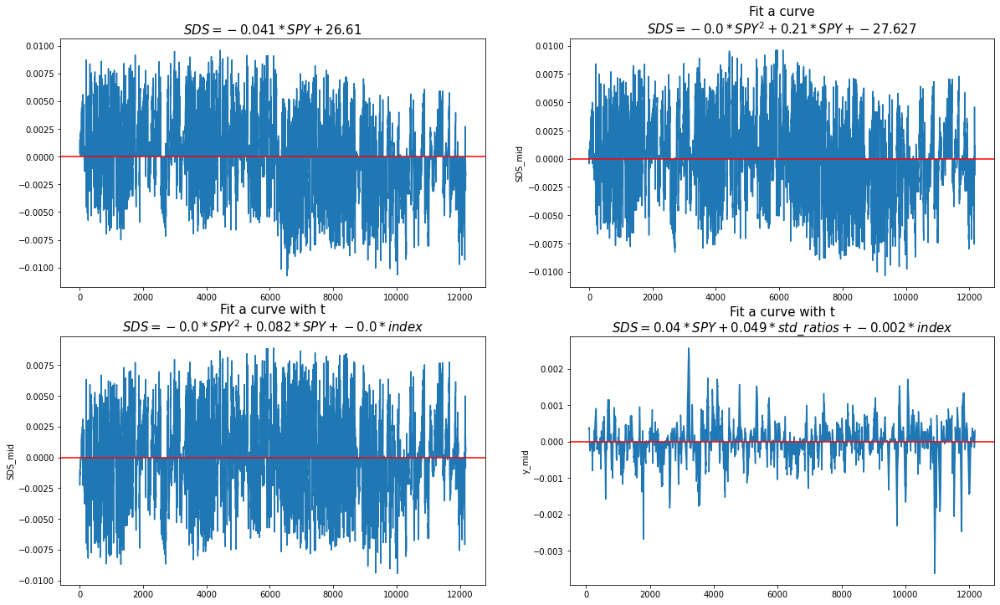

3. UPRO and SPY
Relationship between y=UPRO(3x) and x=SPY(1x)


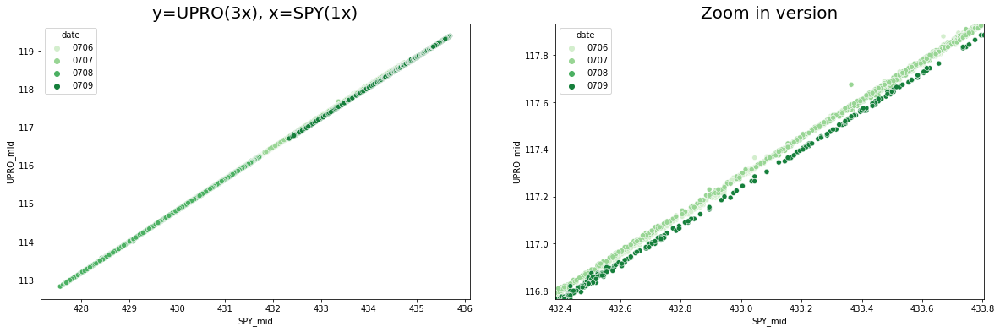

Residual plots for different curve fitting setup


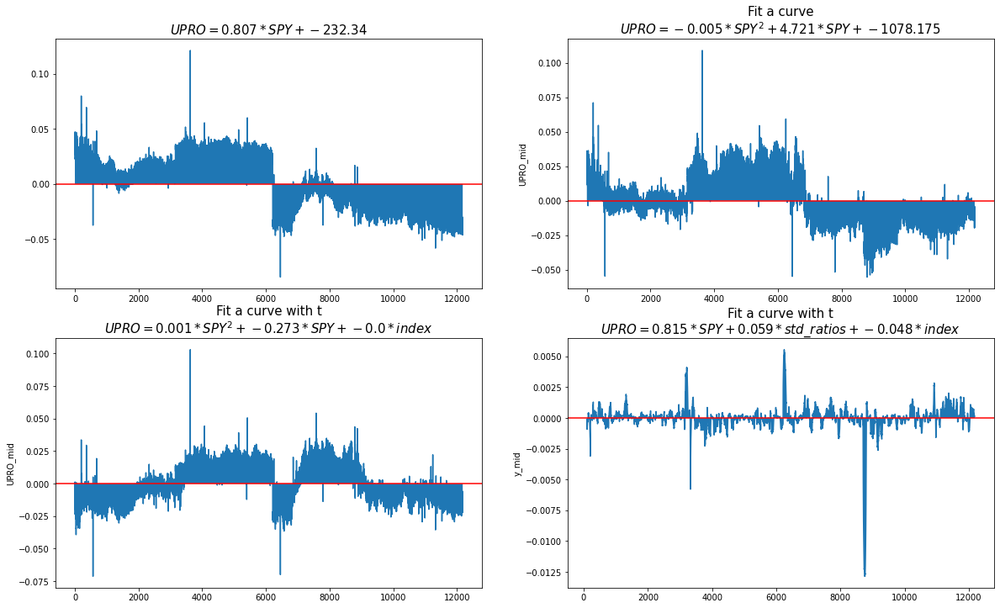

4. SSO and SPY
Relationship between y=SSO(2x) and x=SPY(1x)


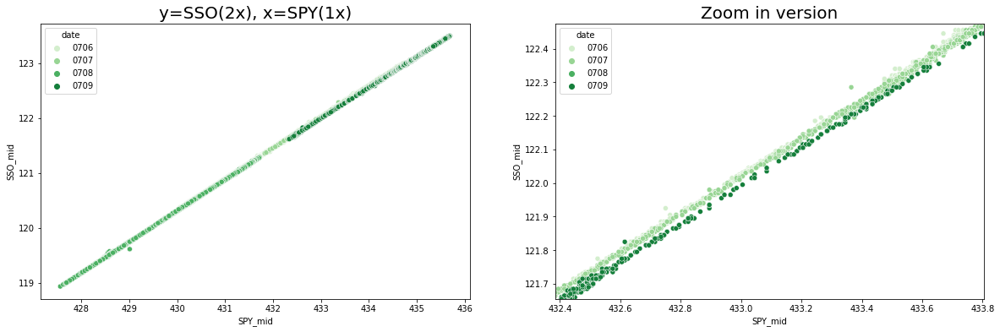

Residual plots for different curve fitting setup


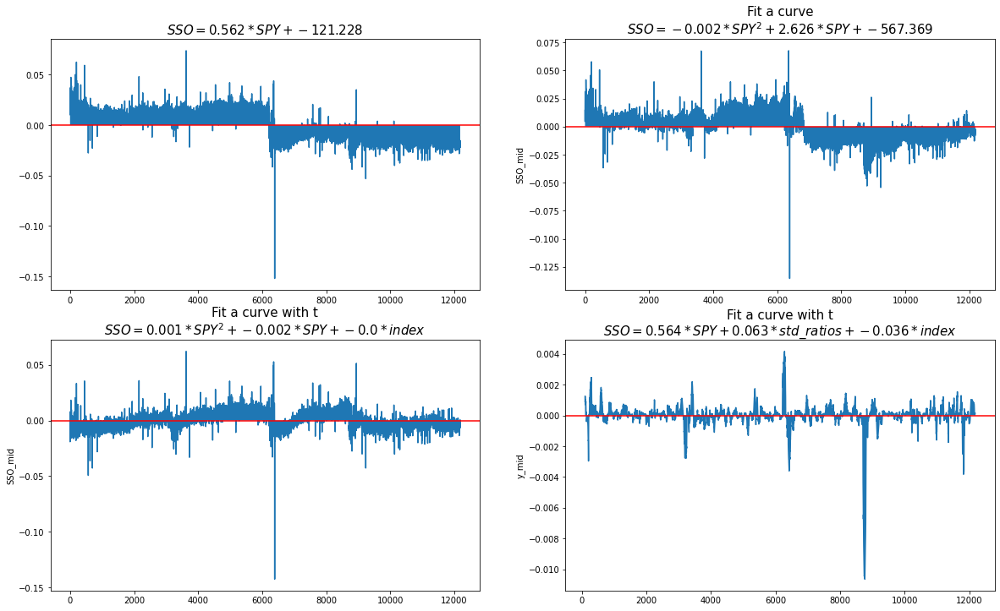

5. SPXU and SPY
Relationship between y=SPXU(-3x) and x=SPY(1x)


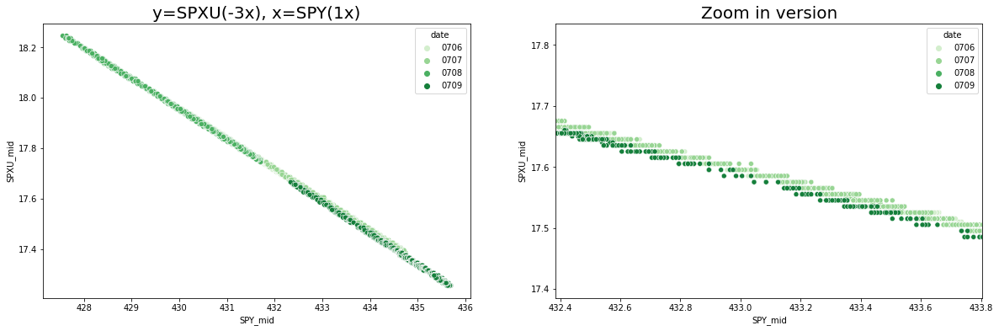

Residual plots for different curve fitting setup


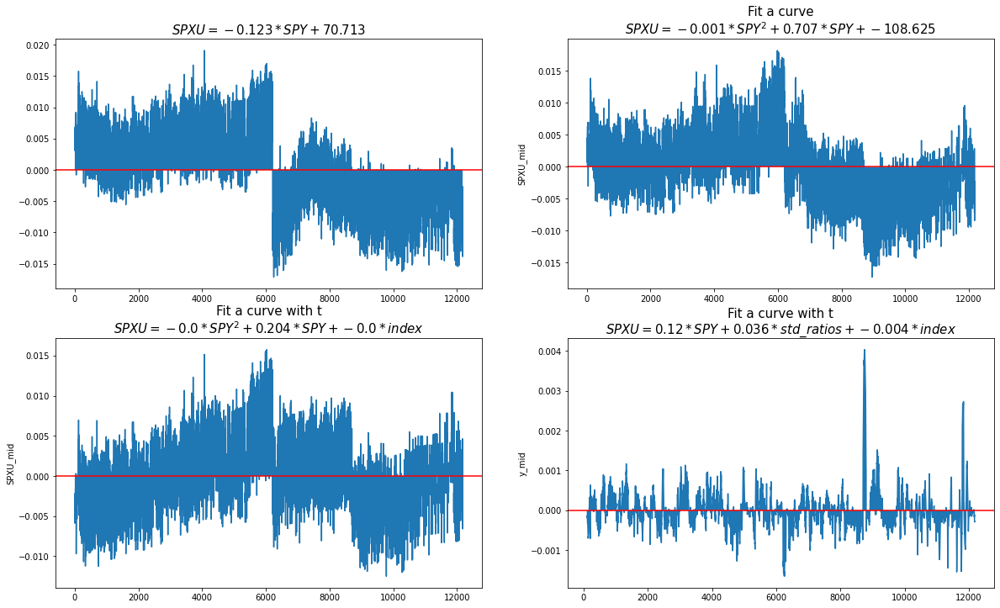

6. SH and SDS
Relationship between y=SH(-1x) and x=SDS(-2x)


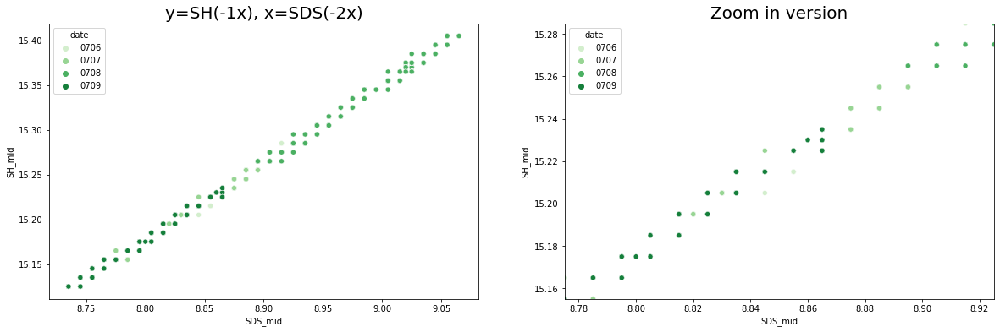

Residual plots for different curve fitting setup


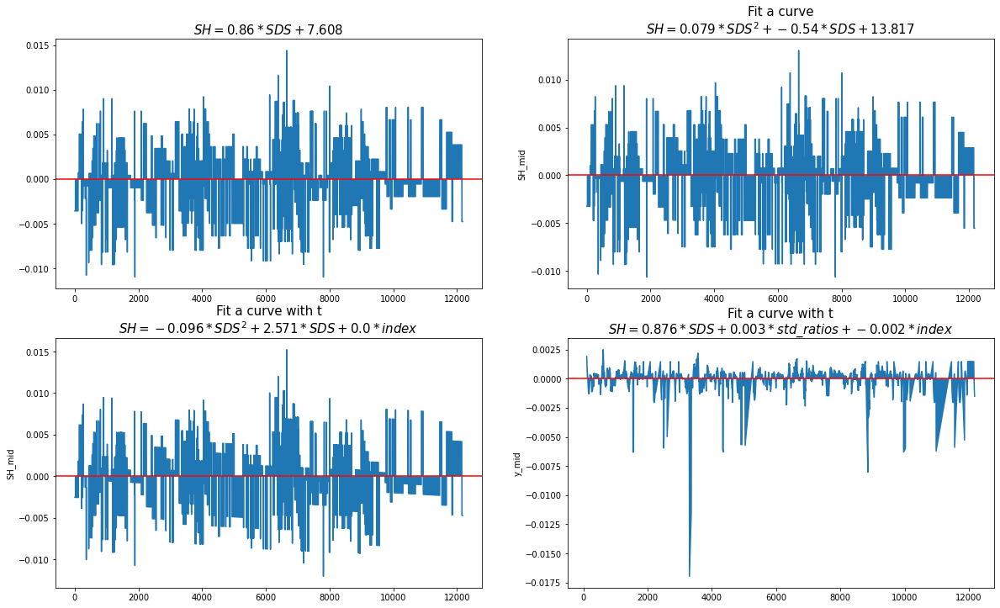

7. SH and UPRO
Relationship between y=SH(-1x) and x=UPRO(3x)


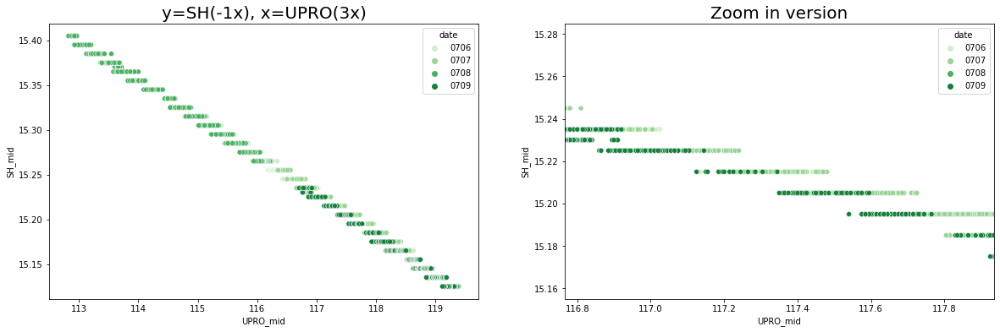

Residual plots for different curve fitting setup


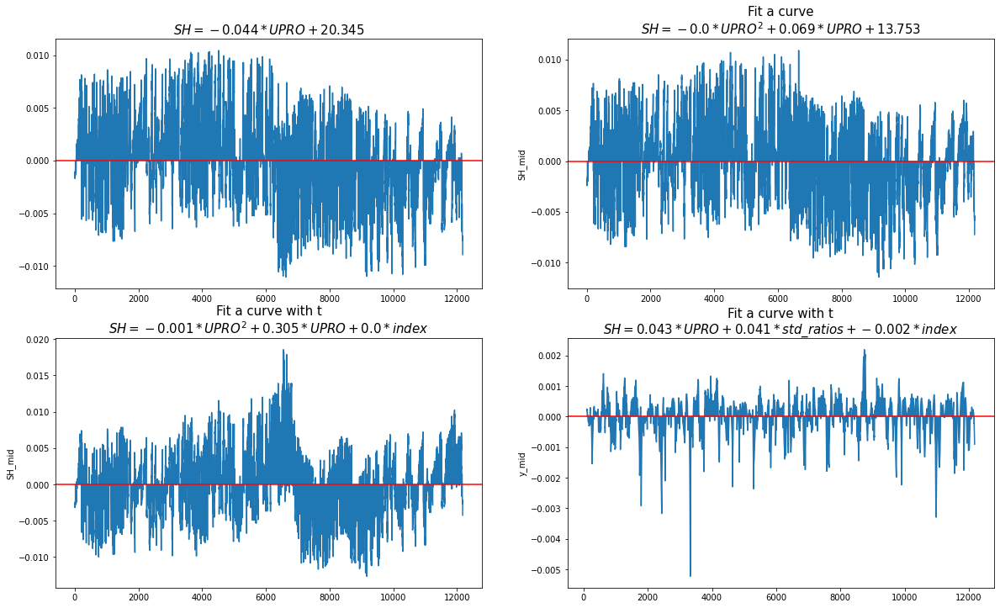

8. SH and SSO
Relationship between y=SH(-1x) and x=SSO(2x)


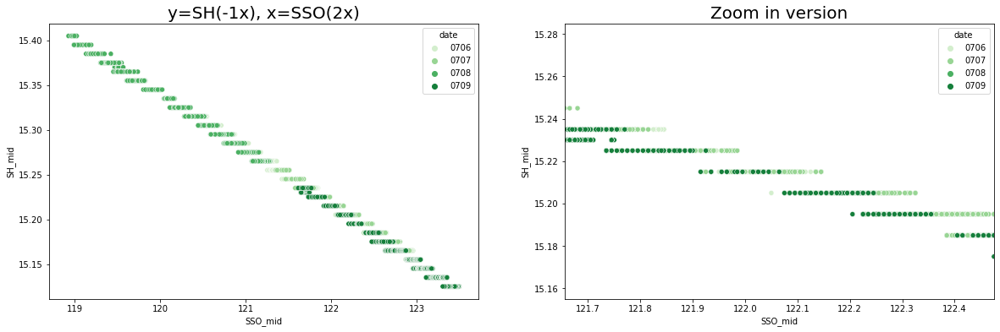

Residual plots for different curve fitting setup


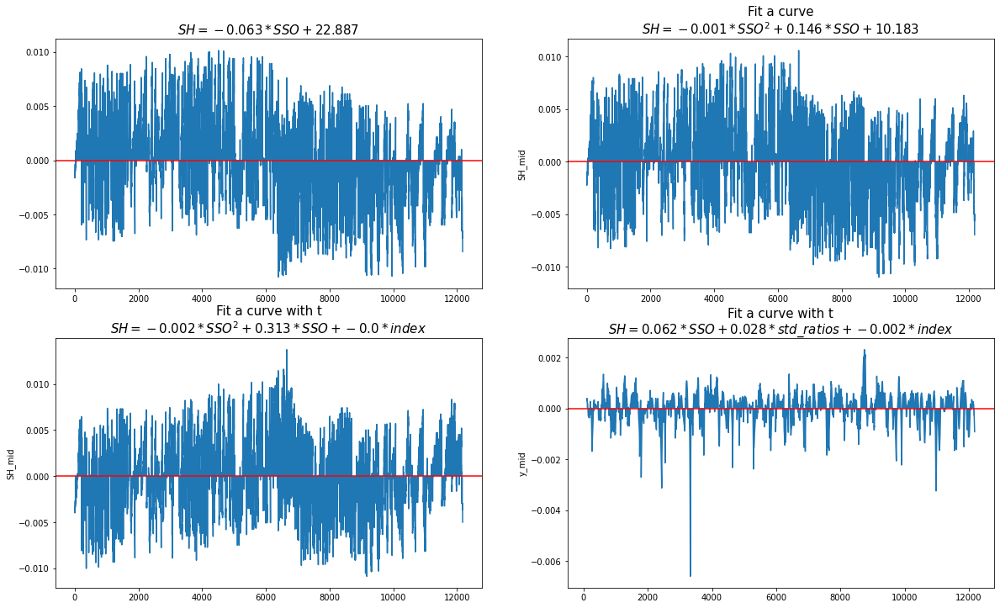

9. SH and SPXU
Relationship between y=SH(-1x) and x=SPXU(-3x)


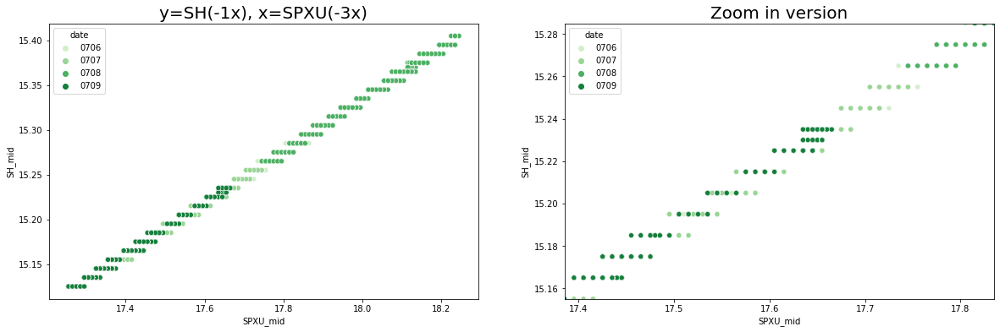

Residual plots for different curve fitting setup


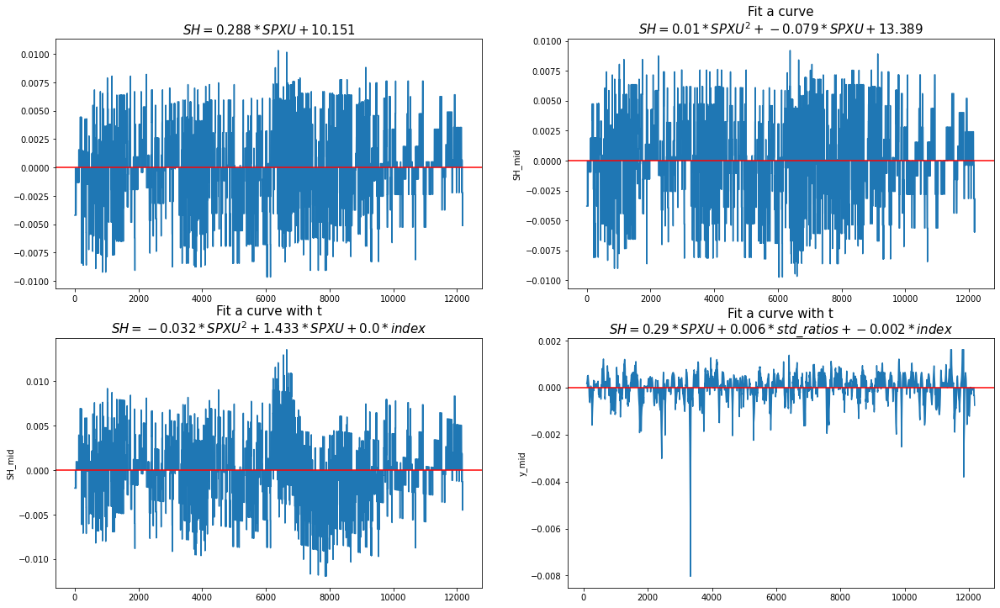

10. SDS and UPRO
Relationship between y=SDS(-2x) and x=UPRO(3x)


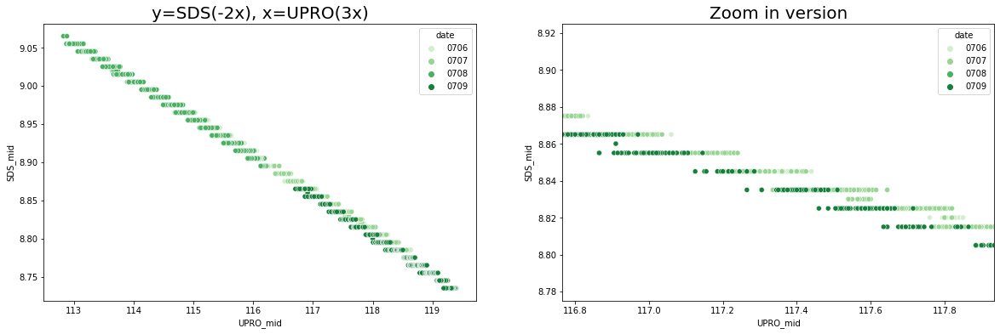

Residual plots for different curve fitting setup


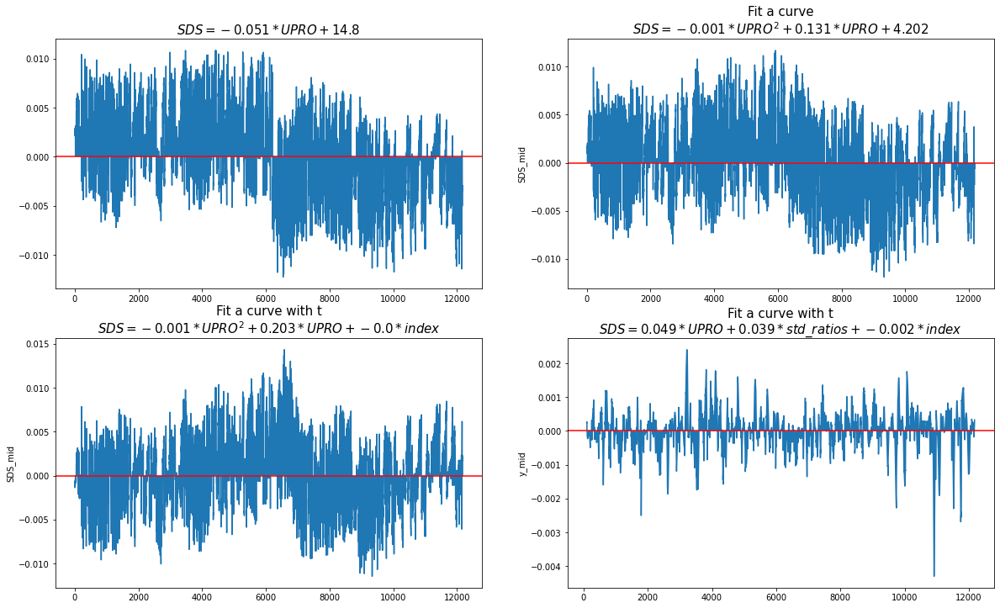

11. SDS and SSO
Relationship between y=SDS(-2x) and x=SSO(2x)


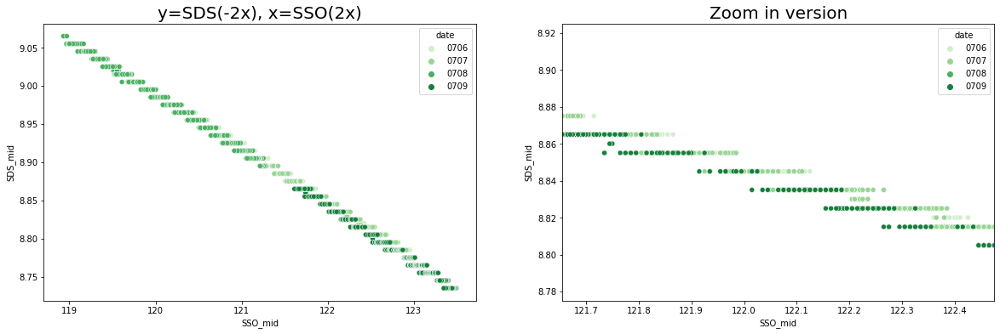

Residual plots for different curve fitting setup


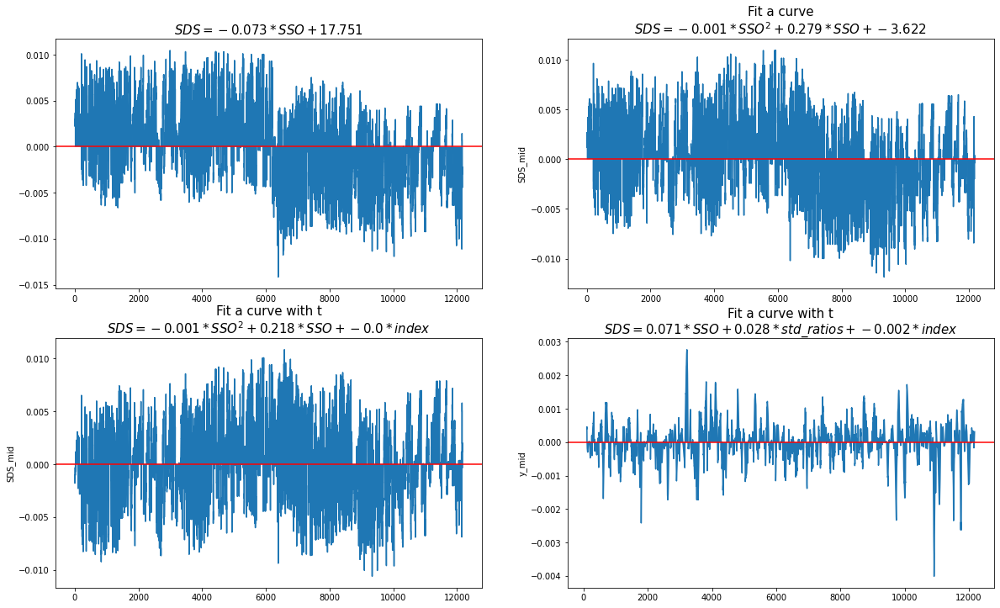

12. SDS and SPXU
Relationship between y=SDS(-2x) and x=SPXU(-3x)


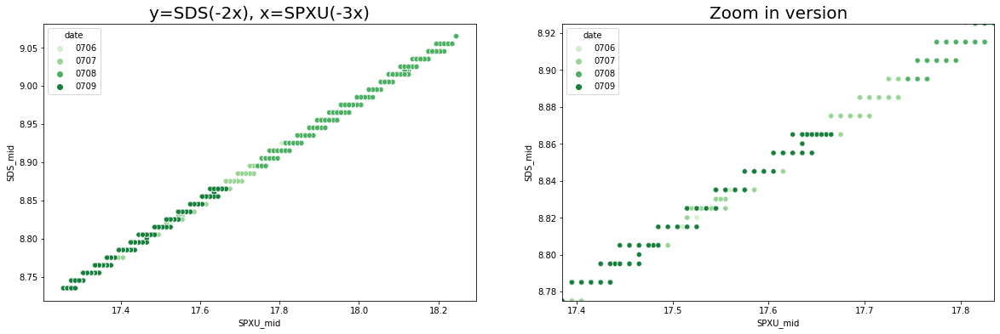

Residual plots for different curve fitting setup


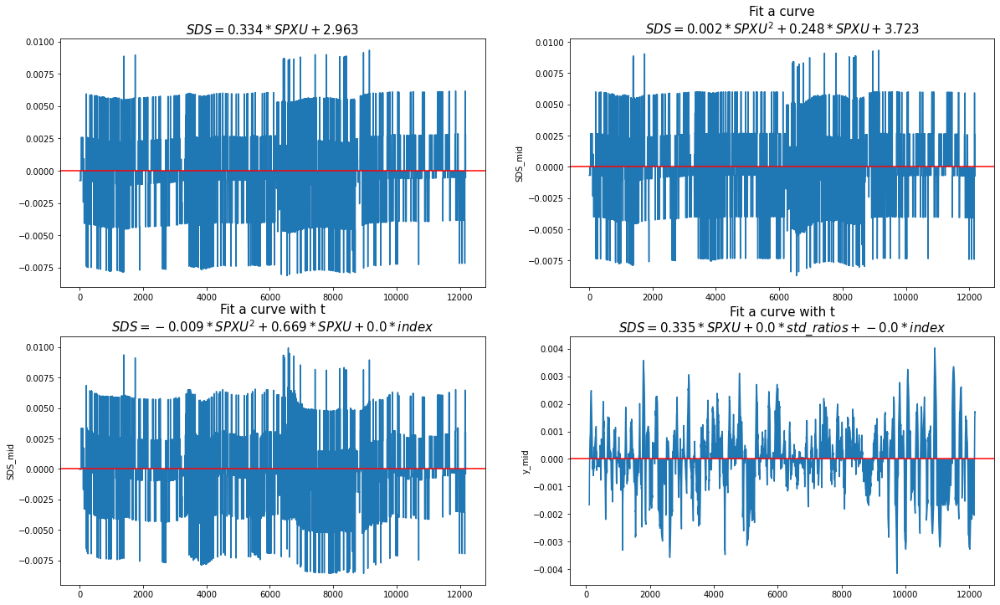

13. SSO and UPRO
Relationship between y=SSO(2x) and x=UPRO(3x)


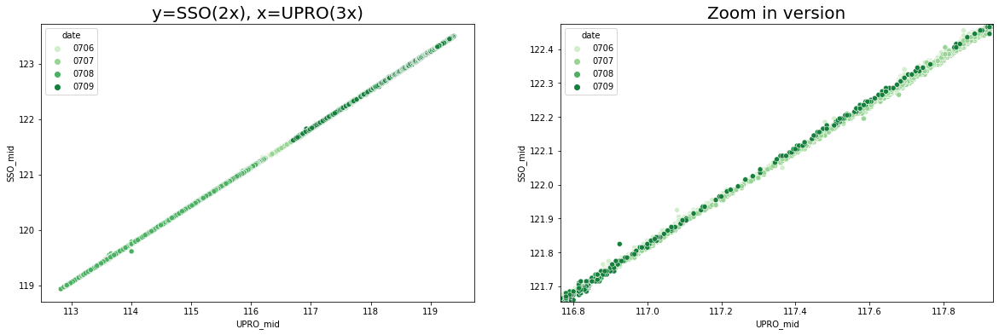

Residual plots for different curve fitting setup


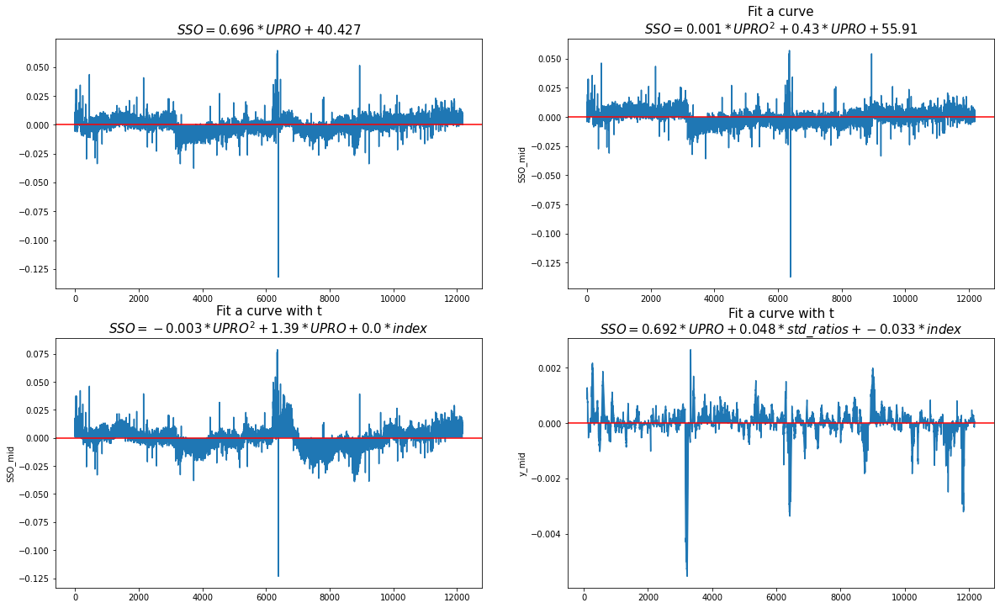

14. SPXU and UPRO
Relationship between y=SPXU(-3x) and x=UPRO(3x)


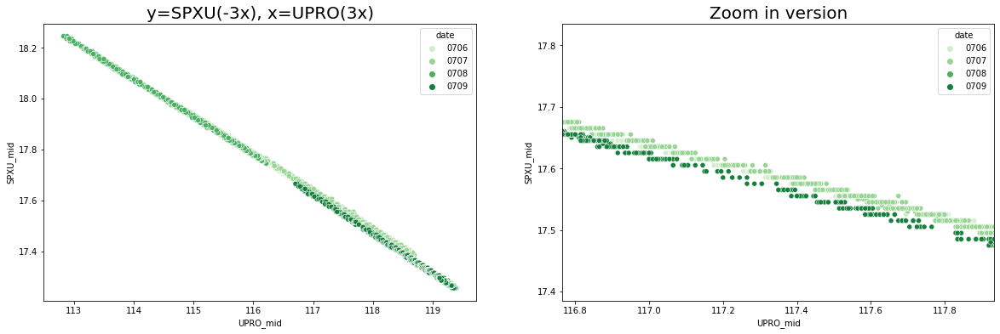

Residual plots for different curve fitting setup


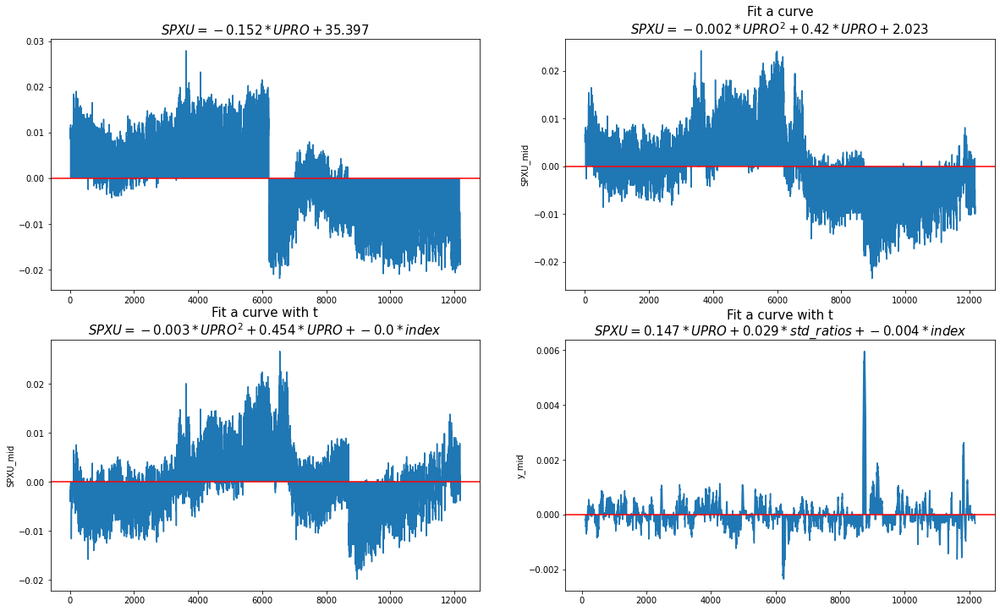

15. SPXU and SSO
Relationship between y=SPXU(-3x) and x=SSO(2x)


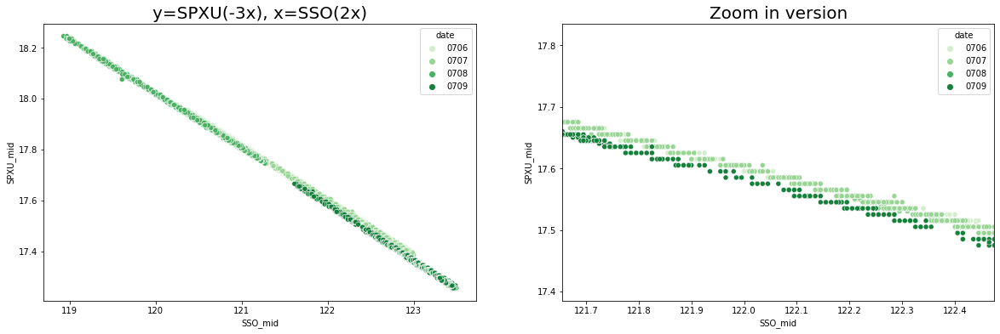

Residual plots for different curve fitting setup


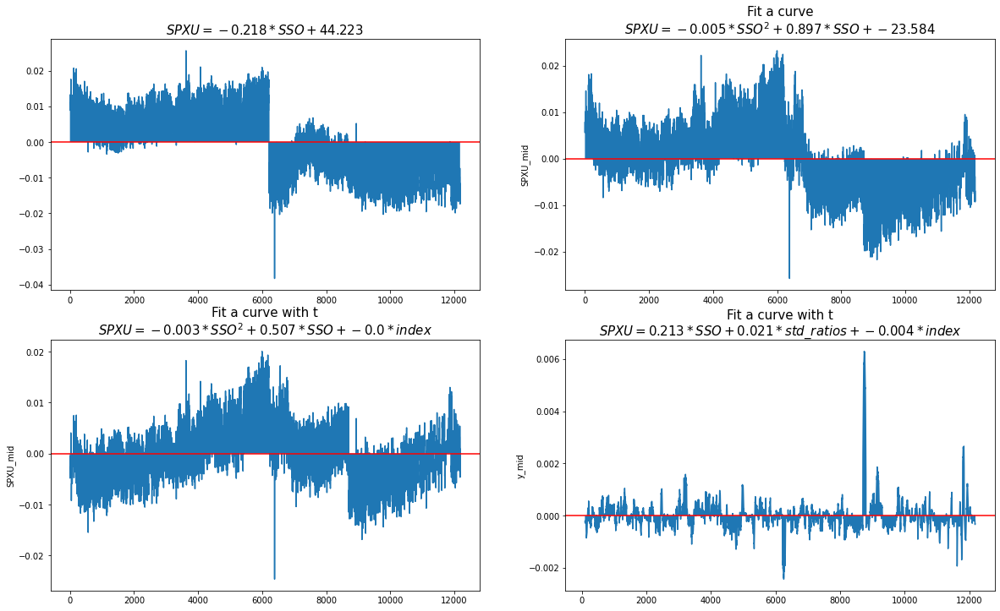

In [284]:
for i, (x_idx, y_idx) in enumerate(itertools.combinations(range(6), 2)):
    x_ticker, y_ticker = TICKERS[x_idx], TICKERS[y_idx]
    slope_theta = get_theoretical_slope(all_data, x_idx, y_idx)
    
    if abs(slope_theta) > 1:
        x_ticker, y_ticker = y_ticker, x_ticker
        x_idx, y_idx = y_idx, x_idx
    print("{}. {} and {}".format(i + 1, y_ticker, x_ticker))
    plot_curve(all_data, x_idx, y_idx)

1. SDS and SPXU
Relationship between y=SDS(-2x) and x=SPXU(-3x)


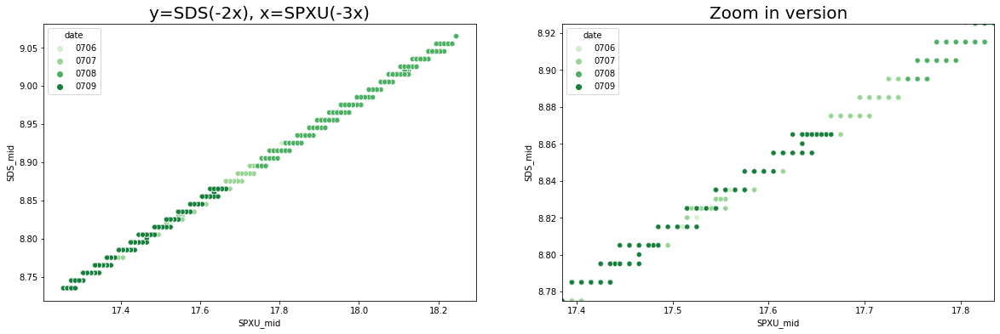

Residual plots for different curve fitting setup


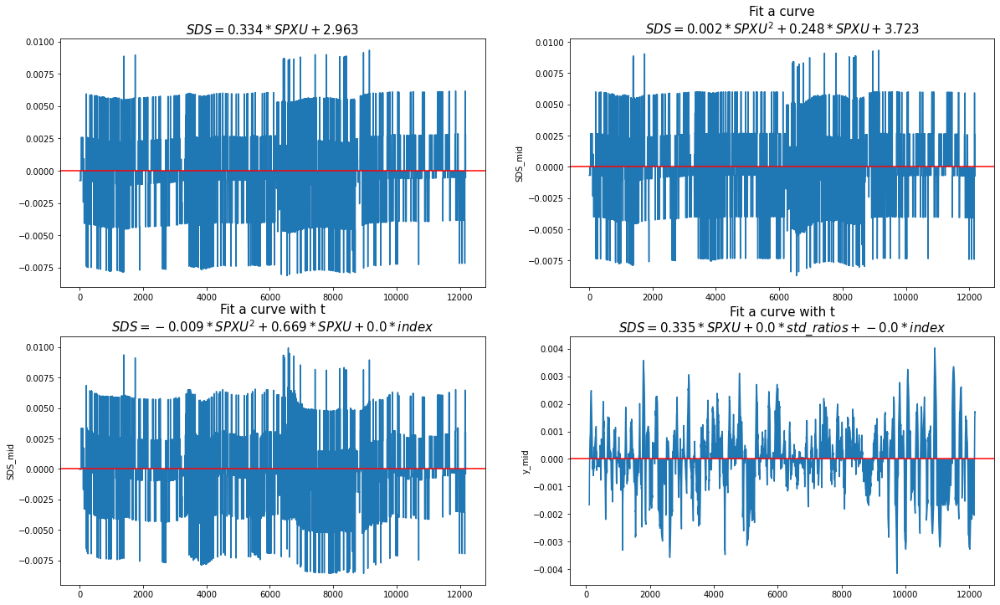

2. SSO and UPRO
Relationship between y=SSO(2x) and x=UPRO(3x)


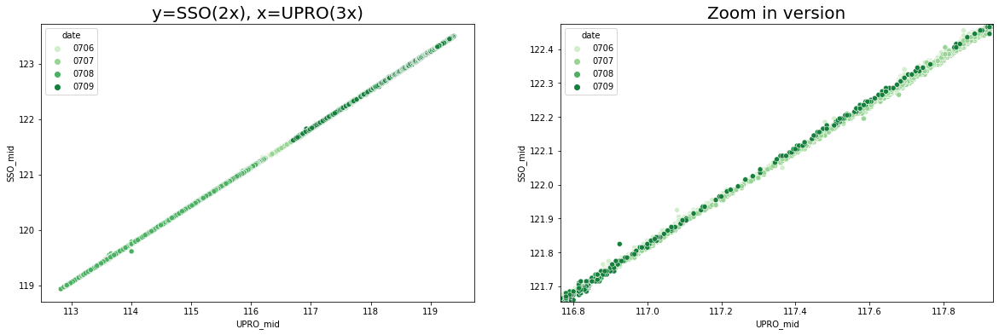

Residual plots for different curve fitting setup


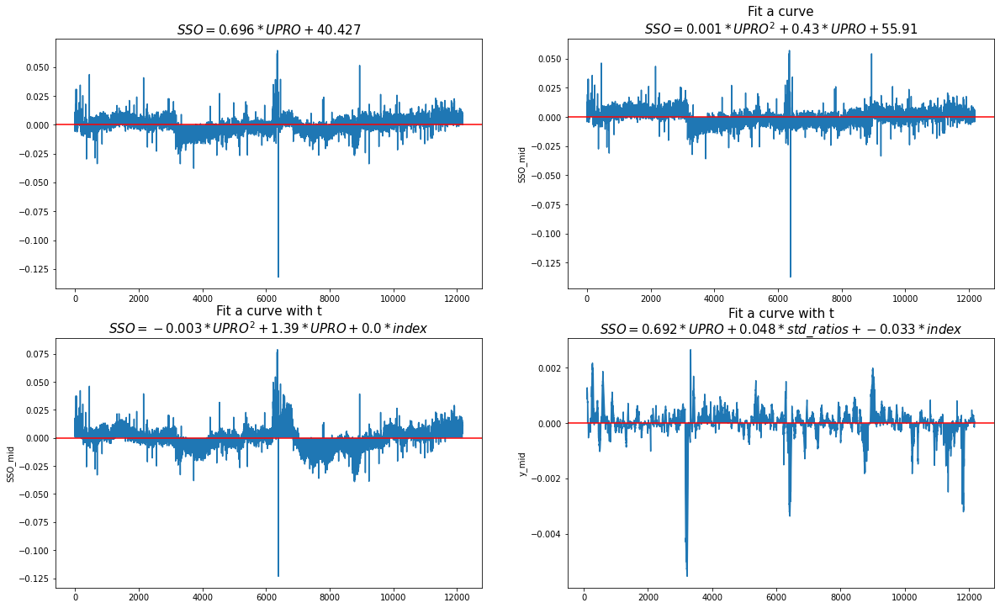

3. SH and SDS
Relationship between y=SH(-1x) and x=SDS(-2x)


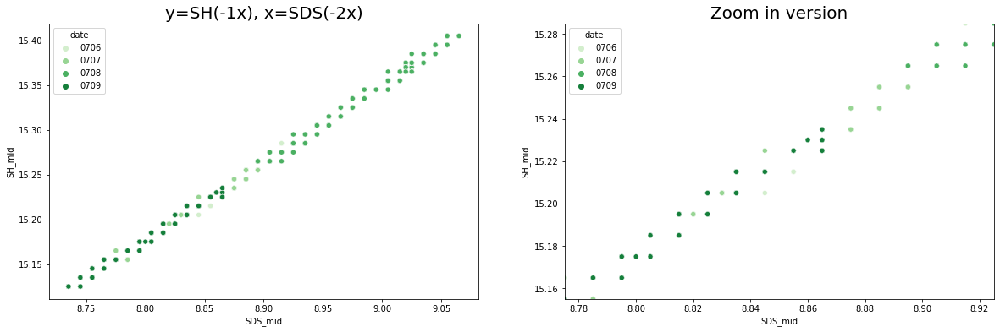

Residual plots for different curve fitting setup


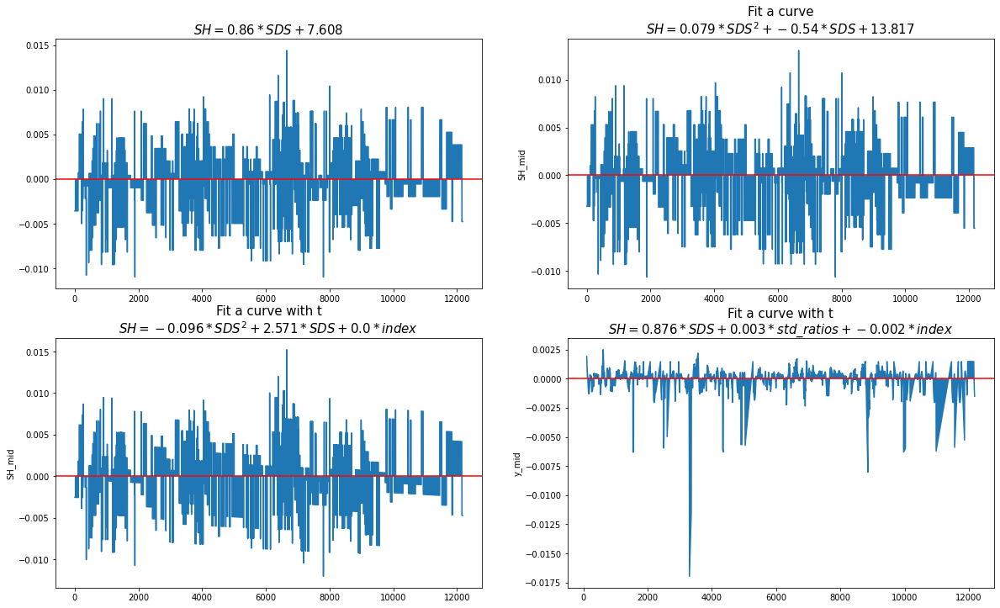

In [285]:
special_pairs = [("SDS", "SPXU"), ("SSO", "UPRO"), ("SH", "SDS")]
for i, (x_ticker, y_ticker) in enumerate(special_pairs):
    x_idx, y_idx = TICKERS2INDEX[x_ticker], TICKERS2INDEX[y_ticker]
    slope_theta = get_theoretical_slope(all_data, x_idx, y_idx)
    
    if abs(slope_theta) > 1:
        x_ticker, y_ticker = y_ticker, x_ticker
        x_idx, y_idx = y_idx, x_idx
    print("{}. {} and {}".format(i + 1, y_ticker, x_ticker))
    plot_curve(all_data, x_idx, y_idx)

## Perform the same analysis on return/log return

In [18]:
all_data

,time,SPY_bid,bid_size1,SPY_ask,ask_size1,SH_bid,bid_size2,SH_ask,ask_size2,SDS_bid,...,UPRO_mid,UPRO_imb,SSO_mid,SSO_imb,SPXU_mid,SPXU_imb,date,hour,date_hour,half_hour
0,2021-07-06 09:30:09.232986,433.50,6,433.51,99,15.19,5453,15.20,2631,8.82,...,117.690,0.500000,122.310,0.375000,17.535,0.598684,0706,09,0706-09,09:30-59
1,2021-07-06 09:30:18.059942,433.50,6,433.51,99,15.19,5453,15.20,2471,8.82,...,117.690,0.500000,122.300,0.416667,17.535,0.690167,0706,09,0706-09,09:30-59
2,2021-07-06 09:30:19.062293,433.47,28,433.49,6,15.19,5453,15.20,2471,8.82,...,117.680,0.250000,122.300,0.416667,17.535,0.690167,0706,09,0706-09,09:30-59
3,2021-07-06 09:30:29.072767,433.47,38,433.48,1,15.19,6674,15.20,2869,8.82,...,117.680,0.700000,122.310,0.800000,17.535,0.582067,0706,09,0706-09,09:30-59
4,2021-07-06 09:30:29.072767,433.47,38,433.48,1,15.19,6674,15.20,2869,8.82,...,117.680,0.700000,122.305,0.500000,17.535,0.582067,0706,09,0706-09,09:30-59
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12177,2021-07-09 15:59:19.323765,435.38,56,435.39,101,15.12,6612,15.13,7349,8.74,...,119.145,0.215385,123.325,0.184000,17.285,0.823682,0709,15,0709-15,15:30-59
12178,2021-07-09 15:59:29.261795,435.40,31,435.41,137,15.12,6612,15.13,7349,8.74,...,119.155,0.909091,123.335,0.078652,17.285,0.765425,0709,15,0709-15,15:30-59
12179,2021-07-09 15:59:39.276830,435.37,117,435.38,9,15.12,6612,15.13,7137,8.74,...,119.145,0.024390,123.325,0.011364,17.285,0.823567,0709,15,0709-15,15:30-59
12180,2021-07-09 15:59:49.328122,435.38,13,435.39,129,15.12,6612,15.13,7137,8.74,...,119.145,0.090909,123.325,0.073684,17.285,0.823378,0709,15,0709-15,15:30-59


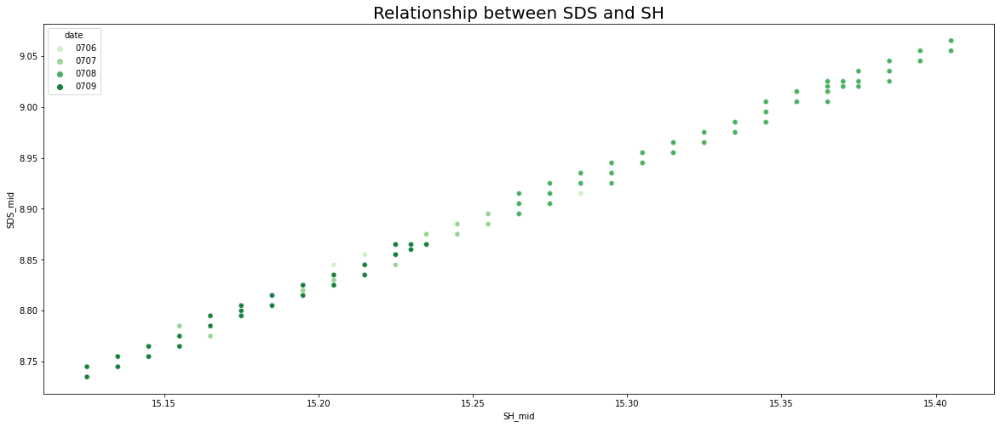